In [1]:
import os
import shutil
import pandas as pd
import numpy as np
import torch
from transformers import AutoModel, AutoTokenizer
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.metrics import silhouette_score
import pickle
import time

In [2]:
pwd = os.getcwd()

# Pick an ESM-2 model size
model_name = "facebook/esm2_t30_150M_UR50D"
tokenizer = AutoTokenizer.from_pretrained(model_name, do_lower_case=False)
model = AutoModel.from_pretrained(model_name)


CODON2AA = {'ATA':'I', 'ATC':'I', 'ATT':'I', 'ATG':'M',            # Map from codons to amino acids
            'ACA':'T', 'ACC':'T', 'ACG':'T', 'ACT':'T',
            'AAC':'N', 'AAT':'N', 'AAA':'K', 'AAG':'K',
            'AGC':'S', 'AGT':'S', 'AGA':'R', 'AGG':'R',
            'CTA':'L', 'CTC':'L', 'CTG':'L', 'CTT':'L',
            'CCA':'P', 'CCC':'P', 'CCG':'P', 'CCT':'P',
            'CAC':'H', 'CAT':'H', 'CAA':'Q', 'CAG':'Q',
            'CGA':'R', 'CGC':'R', 'CGG':'R', 'CGT':'R',
            'GTA':'V', 'GTC':'V', 'GTG':'V', 'GTT':'V',
            'GCA':'A', 'GCC':'A', 'GCG':'A', 'GCT':'A',
            'GAC':'D', 'GAT':'D', 'GAA':'E', 'GAG':'E',
            'GGA':'G', 'GGC':'G', 'GGG':'G', 'GGT':'G',
            'TCA':'S', 'TCC':'S', 'TCG':'S', 'TCT':'S',
            'TTC':'F', 'TTT':'F', 'TTA':'L', 'TTG':'L',
            'TAC':'Y', 'TAT':'Y', 'TAA':'*', 'TAG':'*',
            'TGC':'C', 'TGT':'C', 'TGA':'*', 'TGG':'W' }

Some weights of EsmModel were not initialized from the model checkpoint at facebook/esm2_t30_150M_UR50D and are newly initialized: ['esm.pooler.dense.bias', 'esm.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [3]:
def load_codoncounts(filepath):
    """Load in the dataframe for the codoncounts file"""
    df = pd.read_csv(filepath)
    column_names = df.columns.tolist()
    column_names = column_names[2:]
    wildtypes = df["wildtype"].tolist()
    df = df.drop(columns=["site", "wildtype"])
    df_array = df.to_numpy()
    return df_array, column_names, wildtypes

def count_unique_proteins(filepath=None, codon_array=None, 
                          column_names=None, wildtypes=None):
    """Count the number of unique proteins in the codon array"""
    if filepath is not None:
        codon_array, column_names, wildtypes = load_codoncounts(filepath)
    else:
        assert codon_array is not None
        assert column_names is not None
        assert wildtypes is not None
    
    count_unique = 0
    # iterate through each row
    for i in range(codon_array.shape[0]):
        row = codon_array[i]
        for j in range(row.shape[0]):
            if row[j] > 0 and column_names[j] != wildtypes[i]:
                count_unique += 1
    return count_unique

def get_reference_sequence(filepath):
    """Get the reference sequence from a text file"""
    with open(filepath, 'r') as f:
        reference_sequence = f.read().strip()
    
    reference_protein_sequence = ""
    for i in range(0, len(reference_sequence), 3):
        codon = reference_sequence[i:i+3]
        aa = CODON2AA.get(codon, 'X')  # Use 'X' for unknown codons
        reference_protein_sequence += aa
    return reference_protein_sequence


def get_day_estimate(filepath):
    codon_array, column_names, wildtypes = load_codoncounts(filepath)
    total_unique = count_unique_proteins(codon_array=codon_array, 
                                         column_names=column_names, 
                                         wildtypes=wildtypes)
    row_number = codon_array.shape[0] # number of sites
    day_estimate = total_unique * row_number / 100000
    return day_estimate

def count_total_proteins(filepath):
    """Sum the total number of proteins in a single row"""
    codon_array, column_names, wildtypes = load_codoncounts(filepath)
    # sum along the first row
    total_proteins = np.sum(codon_array[0, :])
    return total_proteins
    

def write_codon_replicates(replicates_pre: list, replicates_post: list, output_path: str, reference_seq: str):
    """Write the codon changes from multiple replicates to a single file"""
    assert len(replicates_pre) == len(replicates_post), "Number of pre and post replicate files must be the same"
    codon_arrays_pre = []
    codon_arrays_post = []
    loaded_wildtypes, loaded_columns = False, False
    wildtypes_master = []
    columns_master = []
    for filepath in replicates_pre:
        codon_array, column_names, wildtypes = load_codoncounts(filepath)
        codon_arrays_pre.append(codon_array)
        if not loaded_wildtypes:
            loaded_wildtypes = True
            wildtypes_master = wildtypes
        if not loaded_columns:
            loaded_columns = True
            columns_master = column_names
        assert (wildtypes == wildtypes_master), "Wildtypes do not match across replicates"
        assert (column_names == columns_master), "Column names do not match across replicates"
    
    for filepath in replicates_post:
        codon_array, column_names, wildtypes = load_codoncounts(filepath)
        codon_arrays_post.append(codon_array)
        assert (wildtypes == wildtypes_master), "Wildtypes do not match across replicates"
        assert (column_names == columns_master), "Column names do not match across replicates"
        
    column_names_aa = [CODON2AA.get(codon, 'X') for codon in columns_master]
    wildtypes_aa = [CODON2AA.get(codon, 'X') for codon in wildtypes_master]
    new_prot_seqs = []
    pre_num_array = []
    post_num_array = []
    with open (output_path, 'w') as f:
        f.write("PreNums,PostNums,ProteinSequence\n")
        # Iteratre through each row
        for i in range(codon_arrays_pre[0].shape[0]):
            rows_pre = [pre_array[i] for pre_array in codon_arrays_pre]
            rows_post = [post_array[i] for post_array in codon_arrays_post]
            for j in range(rows_pre[0].shape[0]):
                if column_names_aa[j] != wildtypes_aa[i]:
                    pre_nums = [int(pre_row[j]) for pre_row in rows_pre]
                    post_nums = [int(post_row[j]) for post_row in rows_post]
                    
                    pre_num_array.append(pre_nums)
                    post_num_array.append(post_nums)
                    
                    amino_acid = column_names_aa[j]
                    
                    new_prot_seq = reference_seq[:i] + amino_acid + reference_seq[i+1:]
                    new_prot_seqs.append(new_prot_seq)
                    f.write(f"{pre_nums},{post_nums},{new_prot_seq}\n")
                    
    # save a pickle dataframe too
    
    new_df = pd.DataFrame({
        'PreNums': pre_num_array,
        'PostNums': post_num_array,
        'ProteinSequence': new_prot_seqs
    })
    
    def ensure_list(v):
        """Convert a value to a list of numbers if it is a string or array."""
        if isinstance(v, str):
            return ast.literal_eval(v)  # safely convert string like "[1, 2, 3]" → list
        elif isinstance(v, np.ndarray):
            return v.tolist()
        elif isinstance(v, (list, tuple)):
            return list(v)
        else:
            raise TypeError(f"Unexpected type in PreNums/PostNums: {type(v)}")

    new_df["PreNums"] = new_df["PreNums"].map(ensure_list)
    new_df["PostNums"] = new_df["PostNums"].map(ensure_list)

    new_df = new_df.groupby("ProteinSequence", as_index=False).agg({
        "PreNums": lambda x: [sum(vals) for vals in zip(*x)],
        "PostNums": lambda x: [sum(vals) for vals in zip(*x)],
    })
    
    new_df.to_pickle(output_path.replace('.csv', '.pkl'))
        
    
   
    
def embed_sequence(sequence: str, tokenizer, model) -> np.ndarray:
    """Embed the sequence to a fixed size vector using ESM-2"""

    inputs = tokenizer(sequence, return_tensors="pt", add_special_tokens=True)
    with torch.no_grad():

        outputs = model(**inputs, output_hidden_states=True)
        hidden_states = outputs.hidden_states


    output_embeddings = []
    for layer in hidden_states:
        token_representations = layer
        #print(token_representations.shape)  # Shape: (1, sequence_length, embedding_dim)        s
        sequence_embedding = pool_sequence_representation(token_representations, inputs)
        output_embeddings.append(sequence_embedding)
        #print(sequence_embedding.shape)  # Shape: (embedding_dim,)
    return np.vstack(output_embeddings)  # Shape: (num_layers, embedding_dim)

def pool_sequence_representation(token_representations, inputs) -> np.ndarray:
    """Pool the token representations to get a fixed-size sequence representation."""
    # token_representations shape: (1, sequence_length, embedding_dim)
    # inputs['attention_mask'] shape: (1, sequence_length)
    attention_mask = inputs['attention_mask']
    masked_representations = token_representations * attention_mask.unsqueeze(-1)
    summed = masked_representations.sum(dim=1)
    counts = attention_mask.sum(dim=1).unsqueeze(-1)
    pooled_representation = summed / counts
    return pooled_representation.squeeze(0).cpu().numpy()  # Shape: (embedding_dim,)


def embed_replicates(embedding_df: pd.DataFrame, 
                     output_path: str,
                     embed_zeroes: bool=False,
                     esm_model: str="facebook/esm2_t30_150M_UR50D") -> None:
    """Embed the sequeunces given the replicates embedding dataframe from
    write_codon_replicates() """
    start_time = time.time()
    pre_counts = embedding_df["PreNums"].to_list()
    post_counts = embedding_df["PostNums"].to_list()
    
    tokenizer = AutoTokenizer.from_pretrained(esm_model, do_lower_case=False)
    model = AutoModel.from_pretrained(esm_model)
    
    embeddings = []
    for i, prot_sequence in enumerate(embedding_df["ProteinSequence"].to_list()):
        if embed_zeroes:
            embedding = embed_sequence(prot_sequence, tokenizer, model)
            embeddings.append(embedding)
        else:
            if any([x > 0 for x in pre_counts[i]]):
                embedding = embed_sequence(prot_sequence, tokenizer, model)
                embeddings.append(embedding)
            else:
                embeddings.append(None)
        if i % 100 == 0:
            cur_time = time.time()
            estimate_remaining = (cur_time - start_time) / (i + 1) * (len(embedding_df) - (i + 1))
            print(f"Embedded {i} sequences, time elapsed: {cur_time - start_time:.2f} seconds, estimated time remaining: {estimate_remaining/60:.2f} minutes")
    
    
    embedding_df['Embeddings'] = embeddings
    embedding_df.to_pickle(output_path)
    print(f"Wrote embeddings to {output_path}")


# Now, let's analyze these dang embeddings
def calc_cov_mats(embeddings: np.ndarray, pre_weights: np.ndarray, 
                  post_weights: np.ndarray, layer: int = None) -> np.ndarray:
    """
    Calculate the covariance matrices for the before and after counts
    embeddings: 3 dimensional array of shape (num_sequences, num_layers, embedding_dim)
    layer: which layer to use for the embeddings, if None, use all layers
    """
    
    if layer is not None:
        embeddings = embeddings[:, layer, :]
        
    
    before_cov = np.cov(embeddings.T, aweights=pre_weights)
    after_cov = np.cov(embeddings.T, aweights=post_weights)
    return before_cov, after_cov

def calc_cov_mats_reps(embeddings: np.ndarray, pre_weights: np.ndarray, 
                       post_weights: np.ndarray, layer: int = None) -> np.ndarray:
    """
    Calculate the covariance matrices for the before and after counts
    embeddings: 3 dimensional array of shape (num_sequences, num_layers, embedding_dim)
    layer: which layer to use for the embeddings, if None, use all layers
    """
    num_reps = pre_weights.shape[1]
    if layer is not None:
        embeddings = embeddings[:, layer, :]
        
    before_covs = []
    after_covs = []
    for rep in range(num_reps):
        before_cov = np.cov(embeddings.T, aweights=pre_weights[:, rep])
        after_cov = np.cov(embeddings.T, aweights=post_weights[:, rep])
        before_covs.append(before_cov)
        after_covs.append(after_cov)
    return before_covs, after_covs
    


def embedding_df_transfer(embed_df: pd.DataFrame) -> dict:
    """
    Format of embed_df:
         PreNums   PostNums   ProteinSequence  Embeddings
    0  [0, 0, 0]  [0, 0, 0]   MKT...           [[...], [...], ...]
    

    Format of RepNDataFrame:
    generation, embedding, frequency, replicate
    
    
    Key Differences:
    We will not have sites and amino acids. Instead, we will have 
    the N embedding dimensions 
    """
    
    pre_counts = np.array([np.array(x) for x in embed_df["PreNums"].to_list()])
    post_counts = np.array([np.array(x) for x in embed_df["PostNums"].to_list()])
    embeddings = np.array([x for x in embed_df["Embeddings"].to_list()])
    print("done converting to arrays")
    num_reps = pre_counts.shape[1]
    num_gens = 2 # set to 2 for now, pre and post selection
    
    new_df = pd.DataFrame(columns=["Generation", "Embedding", "Frequency", "Replicate"])
    print("initialized new df")
    for rep in range(num_reps):
        # loop through every row
        print(f"on replicate {rep}")
        for i in range(embed_df.shape[0]):
            print(f"on embedding {i}")
            if embeddings[i] is not None:
                # loop through every generation
                for gen in range(num_gens):
                    print(f"on generation {gen}")
                    if gen == 0:
                        freq = pre_counts[i, rep]
                    else:
                        freq = post_counts[i, rep]
                        
                    if gen == 0 and freq == 0:
                        continue
                        
                    new_row = {
                        "Generation": gen,
                        "Embedding": embeddings[i],
                        "Frequency": freq,
                        "Replicate": rep+1
                    }
                    new_df = pd.concat([new_df, pd.DataFrame([new_row])], ignore_index=True)
                    
    return new_df
        
    
import pandas as pd
import numpy as np

def embedding_df_transfer_optimized(embed_df: pd.DataFrame) -> pd.DataFrame:
    """
    An optimized function to transform the embeddings DataFrame.
    It avoids repeated concatenation by building a list of records first.
    """
    
    # --- Step 1: Extract data into efficient structures ---
    # Using .to_list() and np.array is much faster than accessing pandas Series
    # elements one-by-one inside the loops.
    pre_counts = np.array(embed_df["PreNums"].to_list())
    post_counts = np.array(embed_df["PostNums"].to_list())
    embeddings = embed_df["Embeddings"].to_list()
    
    num_variants = len(embeddings)
    if num_variants == 0:
        return pd.DataFrame(columns=["Generation", "Embedding", "Frequency", "Replicate"])
    
    num_reps = pre_counts.shape[1]
    
    # --- Step 2: Build a list of records (dictionaries) ---
    # Appending to a list is vastly more efficient than concatenating DataFrames.
    data_list = []
    
    # --- Step 3: Loop and append records to the list ---
    # This logic is identical to your original function.
    for i in range(num_variants):
        # Skip rows where the embedding is missing
        if embeddings[i] is None:
            continue
            
        for rep in range(num_reps):
            # --- Handle Generation 0 (pre-selection) ---
            pre_freq = pre_counts[i, rep]
            
            # This is the direct translation of your original condition:
            # `if gen == 0 and freq == 0: continue`
            if pre_freq > 0:
                data_list.append({
                    "Generation": 0,
                    "Embedding": embeddings[i],
                    "Frequency": pre_freq,
                    "Replicate": rep + 1
                })

            # --- Handle Generation 1 (post-selection) ---
            # In your original logic, the post-selection row is always added,
            # so we do the same here.
            post_freq = post_counts[i, rep]
            data_list.append({
                "Generation": 1,
                "Embedding": embeddings[i],
                "Frequency": post_freq,
                "Replicate": rep + 1
            })
            
    # --- Step 4: Create the DataFrame in a single, efficient operation ---
    if not data_list:
        return pd.DataFrame(columns=["Generation", "Embedding", "Frequency", "Replicate"])
        
    return pd.DataFrame(data_list)

In [32]:
# reload popDMS

import popDMS
import pandas as pd
import pickle
from importlib import reload

# reload popDMS
reload(popDMS)

def run_inference_calcs(layer_df, output_path):
    """Run the inference calculations:
    WHOLE PIPELINE FROM READING IN EMBEDDINGS DATAFRAME
    """
    inference_df = embedding_df_transfer_optimized(layer_df)
    
    # make directory
    if not os.path.exists(output_path):
        os.makedirs(output_path)
    # save inference_df
    inference_df.to_pickle(output_path + 'inference_df.pkl')
    
    inference_df = pd.read_pickle(output_path + 'inference_df.pkl')    
    data = popDMS.mini_infer_independent_esm(inference_df, n_replicates=3,
                                            output_dir=output_path)
    return data # data = [dx, icov, s, s_joint, sel_data, gamma_opt, x_array]
    
    
    

def analyze_layers(whole_df, output_path=None, embed_path=None, dataname='BF520'):
    nonzero_df = whole_df[whole_df["Embeddings"].notnull()].reset_index(drop=True)
    layer_count = nonzero_df["Embeddings"][0].shape[0]
    
    layer_dfs = []
    
    for layer in range(layer_count):
        layer_df = nonzero_df.copy()
        layer_df["Embeddings"] = layer_df["Embeddings"].apply(lambda x: x[layer])
        layer_dfs.append(layer_df)
        
        if embed_path is None:
            embed_path = pwd + f'/data/sequence_data/'
        if not os.path.exists(embed_path):
            os.makedirs(embed_path)
        
        # only make the pickle file if it doesn't exist
        if not os.path.exists(embed_path + f'{dataname}_protein_embeddings_layer{layer}.pkl'):
            layer_df.to_pickle(embed_path + f'{dataname}_protein_embeddings_layer{layer}.pkl')
        #print(f"Wrote layer {layer} dataframe to pickle")
    
    if output_path is None:
        output_path = pwd + '/data/inference_results/layer_analysis/'
    
    layer_results = []
    for layer in range(layer_count):
        print(f"Analyzing layer {layer}")
        layer_df = layer_dfs[layer]
        layer_path = output_path + f'layer{layer}/'
        if not os.path.exists(layer_path):
            os.makedirs(layer_path)
        
        #print(f"layer_df: {layer_df.head()}")
        
        # data = [dx, icov, s, s_joint, sel_data, gamma_opt, x_array] for layer
        data = run_inference_calcs(layer_df, layer_path) 
        layer_results.append(data)
        with open(layer_path + 'inference_results.pkl', 'wb') as f:
            pickle.dump(data, f)
        print(f"Wrote inference results for layer {layer}")
    return layer_results

# EXAMPLES

### Checking basic file properties

In [5]:
pwd = os.getcwd()

data_dir = pwd + '/data/raw_data/'
test_file = data_dir + 'BF520_mutDNA-1_codoncounts.csv'
reference_sequence_file = data_dir + "BF520_Reference_sequence.txt"

In [ ]:
# The ending file has more unique proteins than the beginning? I guess some mutations occured

print(count_unique_proteins(filepath=data_dir+'BF520_mutDNA-1_codoncounts.csv'))
print(count_unique_proteins(filepath=data_dir+'BF520_mutvirus-1_codoncounts.csv'))
print(get_day_estimate(test_file))
print(count_total_proteins(data_dir+'BF520_mutDNA-1_codoncounts.csv'))
print(count_total_proteins(data_dir+'BF520_mutvirus-1_codoncounts.csv'))

### Writing the codon sequence to a file from the frequency table and reference

In [ ]:


pwd = os.getcwd()

data_dir = pwd + '/data/raw_data/'
reference_sequence_file = data_dir + "BF520_Reference_sequence.txt"
output_file = pwd + '/data/sequence_data/all_reps_BF520_protein_sequences.csv'

pre_selection_files = [data_dir+'BF520_mutDNA-1_codoncounts.csv',
                       data_dir+'BF520_mutDNA-2_codoncounts.csv',
                       data_dir+'BF520_mutDNA-3_codoncounts.csv']

post_selection_files = [data_dir+'BF520_mutvirus-1_codoncounts.csv',
                        data_dir+'BF520_mutvirus-2_codoncounts.csv',
                        data_dir+'BF520_mutvirus-3_codoncounts.csv']


write_codon_replicates(pre_selection_files,
                            post_selection_files,
                            output_file,
                            get_reference_sequence(reference_sequence_file))

### Embedding the sequence data using esm
embed_zeroes is if we bother embedding those embeddings with 0s everywhere

In [ ]:
# Load in the pickle filke
embedding_df = pd.read_pickle(pwd + '/data/sequence_data/all_reps_BF520_protein_sequences.pkl')

print(len(embedding_df["ProteinSequence"][0]))

embed_replicates(embedding_df, pwd + '/data/sequence_data/all_reps_BF520_protein_embeddings.pkl', embed_zeroes=False)

### Calculating Covariance Matrices

In [ ]:
embedding_df = pd.read_pickle(pwd + '/data/sequence_data/all_reps_BF520_protein_embeddings.pkl')

before_cov, after_cov = calc_cov_mats_reps(embeddings, pre_weights, post_weights, layer=29)
cov_diffs = [after - before for before, after in zip(before_cov, after_cov)]

### Calculating Selection Coefficients from embeddings

In [ ]:
whole_df = pd.read_pickle(pwd + '/data/sequence_data/all_reps_BF520_protein_embeddings.pkl')

reload(popDMS)

layer_results = analyze_layers(whole_df)

# TESTING

In [36]:
whole_df = pd.read_pickle(pwd + '/data/sequence_data/all_reps_BF520_protein_embeddings.pkl')

print(whole_df.head())


          PreNums         PostNums  \
0       [0, 0, 0]        [0, 0, 0]   
1       [0, 0, 0]        [0, 0, 0]   
2       [0, 0, 0]        [0, 0, 0]   
3       [0, 0, 0]        [0, 0, 0]   
4  [110, 164, 94]  [114, 173, 207]   

                                     ProteinSequence  \
0  KGNLWVTVYYGVPVWKDAETTLFCASDAKAYDAEVHNIWATHACVP...   
1  NGNLWVTVYYGVPVWKDAETTLFCASDAKAYDAEVHNIWATHACVP...   
2  KGNLWVTVYYGVPVWKDAETTLFCASDAKAYDAEVHNIWATHACVP...   
3  NGNLWVTVYYGVPVWKDAETTLFCASDAKAYDAEVHNIWATHACVP...   
4  TGNLWVTVYYGVPVWKDAETTLFCASDAKAYDAEVHNIWATHACVP...   

                                          Embeddings  
0                                               None  
1                                               None  
2                                               None  
3                                               None  
4  [[-0.031634934, -0.027693663, -0.043913726, -0...  


In [37]:
# loop through every index in the dataframe
whole_df = whole_df[whole_df["Embeddings"].notnull()].reset_index(drop=True)

for i in range(whole_df.shape[0]):
    if whole_df.at[i, "Embeddings"] is not None:
        random_pre_num = np.random.randint(0, 100, size=(3,))
        random_post_num = np.random.randint(0, 100, size=(3,))
        whole_df.at[i, "PreNums"] = random_pre_num.tolist()
        whole_df.at[i, "PostNums"] = random_post_num.tolist()
        


print(whole_df.head())

        PreNums      PostNums  \
0  [67, 91, 12]  [95, 72, 33]   
1   [59, 2, 82]  [84, 94, 91]   
2  [94, 83, 92]  [83, 36, 56]   
3  [79, 45, 90]  [91, 61, 23]   
4  [10, 54, 84]   [20, 87, 4]   

                                     ProteinSequence  \
0  TGNLWVTVYYGVPVWKDAETTLFCASDAKAYDAEVHNIWATHACVP...   
1  PGNLWVTVYYGVPVWKDAETTLFCASDAKAYDAEVHNIWATHACVP...   
2  EGNLWVTVYYGVPVWKDAETTLFCASDAKAYDAEVHNIWATHACVP...   
3  GGNLWVTVYYGVPVWKDAETTLFCASDAKAYDAEVHNIWATHACVP...   
4  VGNLWVTVYYGVPVWKDAETTLFCASDAKAYDAEVHNIWATHACVP...   

                                          Embeddings  
0  [[-0.031634934, -0.027693663, -0.043913726, -0...  
1  [[-0.03163283, -0.027663246, -0.043426607, -0....  
2  [[-0.031192306, -0.027531173, -0.043862768, -0...  
3  [[-0.031604197, -0.027621143, -0.043950938, -0...  
4  [[-0.03162442, -0.027583366, -0.043893382, -0....  


Analyzing layer 0
corrs_list: [[np.float64(0.17405390461446774), np.float64(0.8796331609704094), np.float64(0.5168553077042074)], [np.float64(-0.8427283152876178), np.float64(0.9906211093877103), np.float64(-0.7749895756461822)], [np.float64(0.9435615786386786), np.float64(0.985526695620608), np.float64(0.9696037326772756)], [np.float64(-0.05286820357277036), np.float64(-0.06010545478379925), np.float64(0.227663459028451)], [np.float64(0.0750115278038323), np.float64(-0.3765776314473281), np.float64(0.06960764321635261)], [np.float64(-0.27753268804640785), np.float64(0.3087000554241882), np.float64(0.23400814224072186)], [np.float64(-0.9281317745225488), np.float64(-0.9350077977115344), np.float64(0.9886414059628288)], [np.float64(-0.9308601476835925), np.float64(-0.9027392828236347), np.float64(0.738676189297892)], [np.float64(0.04187032272142515), np.float64(-0.42137322526220233), np.float64(-0.31819817145289764)], [np.float64(0.11936132212776246), np.float64(-0.34299966597853043), n

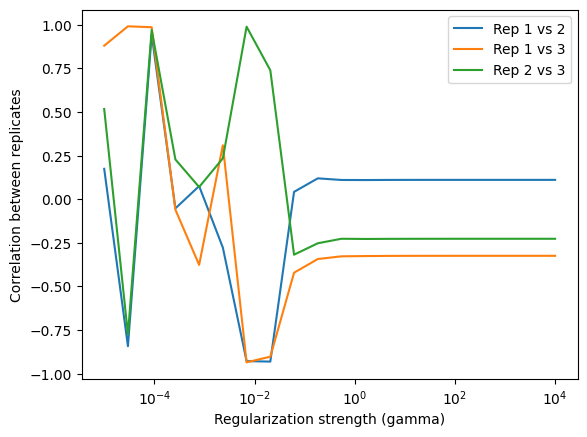

Found best regularization strength gamma = 8.9e-05, R = 0.97
Wrote inference results for layer 0
Analyzing layer 1
corrs_list: [[np.float64(0.3999275952658646), np.float64(-0.20078952587709037), np.float64(-0.20503282699467645)], [np.float64(0.40751971099035167), np.float64(-0.20355540049357865), np.float64(-0.20477534590178476)], [np.float64(0.4291248565089637), np.float64(-0.21150871412818376), np.float64(-0.20428407593793918)], [np.float64(0.4856203972170915), np.float64(-0.23312112274231755), np.float64(-0.204835726977204)], [np.float64(0.604208980435152), np.float64(-0.28631018034866734), np.float64(-0.21691291218951908)], [np.float64(0.7759918721992788), np.float64(-0.43010514272192246), np.float64(-0.27600767038747154)], [np.float64(0.7292638891445882), np.float64(-0.6546450435177502), np.float64(-0.9788488244879818)], [np.float64(0.8081216320565263), np.float64(-0.47393235835540026), np.float64(-0.49063297305738096)], [np.float64(-0.9589149950370665), np.float64(-0.903263893095

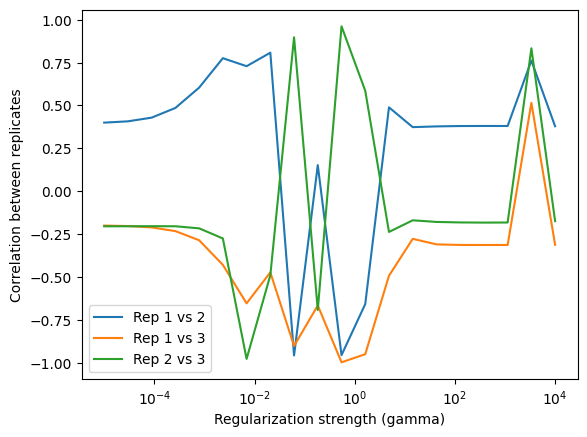

Found best regularization strength gamma = 3.4e+03, R = 0.70
Wrote inference results for layer 1
Analyzing layer 2
corrs_list: [[np.float64(0.9903149752380624), np.float64(0.13456741116036247), np.float64(0.16680388291730042)], [np.float64(0.9897596021352121), np.float64(0.12193387621203927), np.float64(0.15460828373200786)], [np.float64(0.9880221843590292), np.float64(0.08637400386167837), np.float64(0.1200868305584537)], [np.float64(0.9821367208135929), np.float64(-0.00579638773389687), np.float64(0.02839822891668672)], [np.float64(0.9592575215562028), np.float64(-0.21851677387493926), np.float64(-0.2158016285060858)], [np.float64(0.9010882064138059), np.float64(-0.5993873671413038), np.float64(-0.762405260030557)], [np.float64(0.6992122983693346), np.float64(-0.7481539615786469), np.float64(-0.4863071979516698)], [np.float64(0.7347524053544943), np.float64(-0.7005690543118873), np.float64(-0.8532058631497701)], [np.float64(-0.6675753346660814), np.float64(-0.8873583800794402), np.fl

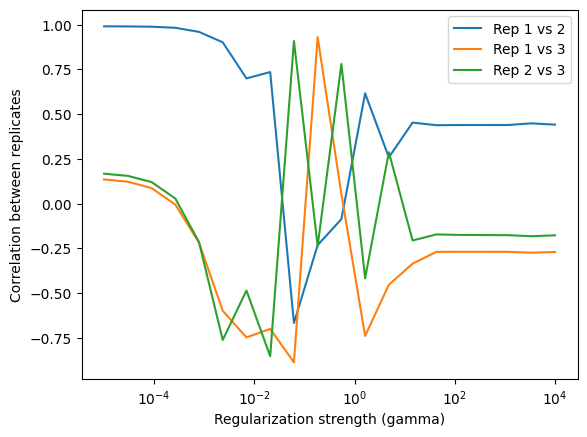

Found best regularization strength gamma = 1.0e-05, R = 0.43
Wrote inference results for layer 2
Analyzing layer 3
corrs_list: [[np.float64(0.7988285924396782), np.float64(-0.5616983079600235), np.float64(-0.20725487485643646)], [np.float64(0.7941456852455059), np.float64(-0.5583452858632034), np.float64(-0.1974786318677562)], [np.float64(0.7801708917423448), np.float64(-0.5489066894248961), np.float64(-0.16899760429211452)], [np.float64(0.7386594210752897), np.float64(-0.5249882579385325), np.float64(-0.08918090852874935)], [np.float64(0.6245487447110954), np.float64(-0.47726059065535587), np.float64(0.11661619443456361)], [np.float64(0.4831609349947121), np.float64(-0.3337717253296264), np.float64(0.6149224271514324)], [np.float64(0.5044121387142753), np.float64(-0.5108235144540887), np.float64(0.05861551138475002)], [np.float64(0.7144312498150549), np.float64(-0.6875718491194535), np.float64(-0.8736442371266052)], [np.float64(0.7500005129500806), np.float64(0.18643778739490602), np.

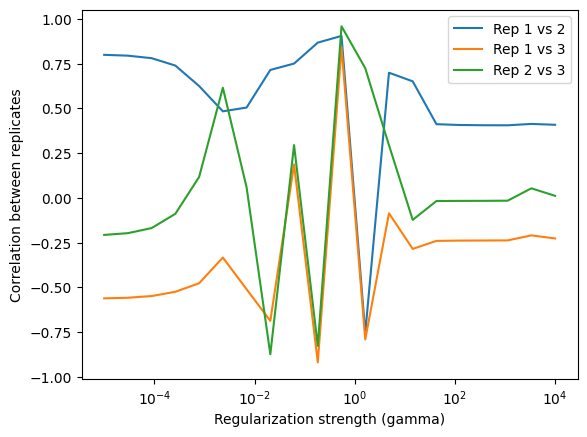

Found best regularization strength gamma = 5.5e-01, R = 0.90
Wrote inference results for layer 3
Analyzing layer 4
corrs_list: [[np.float64(0.8750615866957596), np.float64(0.8001730930783548), np.float64(0.9018856287730932)], [np.float64(0.868228716857796), np.float64(0.7871469327482429), np.float64(0.8943450435462348)], [np.float64(0.847937480453261), np.float64(0.7474447945443226), np.float64(0.8707285061132537)], [np.float64(0.7884551792668857), np.float64(0.6245333794329844), np.float64(0.7931795311829604)], [np.float64(0.61213023447259), np.float64(0.2883000654644966), np.float64(0.5999439204682689)], [np.float64(-0.21209193676517282), np.float64(0.19468604980126886), np.float64(0.10242086773714838)], [np.float64(0.9417367591830786), np.float64(-0.13951273516437057), np.float64(-0.1447435148849314)], [np.float64(0.6605262975919867), np.float64(-0.7314157106445338), np.float64(-0.008431170294017576)], [np.float64(0.5543004504999635), np.float64(-0.24086243774404117), np.float64(0.1

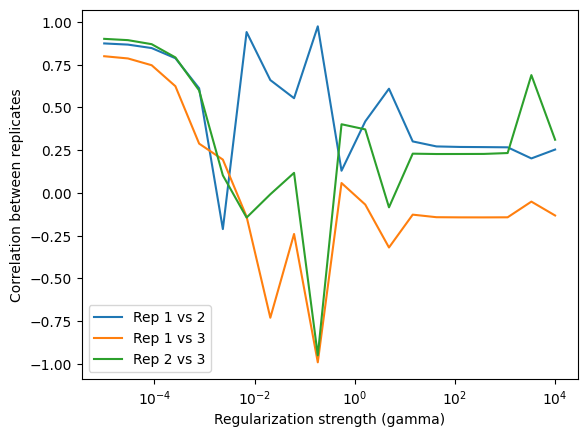

Found best regularization strength gamma = 1.0e-05, R = 0.86
Wrote inference results for layer 4
Analyzing layer 5
corrs_list: [[np.float64(-0.754069730510659), np.float64(0.7358003078725799), np.float64(-0.2888182781473876)], [np.float64(-0.7662699585729017), np.float64(0.7484108774665765), np.float64(-0.31765530569638617)], [np.float64(-0.8035053849666994), np.float64(0.7874093455741862), np.float64(-0.40988887206036556)], [np.float64(-0.91302048542729), np.float64(0.9103363507882829), np.float64(-0.7252201777041292)], [np.float64(-0.8896164601550504), np.float64(0.8344998415199731), np.float64(-0.5628519458201178)], [np.float64(0.6306240621535223), np.float64(0.827293203341912), np.float64(0.8726341897106478)], [np.float64(-0.9854137920901717), np.float64(0.9279892547121011), np.float64(-0.8741284341536992)], [np.float64(0.9970610680862133), np.float64(0.9560856972972587), np.float64(0.942917675801227)], [np.float64(0.9974929707185815), np.float64(0.925371899831076), np.float64(0.93

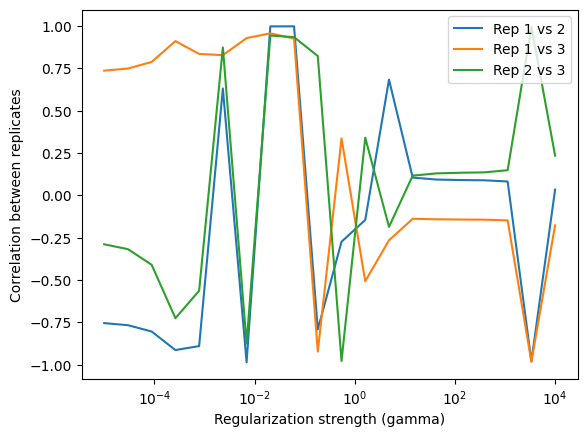

Found best regularization strength gamma = 2.1e-02, R = 0.97
Wrote inference results for layer 5
Analyzing layer 6
corrs_list: [[np.float64(0.7300087958426548), np.float64(0.689898287575517), np.float64(0.1959329529932985)], [np.float64(0.6693736537534825), np.float64(0.5979610962713676), np.float64(0.017772631023513785)], [np.float64(0.5379020435759888), np.float64(0.36678610268727013), np.float64(-0.35011252658506)], [np.float64(0.40962476129542635), np.float64(-0.048189186759846236), np.float64(-0.7700302568298926)], [np.float64(0.846803565108244), np.float64(-0.8442029743742591), np.float64(-0.9947538787135958)], [np.float64(0.7585721450588191), np.float64(-0.9958802053048202), np.float64(-0.7938214066452942)], [np.float64(-0.37188370433660056), np.float64(-0.5008628217456351), np.float64(0.4605553448349831)], [np.float64(0.06716747039468034), np.float64(0.21248281509389574), np.float64(0.559617313744112)], [np.float64(0.9792492313899415), np.float64(0.9776054876950054), np.float64

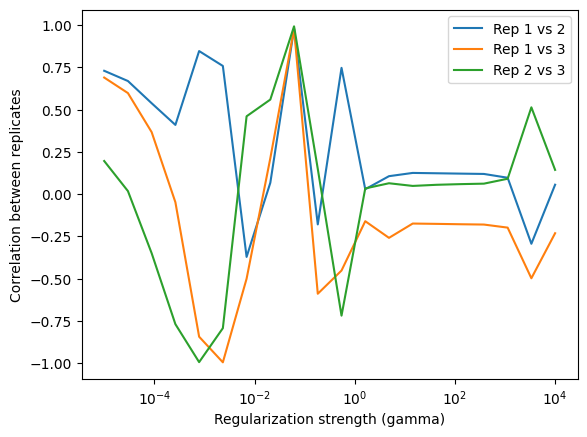

Found best regularization strength gamma = 6.2e-02, R = 0.98
Wrote inference results for layer 6
Analyzing layer 7
corrs_list: [[np.float64(0.48201213807972404), np.float64(-0.8186855687975397), np.float64(-0.4593968111234049)], [np.float64(0.48129463798803707), np.float64(-0.8213632002828852), np.float64(-0.46601191331782443)], [np.float64(0.4795069554583906), np.float64(-0.828981328860113), np.float64(-0.4853060553638646)], [np.float64(0.4772167053379329), np.float64(-0.8489727197534593), np.float64(-0.5394935446385902)], [np.float64(0.49794743177827744), np.float64(-0.8930298114419983), np.float64(-0.6766940685622275)], [np.float64(-0.5933503667594794), np.float64(-0.6937865501947634), np.float64(-0.16353757954478182)], [np.float64(-0.23718133812000186), np.float64(0.35086127568094505), np.float64(-0.6294753565417881)], [np.float64(-0.27768135661170523), np.float64(0.1627926527731609), np.float64(0.5409402947806071)], [np.float64(0.4696310814831786), np.float64(-0.6109936245865855),

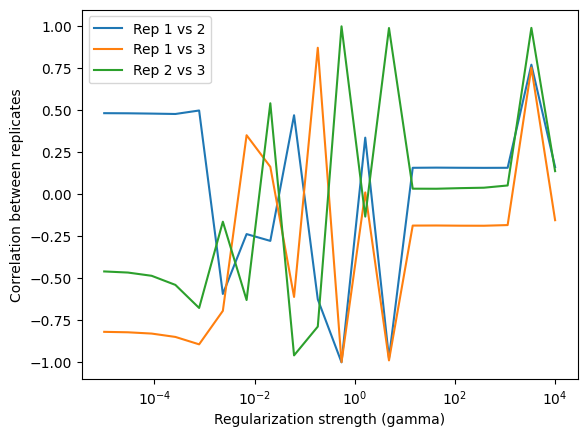

Found best regularization strength gamma = 3.4e+03, R = 0.84
Wrote inference results for layer 7
Analyzing layer 8
corrs_list: [[np.float64(-0.179744802529072), np.float64(-0.2362796852724955), np.float64(-0.3471888930700861)], [np.float64(-0.1827385478762017), np.float64(-0.2425607882918247), np.float64(-0.34164951326893944)], [np.float64(-0.19198091753776678), np.float64(-0.2613472389389089), np.float64(-0.3254565331007653)], [np.float64(-0.2225848404896029), np.float64(-0.31789426896293504), np.float64(-0.2787369537365395)], [np.float64(-0.34623605502289156), np.float64(-0.4890600483743504), np.float64(-0.1294346660702144)], [np.float64(-0.990913615163729), np.float64(-0.9505150944302987), np.float64(0.9132095766828626)], [np.float64(-0.23472171424886495), np.float64(-0.22883099161455936), np.float64(4.908115988236372e-05)], [np.float64(0.9161859433371211), np.float64(-0.8129415687431759), np.float64(-0.8870108417926241)], [np.float64(0.7496357989158279), np.float64(0.77250419039931

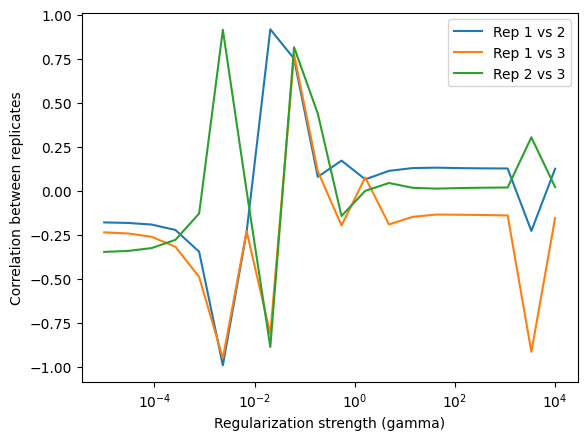

Found best regularization strength gamma = 6.2e-02, R = 0.78
Wrote inference results for layer 8
Analyzing layer 9
corrs_list: [[np.float64(0.9880928071160833), np.float64(0.9932464862776491), np.float64(0.9988721260620601)], [np.float64(0.9722893950363319), np.float64(0.9880928698946558), np.float64(0.995124691745611)], [np.float64(0.8968954621436638), np.float64(0.9667913844486193), np.float64(0.9712559845864669)], [np.float64(0.5995885486820451), np.float64(0.8821145552679618), np.float64(0.8524418234803757)], [np.float64(0.16063265915655509), np.float64(0.7184030671039765), np.float64(0.5808268020246508)], [np.float64(0.3542869568553903), np.float64(0.92758039861215), np.float64(0.4686134898669846)], [np.float64(-0.9640794373951486), np.float64(-0.5586153971650948), np.float64(0.6644760859868254)], [np.float64(0.9975567744272227), np.float64(-0.9817824652632222), np.float64(-0.968682527827438)], [np.float64(-0.9822739977987613), np.float64(0.9908989378135455), np.float64(-0.9918418

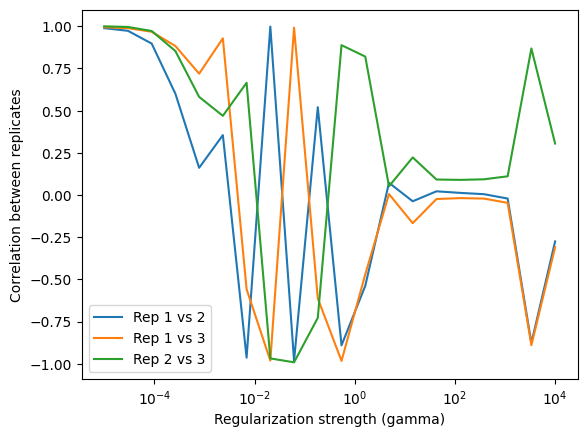

Found best regularization strength gamma = 1.0e-05, R = 0.99
Wrote inference results for layer 9
Analyzing layer 10
corrs_list: [[np.float64(-0.41402300789285895), np.float64(0.9368204316260156), np.float64(-0.4652618704621443)], [np.float64(-0.354539288848785), np.float64(0.9312894788215534), np.float64(-0.41032354227089124)], [np.float64(-0.18157881448301366), np.float64(0.9164927479075577), np.float64(-0.24700963068163412)], [np.float64(0.24735363573902636), np.float64(0.8921315905674234), np.float64(0.1842145338678346)], [np.float64(0.8209686470089184), np.float64(0.9326336074700322), np.float64(0.8126875514026157)], [np.float64(0.9203396142951735), np.float64(0.9456634787511653), np.float64(0.9139572738815087)], [np.float64(0.18665999987582993), np.float64(0.4043452387259333), np.float64(0.13210355693610742)], [np.float64(-0.9287479028707311), np.float64(0.9248060302996733), np.float64(-0.8811973444895006)], [np.float64(0.8869438438050443), np.float64(0.845556540422652), np.float6

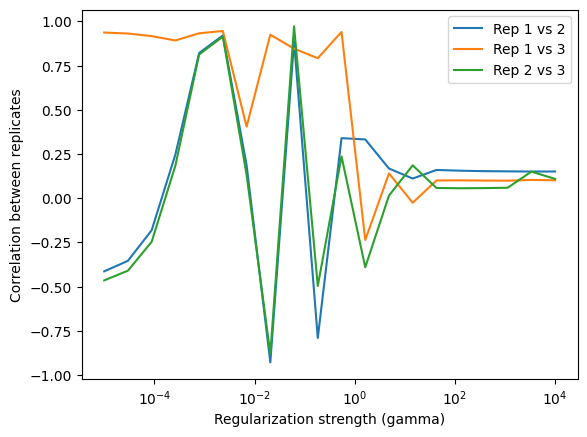

Found best regularization strength gamma = 7.8e-04, R = 0.86
Wrote inference results for layer 10
Analyzing layer 11
corrs_list: [[np.float64(0.1865011166243118), np.float64(-0.18714496841339848), np.float64(0.8741874386230489)], [np.float64(0.19094820286662093), np.float64(-0.18834265149119145), np.float64(0.8697558819733046)], [np.float64(0.20462898208363361), np.float64(-0.19084222726408812), np.float64(0.8565292121149566)], [np.float64(0.24804139940642722), np.float64(-0.19068408433201967), np.float64(0.8172953415629504)], [np.float64(0.37936119162500864), np.float64(-0.1526129624598883), np.float64(0.7113686678483564)], [np.float64(0.6083197806188188), np.float64(-0.0802934031781849), np.float64(0.531472648496712)], [np.float64(0.9575469018394259), np.float64(0.837903721702911), np.float64(0.9220396712564675)], [np.float64(-0.8929491460563974), np.float64(-0.95527768771351), np.float64(0.9650839356106972)], [np.float64(0.12072214444144773), np.float64(0.49250237786649104), np.floa

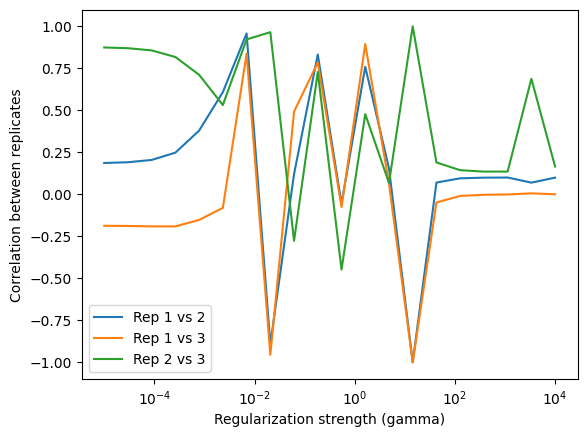

Found best regularization strength gamma = 7.0e-03, R = 0.91
Wrote inference results for layer 11
Analyzing layer 12
corrs_list: [[np.float64(-0.9673710521380167), np.float64(-0.9984074340854043), np.float64(0.9590652013525004)], [np.float64(-0.9472754516553078), np.float64(-0.9965453888242475), np.float64(0.9328245303815191)], [np.float64(-0.872466717664418), np.float64(-0.9868036784400556), np.float64(0.8324915805746127)], [np.float64(-0.6587787155999145), np.float64(-0.9248314309117727), np.float64(0.5088890051925784)], [np.float64(-0.49208635424511643), np.float64(-0.5532361945619235), np.float64(-0.04917888073801621)], [np.float64(-0.9641184221464676), np.float64(0.831140074517974), np.float64(-0.8209273471795936)], [np.float64(0.3893111171882284), np.float64(0.251358811005278), np.float64(-0.5318019653327898)], [np.float64(0.813957037179673), np.float64(0.5562589567889855), np.float64(0.46725159262897326)], [np.float64(0.439196163052489), np.float64(-0.40604972216818963), np.floa

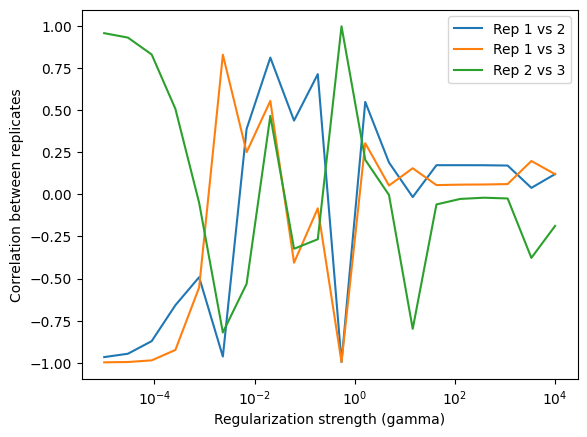

Found best regularization strength gamma = 2.1e-02, R = 0.61
Wrote inference results for layer 12
Analyzing layer 13
corrs_list: [[np.float64(0.5264724181390539), np.float64(-0.21292005832586325), np.float64(-0.2070956706190611)], [np.float64(0.5241458907296914), np.float64(-0.21265131329199588), np.float64(-0.20798199248302313)], [np.float64(0.5174916400856657), np.float64(-0.21203499773008658), np.float64(-0.21088689748663625)], [np.float64(0.5000070549448727), np.float64(-0.21186794398126485), np.float64(-0.22198927049206746)], [np.float64(0.46816984964283065), np.float64(-0.2305576604553305), np.float64(-0.2833618637216841)], [np.float64(0.5454460383619304), np.float64(-0.4346990134808314), np.float64(-0.6384294317321452)], [np.float64(0.8251372994432772), np.float64(-0.7494058960672404), np.float64(-0.7212956600541521)], [np.float64(-0.5199259512185892), np.float64(0.30407138662027466), np.float64(-0.5318855786474026)], [np.float64(0.25727888013096645), np.float64(-0.3753676484868

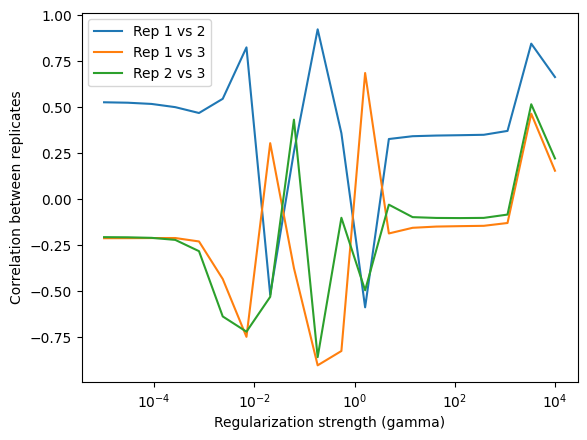

Found best regularization strength gamma = 3.4e+03, R = 0.61
Wrote inference results for layer 13
Analyzing layer 14
corrs_list: [[np.float64(0.9870430800136512), np.float64(-0.9780800164884453), np.float64(-0.9635699780780086)], [np.float64(0.9863244580268933), np.float64(-0.9764911940791551), np.float64(-0.9607473837280719)], [np.float64(0.984209545995553), np.float64(-0.9714217931368655), np.float64(-0.9517354786002197)], [np.float64(0.9796664280024698), np.float64(-0.9547099911328847), np.float64(-0.9231422171886341)], [np.float64(0.998404702217965), np.float64(-0.9902635214441525), np.float64(-0.9856547151142001)], [np.float64(0.9041796269160022), np.float64(-0.6632841755015835), np.float64(-0.7975475710080762)], [np.float64(0.8573850441587851), np.float64(0.28947126290051894), np.float64(0.14377146489239567)], [np.float64(0.7073342412499684), np.float64(-0.10071711086152174), np.float64(0.021135562139761754)], [np.float64(0.4590843168433456), np.float64(-0.5734195266223162), np.f

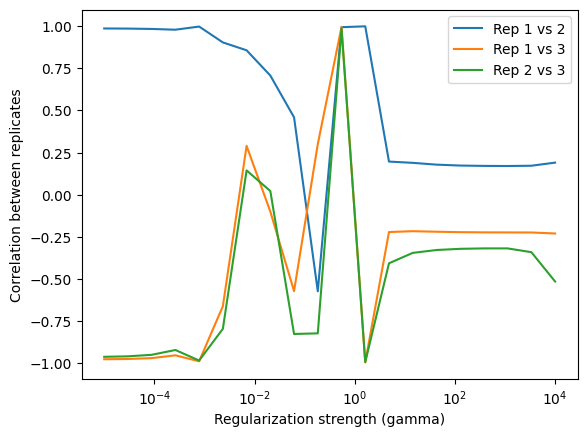

Found best regularization strength gamma = 5.5e-01, R = 0.99
Wrote inference results for layer 14
Analyzing layer 15
corrs_list: [[np.float64(-0.9851769676159271), np.float64(-0.992385400849999), np.float64(0.9909198450644605)], [np.float64(-0.9838450393006916), np.float64(-0.9917289357405867), np.float64(0.9900919568042057)], [np.float64(-0.9795596429359555), np.float64(-0.9896287000147189), np.float64(0.9874185040394622)], [np.float64(-0.9640726329022603), np.float64(-0.9821576120755112), np.float64(0.9776417623017747)], [np.float64(-0.8973736903468575), np.float64(-0.9514228114527132), np.float64(0.9336604735700866)], [np.float64(-0.6198073015308602), np.float64(-0.8452180733361381), np.float64(0.7178094641867483)], [np.float64(-0.28613542621037125), np.float64(-0.9242229145196376), np.float64(0.3198385837130784)], [np.float64(0.9645233819179118), np.float64(-0.6998034037326675), np.float64(-0.5443467367008337)], [np.float64(-0.5030092212163622), np.float64(0.8212614405575149), np.f

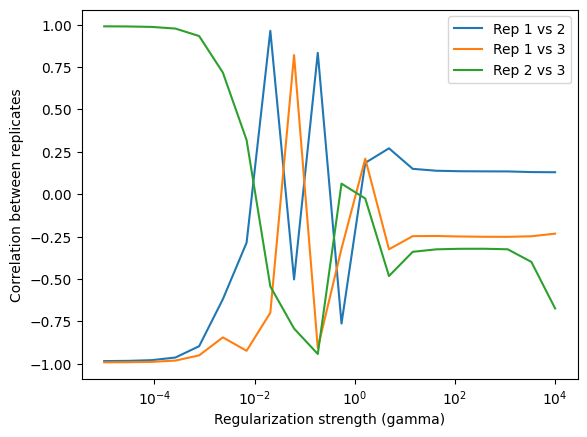

Found best regularization strength gamma = 1.6e+00, R = 0.12
Wrote inference results for layer 15
Analyzing layer 16
corrs_list: [[np.float64(0.3825962595705819), np.float64(-0.21649610553859655), np.float64(-0.35003151412053124)], [np.float64(0.38284131387084597), np.float64(-0.21629460877275897), np.float64(-0.342999725618133)], [np.float64(0.38362492686956556), np.float64(-0.21558016578159866), np.float64(-0.3218091152087317)], [np.float64(0.3865238659889063), np.float64(-0.21225467199739906), np.float64(-0.25633084098922093)], [np.float64(0.40324068378126976), np.float64(-0.18561633414406797), np.float64(-0.037600699344628286)], [np.float64(0.7592097560203008), np.float64(0.5046273698085781), np.float64(0.829533372761539)], [np.float64(0.4270304734068122), np.float64(-0.7722649664728711), np.float64(-0.09059941261193011)], [np.float64(0.9322269667879844), np.float64(-0.508268665103203), np.float64(-0.47169367710055193)], [np.float64(0.8417416749314306), np.float64(-0.74133312647766

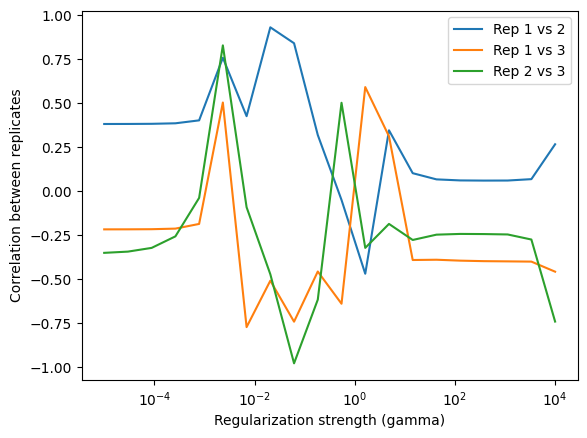

Found best regularization strength gamma = 2.3e-03, R = 0.70
Wrote inference results for layer 16
Analyzing layer 17
corrs_list: [[np.float64(-0.34974613025235485), np.float64(0.2551926973412195), np.float64(-0.6700453822054442)], [np.float64(-0.3470336366774521), np.float64(0.25274513383985875), np.float64(-0.6669438471863147)], [np.float64(-0.3390147341526723), np.float64(0.24558635673117946), np.float64(-0.6577046243031827)], [np.float64(-0.31558509909882154), np.float64(0.22534276883266635), np.float64(-0.63015332630096)], [np.float64(-0.24877732080288434), np.float64(0.17338031752814476), np.float64(-0.5480745107677427)], [np.float64(-0.06261172572099696), np.float64(0.07629538758612892), np.float64(-0.3077125345574058)], [np.float64(0.31095325786496986), np.float64(0.7390178856171832), np.float64(0.46451788484697454)], [np.float64(0.9738099840909524), np.float64(-0.8477049199380936), np.float64(-0.882867854943305)], [np.float64(-0.7813227520875121), np.float64(-0.346448251792216)

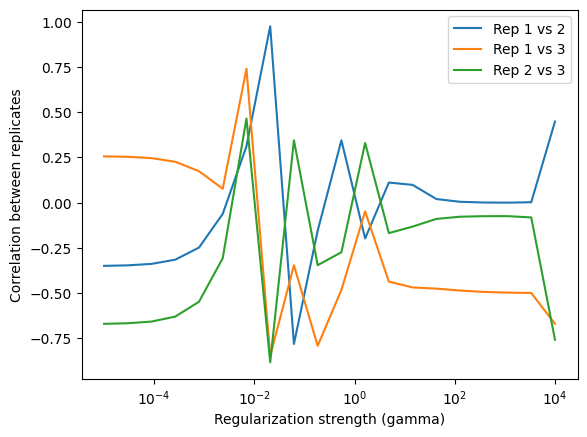

Found best regularization strength gamma = 7.0e-03, R = 0.50
Wrote inference results for layer 17
Analyzing layer 18
corrs_list: [[np.float64(-0.065909472689081), np.float64(-0.15767680147128443), np.float64(0.5593316421933218)], [np.float64(-0.06495245922063936), np.float64(-0.15753589331984272), np.float64(0.5613997038169237)], [np.float64(-0.062101352402355786), np.float64(-0.15708976781706518), np.float64(0.5675443279691075)], [np.float64(-0.053589815803530894), np.float64(-0.15551911853776), np.float64(0.5857356957678992)], [np.float64(-0.027972813818715914), np.float64(-0.14852029253177718), np.float64(0.6389385077639342)], [np.float64(0.05363938677963627), np.float64(-0.10076309832544689), np.float64(0.7863230185882373)], [np.float64(0.3950409210271246), np.float64(0.33245497381307076), np.float64(0.9897834912937007)], [np.float64(-0.23404640490442663), np.float64(-0.9230919730560113), np.float64(0.4408623764247613)], [np.float64(0.987778045003769), np.float64(-0.939016444375938

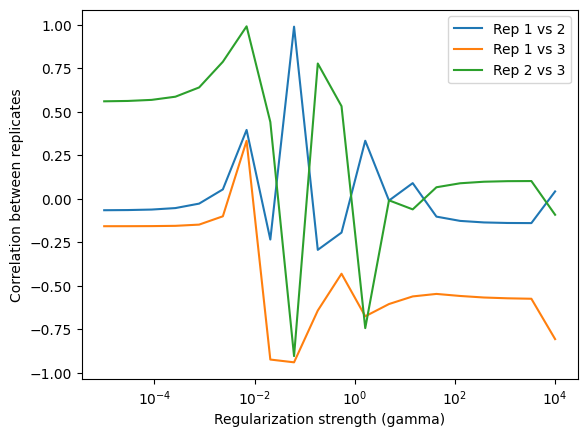

Found best regularization strength gamma = 7.0e-03, R = 0.57
Wrote inference results for layer 18
Analyzing layer 19
corrs_list: [[np.float64(-0.5638158831859383), np.float64(-0.13370239781651067), np.float64(0.7797896556190076)], [np.float64(-0.6008967156466396), np.float64(-0.18068830267539604), np.float64(0.7841430434476304)], [np.float64(-0.7029523657077495), np.float64(-0.33481315835438624), np.float64(0.8086917189289093)], [np.float64(-0.9192174610733888), np.float64(-0.8945924207574932), np.float64(0.9736878417211503)], [np.float64(-0.8939992114092957), np.float64(-0.3251542666366531), np.float64(0.602771220553893)], [np.float64(-0.2455537488723552), np.float64(0.02582703925630625), np.float64(0.49969037045835263)], [np.float64(-0.03594082688253425), np.float64(-0.3750796652895789), np.float64(0.4040111928272354)], [np.float64(-0.30321631727135817), np.float64(-0.41760682798238147), np.float64(0.7544470358682585)], [np.float64(0.10276983182984092), np.float64(-0.9262010898563688

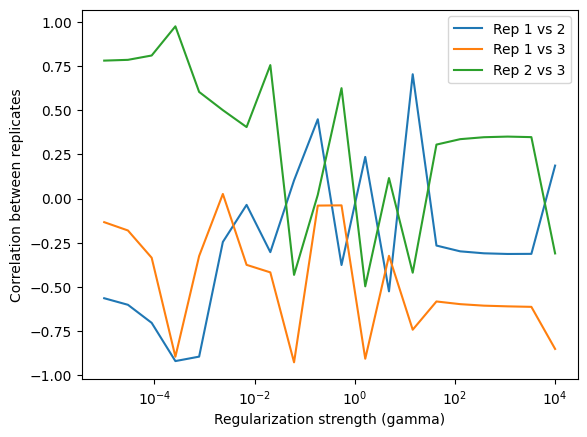

Found best regularization strength gamma = 1.8e-01, R = 0.14
Wrote inference results for layer 19
Analyzing layer 20
corrs_list: [[np.float64(-0.977777735135307), np.float64(-0.9831745017832516), np.float64(0.9612618927706408)], [np.float64(-0.9765337537269886), np.float64(-0.9823453388930602), np.float64(0.9591782438355624)], [np.float64(-0.9726701223089131), np.float64(-0.9798025271098796), np.float64(0.9527494781042254)], [np.float64(-0.9598759710884999), np.float64(-0.9716721252548889), np.float64(0.9318758457109291)], [np.float64(-0.9136324625631125), np.float64(-0.9446496626892552), np.float64(0.8605972270799934)], [np.float64(-0.7597813035431786), np.float64(-0.8654455048785817), np.float64(0.6557236744334525)], [np.float64(-0.42393056181958827), np.float64(-0.6676864738766913), np.float64(0.3199100249254594)], [np.float64(-0.1694140995252305), np.float64(0.30414194134328926), np.float64(-0.5580627025510126)], [np.float64(0.9859039265842662), np.float64(0.9869364484337216), np.f

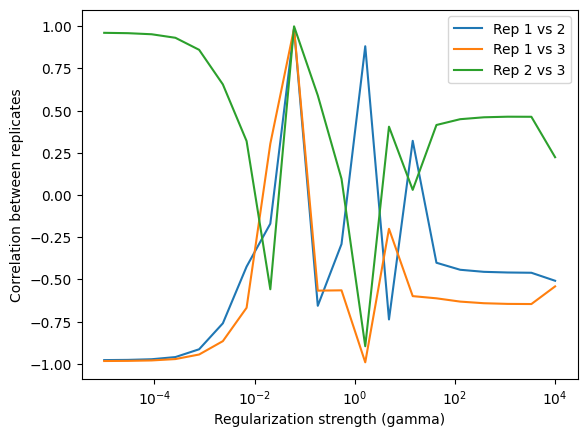

Found best regularization strength gamma = 6.2e-02, R = 0.99
Wrote inference results for layer 20
Analyzing layer 21
corrs_list: [[np.float64(-0.8268564982941156), np.float64(-0.9763301612688435), np.float64(0.8765804121976404)], [np.float64(-0.8245606450588953), np.float64(-0.97592264772661), np.float64(0.8749177761265239)], [np.float64(-0.8177318959494736), np.float64(-0.9746937972093314), np.float64(0.8699708968675105)], [np.float64(-0.7975076699165289), np.float64(-0.970901403532195), np.float64(0.8553097691947794)], [np.float64(-0.7396095665965954), np.float64(-0.9586093371837096), np.float64(0.8133454974557184)], [np.float64(-0.6126822919811591), np.float64(-0.9200967227077596), np.float64(0.723675066431479)], [np.float64(-0.8455755525631927), np.float64(-0.9719834533598283), np.float64(0.886233534482643)], [np.float64(0.6665908589124766), np.float64(-0.7096229458941423), np.float64(-0.33538280219441197)], [np.float64(-0.5117647457440213), np.float64(-0.58167468520876), np.float6

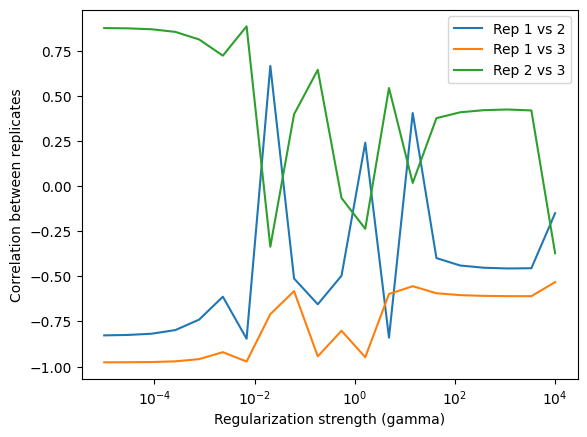

Found best regularization strength gamma = 1.4e+01, R = -0.04
Wrote inference results for layer 21
Analyzing layer 22
corrs_list: [[np.float64(-0.9699874659888436), np.float64(-0.9757081977143435), np.float64(0.9892143393348709)], [np.float64(-0.9680100949033954), np.float64(-0.9742451716194221), np.float64(0.9882441773018821)], [np.float64(-0.9617671209993154), np.float64(-0.9696693117796679), np.float64(0.9851087758418908)], [np.float64(-0.9401013322430017), np.float64(-0.9543058541447573), np.float64(0.9736512795295382)], [np.float64(-0.850075184506862), np.float64(-0.8984721783956569), np.float64(0.9232557996934244)], [np.float64(-0.10548788756173297), np.float64(-0.6014471489424424), np.float64(0.6969197808275096)], [np.float64(0.24680309429034453), np.float64(-0.95097927197041), np.float64(-0.5047436975041755)], [np.float64(-0.8189124072423308), np.float64(-0.9351272279998339), np.float64(0.9204641017413596)], [np.float64(-0.05231704964046945), np.float64(-0.2782423821246622), np

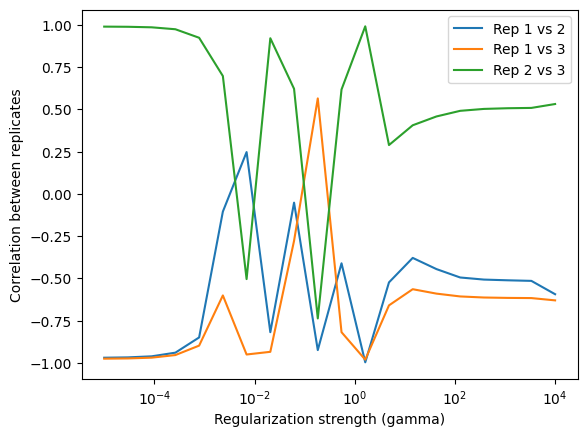

Found best regularization strength gamma = 6.2e-02, R = 0.10
Wrote inference results for layer 22
Analyzing layer 23
corrs_list: [[np.float64(-0.4684060532185142), np.float64(-0.6379738508783978), np.float64(0.40747511830560595)], [np.float64(-0.4682371502498914), np.float64(-0.6377583800168584), np.float64(0.4075690511464616)], [np.float64(-0.46773068371250937), np.float64(-0.637118039973934), np.float64(0.40784363846333477)], [np.float64(-0.4661903597770071), np.float64(-0.6352207218965992), np.float64(0.4086172598001582)], [np.float64(-0.4613221653934416), np.float64(-0.629646924280715), np.float64(0.41054658568916347)], [np.float64(-0.4444523930985508), np.float64(-0.6136390262776718), np.float64(0.41325017320465063)], [np.float64(-0.37169182391421185), np.float64(-0.5692955996182434), np.float64(0.39641629575145787)], [np.float64(0.9178300948405295), np.float64(-0.7010322737072301), np.float64(-0.5991745611073271)], [np.float64(0.0004909377067841003), np.float64(0.0069509157706257

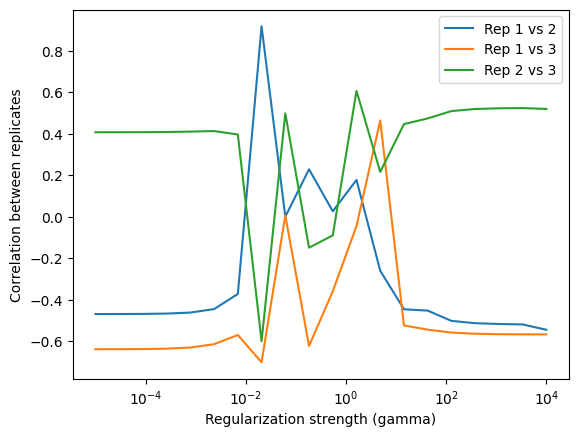

Found best regularization strength gamma = 1.0e-05, R = -0.23
Wrote inference results for layer 23
Analyzing layer 24
corrs_list: [[np.float64(-0.13058808570821884), np.float64(-0.3007467912071471), np.float64(0.11972444187495915)], [np.float64(-0.1303012567588635), np.float64(-0.30097434439500625), np.float64(0.11925049277692165)], [np.float64(-0.12944206044872386), np.float64(-0.3016496255994174), np.float64(0.11783718370017868)], [np.float64(-0.12683598546370126), np.float64(-0.3036420479027996), np.float64(0.11360655430270505)], [np.float64(-0.11864280616422834), np.float64(-0.3094238860617994), np.float64(0.10078839632147121)], [np.float64(-0.09025098698374458), np.float64(-0.325484590410365), np.float64(0.060284919213699314)], [np.float64(0.035784031707178456), np.float64(-0.36789907895825685), np.float64(-0.09227989619611962)], [np.float64(0.8181593896840152), np.float64(-0.30663952952423956), np.float64(-0.7099253939853162)], [np.float64(-0.8004165303498824), np.float64(-0.6547

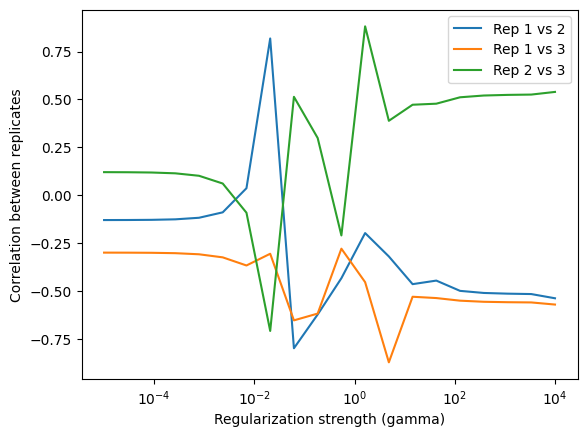

Found best regularization strength gamma = 1.0e-05, R = -0.10
Wrote inference results for layer 24
Analyzing layer 25
corrs_list: [[np.float64(-0.9135272588788077), np.float64(-0.8867712801509847), np.float64(0.9165759032107679)], [np.float64(-0.9142756320180035), np.float64(-0.8875962097632087), np.float64(0.917377699745233)], [np.float64(-0.9164914952080714), np.float64(-0.8900476068813103), np.float64(0.919745518114)], [np.float64(-0.9229826704708187), np.float64(-0.8973077916329664), np.float64(0.9266266274624096)], [np.float64(-0.9413281859410616), np.float64(-0.91854165667606), np.float64(0.9455901696321527)], [np.float64(-0.9848934360415433), np.float64(-0.9754188005069891), np.float64(0.9870834440023103)], [np.float64(-0.9472920777699145), np.float64(-0.553496337629706), np.float64(0.7270006924946824)], [np.float64(-0.14549980429949097), np.float64(0.024746533502317036), np.float64(0.9048281891482871)], [np.float64(0.6398492988616903), np.float64(-0.908096394010836), np.float64

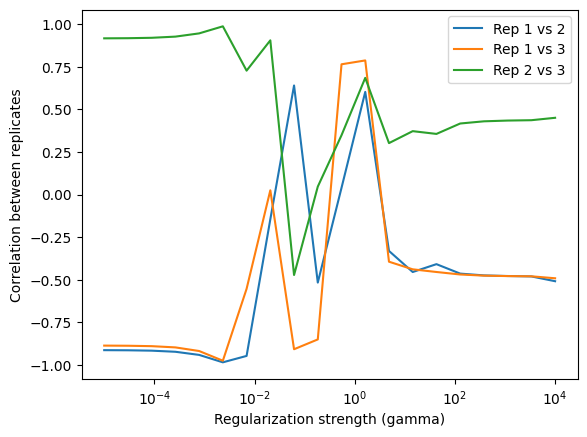

Found best regularization strength gamma = 1.6e+00, R = 0.69
Wrote inference results for layer 25
Analyzing layer 26
corrs_list: [[np.float64(-0.5184247846006622), np.float64(-0.18220728822970186), np.float64(0.08393791470778392)], [np.float64(-0.5181907065107715), np.float64(-0.18309981986343393), np.float64(0.08492173827498554)], [np.float64(-0.5174941878416845), np.float64(-0.18575592703538363), np.float64(0.08783357907121547)], [np.float64(-0.5154221580567608), np.float64(-0.19365536222563587), np.float64(0.09635676456607636)], [np.float64(-0.5092518435733155), np.float64(-0.2170502198519934), np.float64(0.12049271613926259)], [np.float64(-0.4905981161099142), np.float64(-0.2844995057433156), np.float64(0.18238108155890825)], [np.float64(-0.42472990024859264), np.float64(-0.4563899302199857), np.float64(0.295865803496566)], [np.float64(0.227807626864334), np.float64(-0.7723343521898771), np.float64(0.11793156234118768)], [np.float64(-0.43802711360950797), np.float64(0.0466998170727

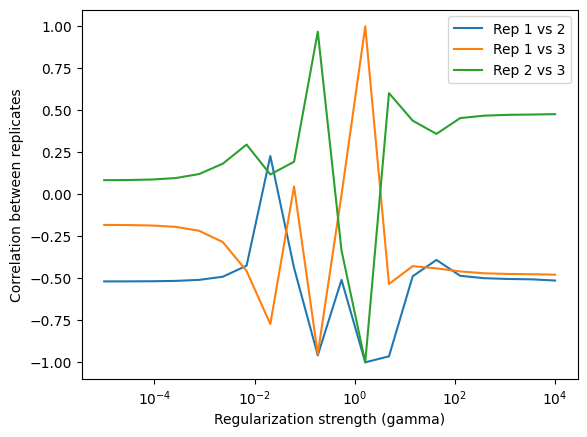

Found best regularization strength gamma = 6.2e-02, R = -0.07
Wrote inference results for layer 26
Analyzing layer 27
corrs_list: [[np.float64(-0.8212382021442793), np.float64(-0.8102636917339674), np.float64(0.7957391793423286)], [np.float64(-0.8221438478025683), np.float64(-0.8110122026929195), np.float64(0.7964331482788989)], [np.float64(-0.8248749736747135), np.float64(-0.8132997775936875), np.float64(0.798553842516741)], [np.float64(-0.8332793278578031), np.float64(-0.8205841320669454), np.float64(0.805317599744214)], [np.float64(-0.859840867788378), np.float64(-0.8452684436775161), np.float64(0.8286079875313913)], [np.float64(-0.936811744657532), np.float64(-0.9245394072961975), np.float64(0.9099956116730583)], [np.float64(-0.9655917389055855), np.float64(-0.9261176736661993), np.float64(0.9118758473065294)], [np.float64(-0.028440199495442256), np.float64(0.14051109015909674), np.float64(0.015049271047650803)], [np.float64(-0.863062676941341), np.float64(-0.8056069916070884), np.

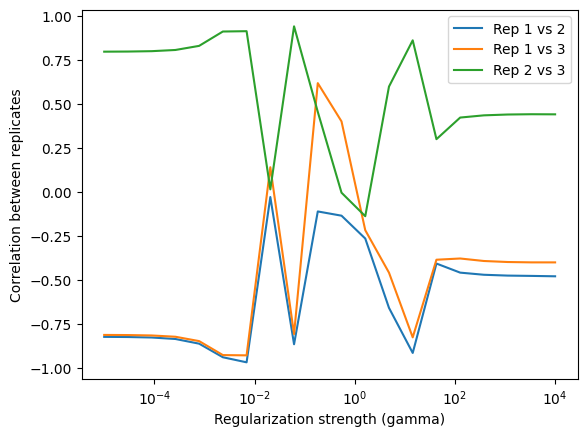

Found best regularization strength gamma = 1.8e-01, R = 0.32
Wrote inference results for layer 27
Analyzing layer 28
corrs_list: [[np.float64(0.22088100457365545), np.float64(0.028323376459840073), np.float64(0.23316023984272533)], [np.float64(0.21938901971592872), np.float64(0.026319645512783277), np.float64(0.23086889008793435)], [np.float64(0.21503684581232652), np.float64(0.02050745536027404), np.float64(0.2243134889754555)], [np.float64(0.20279511169688508), np.float64(0.004429590803853073), np.float64(0.20692605751105156)], [np.float64(0.1713033725540141), np.float64(-0.035007420403001005), np.float64(0.16958826625893728)], [np.float64(0.10440664144883238), np.float64(-0.11020466164075365), np.float64(0.12565349025690736)], [np.float64(0.023259412992672868), np.float64(-0.2028570013626495), np.float64(0.1483644158472025)], [np.float64(0.41055383040932947), np.float64(-0.1893033437556331), np.float64(0.21109929546626005)], [np.float64(-0.6396782783692794), np.float64(-0.4056004897

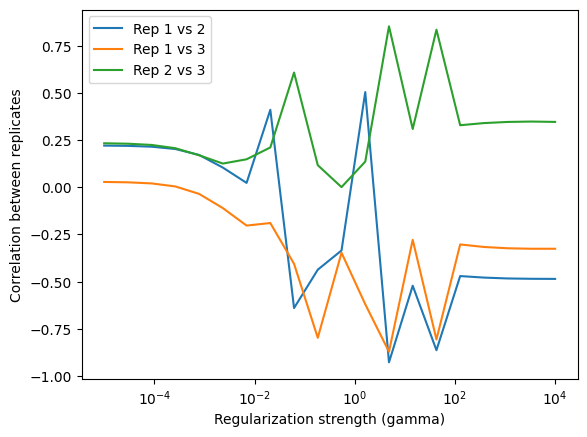

Found best regularization strength gamma = 1.0e-05, R = 0.16
Wrote inference results for layer 28
Analyzing layer 29
corrs_list: [[np.float64(-0.9532950815337385), np.float64(0.9392892621719525), np.float64(-0.9419547541831514)], [np.float64(-0.9482959785345366), np.float64(0.9333565649567782), np.float64(-0.9351544691597473)], [np.float64(-0.9332494394112248), np.float64(0.9144065290176719), np.float64(-0.9138512785066014)], [np.float64(-0.8925757887377019), np.float64(0.8493652567835058), np.float64(-0.8479162733119561)], [np.float64(-0.8503983539255731), np.float64(0.6531871038306714), np.float64(-0.7107713415895414)], [np.float64(-0.9555832666843482), np.float64(0.6397415640922434), np.float64(-0.7447891665891159)], [np.float64(-0.64867510863125), np.float64(-0.13863944526686453), np.float64(-0.5563171196471794)], [np.float64(0.07364142336665885), np.float64(-0.40008518579660135), np.float64(-0.4663123463307376)], [np.float64(-0.9997585553760774), np.float64(-0.9997393544045015), n

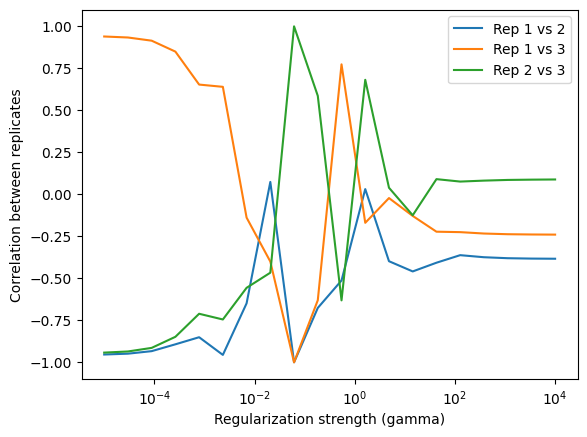

Found best regularization strength gamma = 1.6e+00, R = 0.18
Wrote inference results for layer 29
Analyzing layer 30
corrs_list: [[np.float64(0.1598739426681106), np.float64(-0.6593860090103276), np.float64(-0.12935630960814892)], [np.float64(0.16622201220525587), np.float64(-0.6481113624429005), np.float64(-0.15137124186554912)], [np.float64(0.1708783557038714), np.float64(-0.6192733050128022), np.float64(-0.19996225013302743)], [np.float64(0.10099162815119016), np.float64(-0.5912482051541016), np.float64(-0.2502656086974456)], [np.float64(0.3866536347007551), np.float64(-0.5145109626493777), np.float64(-0.4110238669822762)], [np.float64(0.9025991740362092), np.float64(0.6832233856672876), np.float64(0.8786470968426292)], [np.float64(-0.8967583988291062), np.float64(-0.7872864340699398), np.float64(0.856420780441289)], [np.float64(0.34080730286890015), np.float64(0.026036556792313148), np.float64(0.34678652430869195)], [np.float64(0.9802170391440804), np.float64(0.7080549655658895), n

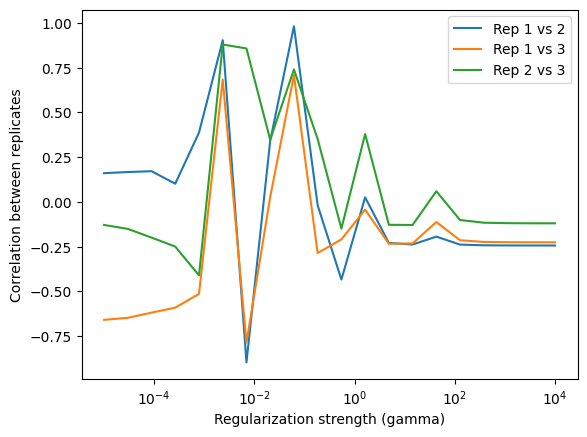

Found best regularization strength gamma = 2.3e-03, R = 0.82
Wrote inference results for layer 30


In [38]:
reload(popDMS)

layer_results = analyze_layers(whole_df, output_path=pwd + '/testing/allrandom/',
                    embed_path=pwd + '/test/embeds', dataname='TEST')

In [10]:
print(layer_results)

[[[array([-7.71289225e-07,  1.08589599e-07,  2.67317909e-07,  4.11146456e-08,
        6.85192779e-07,  1.55056973e-06,  4.31312876e-07, -2.88168288e-07,
       -4.06711342e-07, -5.22003413e-07, -4.22088030e-07, -3.73572179e-07,
        1.36159826e-06,  4.92906339e-07,  4.52079002e-08, -4.37682167e-07,
        1.14710034e-08, -1.03245361e-06, -1.11405577e-06, -5.38149793e-08,
        1.14485760e-07, -1.41208099e-07, -1.48972901e-06,  4.29335765e-07,
       -3.92027256e-07, -5.51369164e-07, -4.62464869e-07, -4.23858927e-07,
        6.26979742e-07, -1.61267382e-08, -8.92311441e-07,  8.01036229e-08,
       -1.36483723e-07,  7.01341884e-07, -5.67186514e-07, -1.73491383e-07,
       -2.71390873e-07,  7.04074905e-07, -1.05805386e-06, -1.06298557e-06,
        5.39651325e-07, -7.64419422e-07,  7.83889232e-07, -6.16140629e-07,
       -6.44323567e-07, -1.74385117e-09,  4.42802409e-07,  5.38803560e-07,
        1.28205073e-07, -8.26392949e-07,  5.04664189e-07,  1.26595455e-06,
       -1.18731278e-07

In [13]:
# data = [dx, icov, s, s_joint, sel_data, gamma_opt, x_array] for layer
for layer in range(30):
    print(f"Layer {layer} sel results: {layer_results[layer][2]}")

Layer 0 sel results: [[ 1.60135686e-05 -2.11376699e-05 -2.13909680e-05 ... -3.18223350e-05
  -9.04113750e-05 -2.01143047e-04]
 [-9.29923662e-05 -9.34715079e-05 -5.57163162e-05 ... -4.24149550e-05
  -2.78363955e-04  7.38285305e-04]
 [-5.99366258e-05 -3.44059171e-05 -1.62915209e-05 ... -1.07753646e-04
   8.76249238e-05 -6.60592007e-05]]
Layer 1 sel results: [[ 1.16723222e-06  5.88899240e-06 -1.73392619e-07 ...  1.30836680e-06
  -4.89307743e-06 -7.85819781e-06]
 [-5.72498744e-06 -7.17818360e-06 -3.65860335e-06 ...  9.96467909e-06
  -4.45207568e-06 -4.24812453e-06]
 [-1.51183034e-06 -3.47449164e-06 -9.47470176e-06 ... -3.98481085e-06
  -4.62708392e-06 -3.22157154e-06]]
Layer 2 sel results: [[ 6.42372557e-05  2.04138304e-05  9.97970743e-05 ... -1.45861510e-04
   2.65182569e-04 -9.02649148e-06]
 [-4.74918173e-05 -8.68202475e-05 -2.77835151e-05 ... -2.19426650e-04
  -1.65325054e-06  1.39969707e-04]
 [-2.81908494e-05 -5.91477919e-05  2.19917714e-05 ... -1.32454643e-04
   5.58099019e-05 -6.0665

/var/folders/yv/3g8ggfl9341blgk0mn8sq6_c0000gn/T/ipykernel_32982/837625399.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


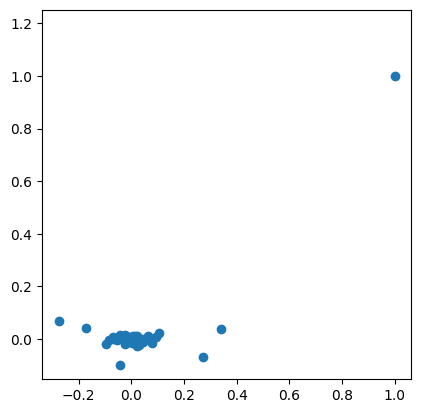

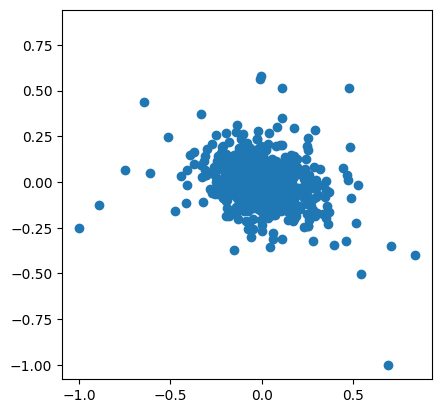

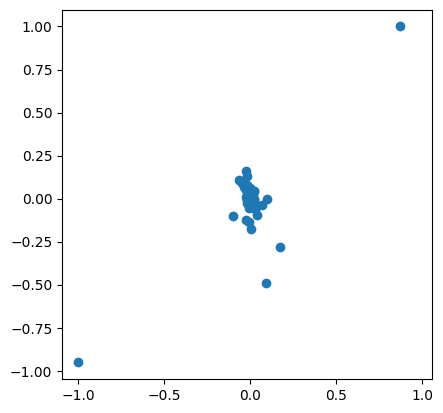

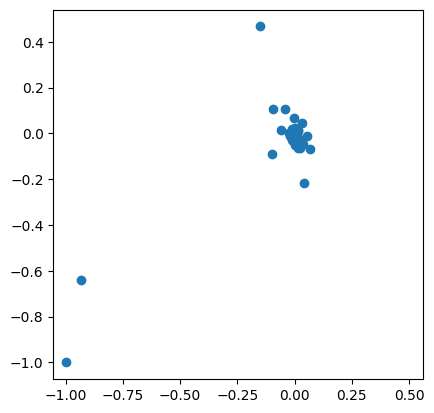

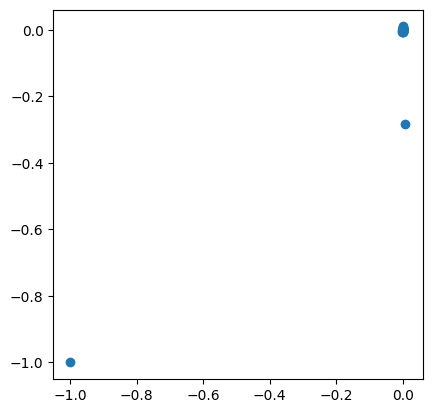

...

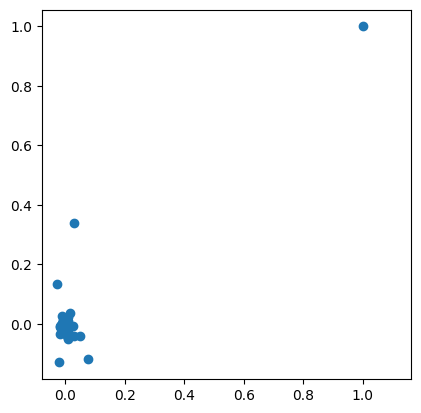

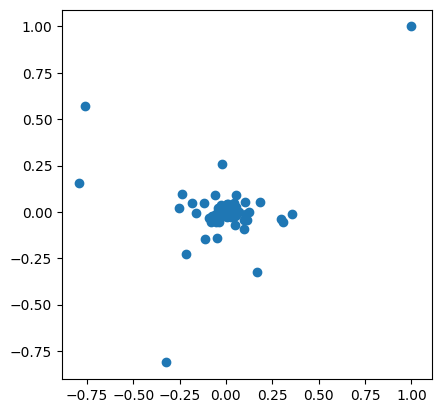

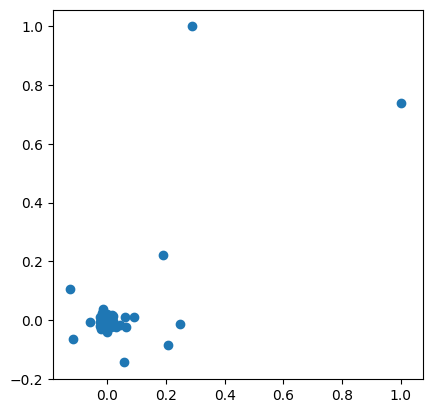

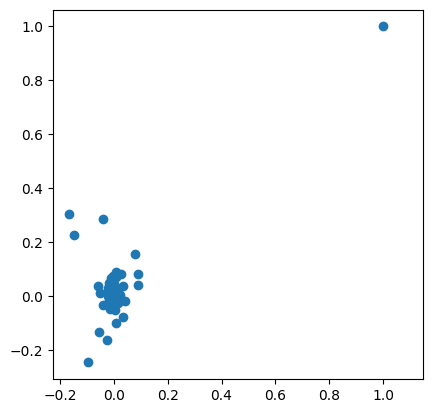

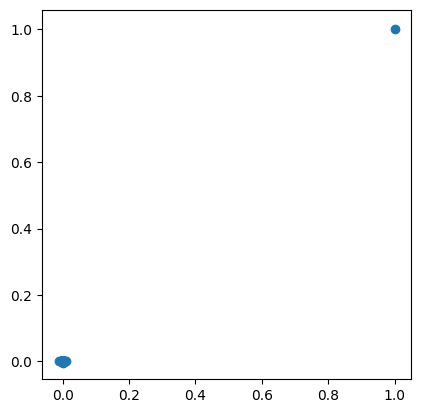

In [19]:
import matplotlib.pyplot as plt

for layer in range(30):
    s = layer_results[layer][2]
    
    s[0] = s[0] / np.max(np.abs(s[0]))
    s[1] = s[1] / np.max(np.abs(s[1]))
    
    plt.figure()
    plt.scatter(s[0], s[1], label=f'Layer {layer}')
    # make the plot square
    plt.axis('square')
    

          PreNums         PostNums  \
0       [0, 0, 0]        [0, 0, 0]   
1       [0, 0, 0]        [0, 0, 0]   
2       [0, 0, 0]        [0, 0, 0]   
3       [0, 0, 0]        [0, 0, 0]   
4  [110, 164, 94]  [114, 173, 207]   

                                     ProteinSequence  \
0  KGNLWVTVYYGVPVWKDAETTLFCASDAKAYDAEVHNIWATHACVP...   
1  NGNLWVTVYYGVPVWKDAETTLFCASDAKAYDAEVHNIWATHACVP...   
2  KGNLWVTVYYGVPVWKDAETTLFCASDAKAYDAEVHNIWATHACVP...   
3  NGNLWVTVYYGVPVWKDAETTLFCASDAKAYDAEVHNIWATHACVP...   
4  TGNLWVTVYYGVPVWKDAETTLFCASDAKAYDAEVHNIWATHACVP...   

                                          Embeddings  
0                                               None  
1                                               None  
2                                               None  
3                                               None  
4  [[-0.031634934, -0.027693663, -0.043913726, -0...  
Analyzing layer 0
corrs_list: [[np.float64(0.9931054036516168), np.float64(0.9953722583801246), np.float

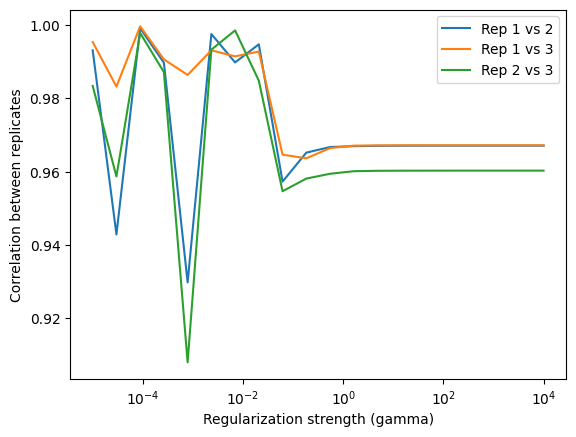

Found best regularization strength gamma = 8.9e-05, R = 1.00
Wrote inference results for layer 0
Analyzing layer 1
corrs_list: [[np.float64(0.9968171521857361), np.float64(0.9909883339711476), np.float64(0.9844117016670011)], [np.float64(0.9967154760698106), np.float64(0.9907639738779508), np.float64(0.9839377000235348)], [np.float64(0.9964041881009355), np.float64(0.9900936723571135), np.float64(0.982502703259176)], [np.float64(0.9954038327637355), np.float64(0.9880939530351556), np.float64(0.9780434324854668)], [np.float64(0.99183138013705), np.float64(0.9824978145820784), np.float64(0.963686454372392)], [np.float64(0.9778401775569434), np.float64(0.9758250206360187), np.float64(0.9242849965774584)], [np.float64(0.9904712901587545), np.float64(0.9931215371947193), np.float64(0.9730890705035515)], [np.float64(0.9825083719133736), np.float64(0.9595084661504603), np.float64(0.9843090315961601)], [np.float64(0.9961009332468937), np.float64(0.9856406135879433), np.float64(0.99586818132804

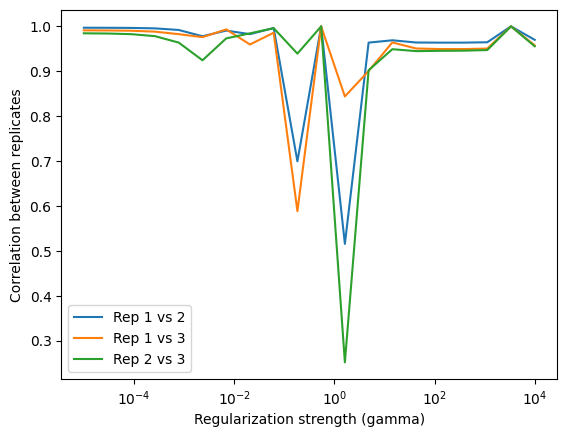

Found best regularization strength gamma = 3.4e+03, R = 1.00
Wrote inference results for layer 1
Analyzing layer 2
corrs_list: [[np.float64(0.906555016919189), np.float64(0.9433050472600344), np.float64(0.8720637837006664)], [np.float64(0.909151092340855), np.float64(0.9429925279465325), np.float64(0.8751740472547201)], [np.float64(0.9161082697728871), np.float64(0.9422311884028378), np.float64(0.8835529624456337)], [np.float64(0.9316844767368506), np.float64(0.9412621398822507), np.float64(0.9026447259158952)], [np.float64(0.9566876719896503), np.float64(0.947228834143311), np.float64(0.9356341882223178)], [np.float64(0.9994542332258877), np.float64(0.9994639436009835), np.float64(0.9999467106925582)], [np.float64(0.9891615835100367), np.float64(0.9563522730300599), np.float64(0.9801208263415815)], [np.float64(0.991820665740375), np.float64(0.9782470151401096), np.float64(0.9723994841397969)], [np.float64(0.9802024442568577), np.float64(0.9975610408008819), np.float64(0.97920026914948

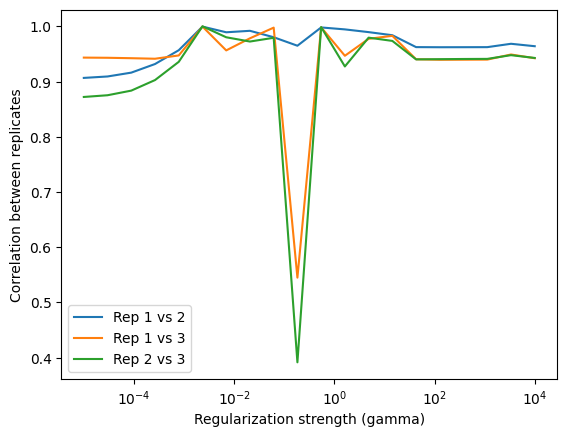

Found best regularization strength gamma = 2.3e-03, R = 1.00
Wrote inference results for layer 2
Analyzing layer 3
corrs_list: [[np.float64(0.9665753898969531), np.float64(0.969284222355065), np.float64(0.9546030715847218)], [np.float64(0.9655102879905524), np.float64(0.9683880023223084), np.float64(0.9535069199404878)], [np.float64(0.9623624729709369), np.float64(0.9657133127568072), np.float64(0.9503990806288192)], [np.float64(0.9533779254286883), np.float64(0.9578430498619663), np.float64(0.9427912923612392)], [np.float64(0.9326899068009848), np.float64(0.9389467948956383), np.float64(0.9376493103765156)], [np.float64(0.9046927790579086), np.float64(0.9527199095416732), np.float64(0.9885576421065728)], [np.float64(0.8400469025443429), np.float64(0.8865515328865605), np.float64(0.8968938536639204)], [np.float64(-0.9344374884231347), np.float64(-0.7640360432139821), np.float64(0.9404536168416573)], [np.float64(0.9688673204214828), np.float64(0.9401122487770954), np.float64(0.889051826

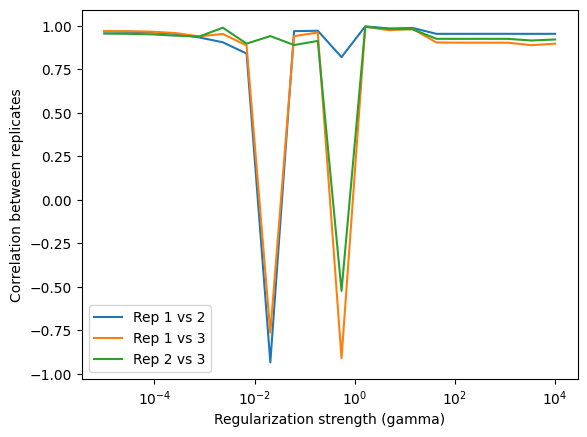

Found best regularization strength gamma = 1.6e+00, R = 0.99
Wrote inference results for layer 3
Analyzing layer 4
corrs_list: [[np.float64(0.89198100162302), np.float64(0.9495464412917489), np.float64(0.868403983692269)], [np.float64(0.8952268146679013), np.float64(0.9499836292649453), np.float64(0.8713788772580632)], [np.float64(0.9041827041467824), np.float64(0.951359935250087), np.float64(0.8796673337279354)], [np.float64(0.9259014868079526), np.float64(0.9560876280907682), np.float64(0.9005588327507303)], [np.float64(0.9669252749357921), np.float64(0.9748123700283897), np.float64(0.9482091321369982)], [np.float64(0.9748118079498557), np.float64(0.9274298826971727), np.float64(0.9462734743068688)], [np.float64(0.1647742823617059), np.float64(0.951993206340176), np.float64(-0.1017672849338814)], [np.float64(0.9984209410802611), np.float64(0.773365494495901), np.float64(0.7581796516769389)], [np.float64(0.834589068314017), np.float64(0.7574686751779063), np.float64(0.9839580905901252

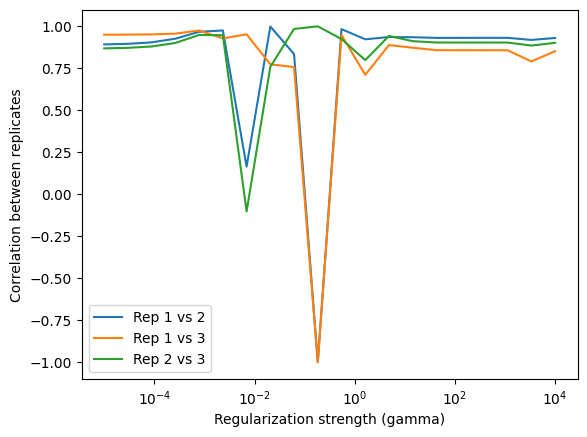

Found best regularization strength gamma = 7.8e-04, R = 0.96
Wrote inference results for layer 4
Analyzing layer 5
corrs_list: [[np.float64(0.7936671943446807), np.float64(0.6449950499130658), np.float64(0.42686705882228804)], [np.float64(0.7912134481627745), np.float64(0.646334628147333), np.float64(0.42070193268301026)], [np.float64(0.783324489003357), np.float64(0.6504929120868803), np.float64(0.40148976214534216)], [np.float64(0.753112349163502), np.float64(0.6653448053759446), np.float64(0.3357760622007223)], [np.float64(0.5012473483634423), np.float64(0.7758477376613464), np.float64(0.021243862727857388)], [np.float64(0.8522548485245065), np.float64(0.7889423506944769), np.float64(0.621289554118517)], [np.float64(0.842364463572089), np.float64(0.4722403237200078), np.float64(0.6922697045268278)], [np.float64(0.9994002290412328), np.float64(0.9857300653343025), np.float64(0.9872144899263614)], [np.float64(0.6846358627659934), np.float64(0.3495662232421286), np.float64(0.7807857186

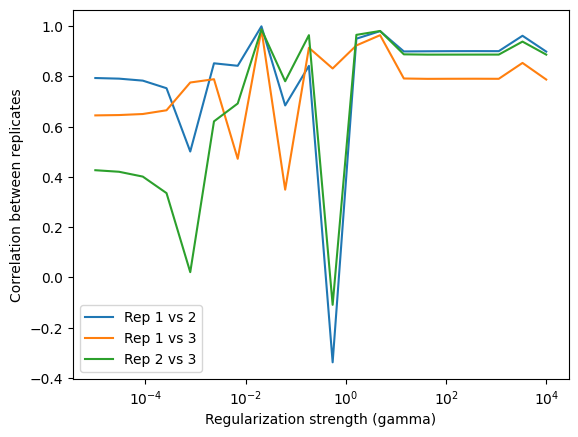

Found best regularization strength gamma = 2.1e-02, R = 0.99
Wrote inference results for layer 5
Analyzing layer 6
corrs_list: [[np.float64(0.7146132049056517), np.float64(0.1520797076637579), np.float64(0.6883469603852588)], [np.float64(0.7071330168414095), np.float64(0.1555421696020815), np.float64(0.703037162795934)], [np.float64(0.6822023644012306), np.float64(0.15689852578166097), np.float64(0.7408682578449878)], [np.float64(0.5574266157559193), np.float64(0.08911665950567654), np.float64(0.8292202587413159)], [np.float64(0.5843554975887546), np.float64(-0.27797060269408497), np.float64(0.6060921351653745)], [np.float64(0.9316355788982373), np.float64(0.9045765347280919), np.float64(0.981624364253909)], [np.float64(0.8466506102728784), np.float64(0.40602127220663226), np.float64(0.7344055919078465)], [np.float64(0.7748626712268982), np.float64(0.7873018587815913), np.float64(0.8192247175979034)], [np.float64(0.971262694387939), np.float64(-0.9500864454561944), np.float64(-0.877019

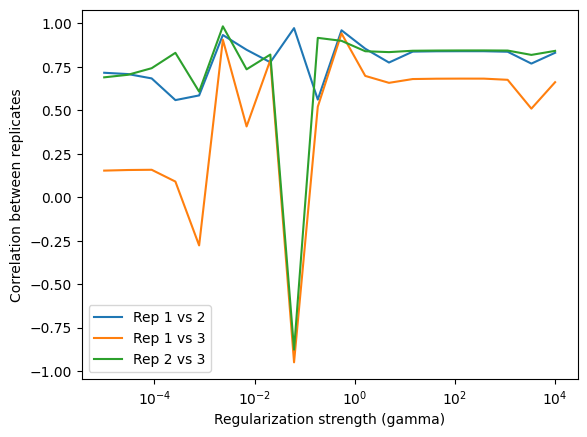

Found best regularization strength gamma = 2.3e-03, R = 0.94
Wrote inference results for layer 6
Analyzing layer 7
corrs_list: [[np.float64(0.8206529990081806), np.float64(0.20598320879695559), np.float64(0.637051575939918)], [np.float64(0.8204119280850601), np.float64(0.19621881954472017), np.float64(0.6305909070468112)], [np.float64(0.8198430465389446), np.float64(0.16726074274460712), np.float64(0.611193262492442)], [np.float64(0.8191346745986636), np.float64(0.08148632462782598), np.float64(0.5519199877041988)], [np.float64(0.8153071885343055), np.float64(-0.18878956854969575), np.float64(0.35713879342116694)], [np.float64(0.9676196623454232), np.float64(0.42398086225153164), np.float64(0.5933913684249413)], [np.float64(0.7474136860449092), np.float64(0.6034508532688259), np.float64(0.7523260102530731)], [np.float64(0.9879902365842719), np.float64(0.95992643001287), np.float64(0.9387594260851528)], [np.float64(0.9152032663055063), np.float64(0.9059715205094427), np.float64(0.968424

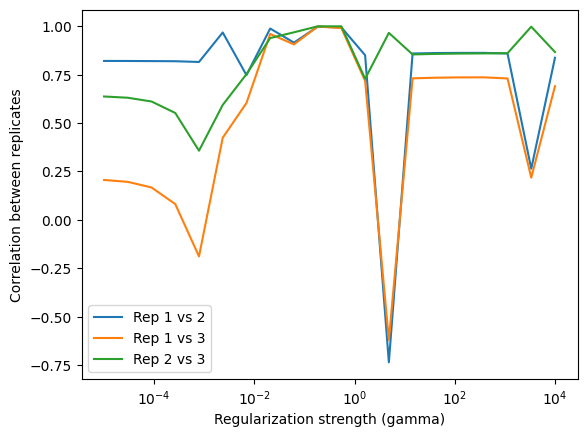

Found best regularization strength gamma = 2.1e-02, R = 0.96
Wrote inference results for layer 7
Analyzing layer 8
corrs_list: [[np.float64(0.9510835255930568), np.float64(0.8216739714473256), np.float64(0.8552062355896732)], [np.float64(0.9503291955459161), np.float64(0.8188255343922782), np.float64(0.8529260266391936)], [np.float64(0.9481187496839881), np.float64(0.8105030173771233), np.float64(0.846265694105589)], [np.float64(0.9419233352770904), np.float64(0.7874317413544043), np.float64(0.8277680813737998)], [np.float64(0.9293348888943469), np.float64(0.7436954373285456), np.float64(0.7900511554824856)], [np.float64(-0.9175965086958657), np.float64(-0.9323791217651273), np.float64(0.9991264142028159)], [np.float64(0.822362855024632), np.float64(0.5674314942082698), np.float64(0.7371750696587063)], [np.float64(0.9695929697727463), np.float64(0.6772856636277464), np.float64(0.548170652850984)], [np.float64(0.6481283173172203), np.float64(0.579479284303622), np.float64(0.271253293922

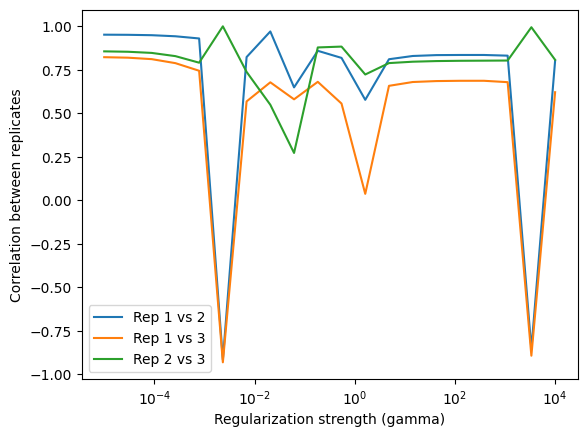

Found best regularization strength gamma = 1.0e-05, R = 0.88
Wrote inference results for layer 8
Analyzing layer 9
corrs_list: [[np.float64(-0.4315938852100388), np.float64(0.42739660394649265), np.float64(0.6130488658513147)], [np.float64(-0.4021709886664732), np.float64(0.4632965118959153), np.float64(0.607234128798637)], [np.float64(-0.3090189802516309), np.float64(0.5608627594082104), np.float64(0.5968764484399783)], [np.float64(0.02957633017697646), np.float64(0.7772785905121478), np.float64(0.6369908385203256)], [np.float64(-0.9810668379659195), np.float64(0.9969063472931039), np.float64(-0.9641144645975767)], [np.float64(-0.3875502429380283), np.float64(0.7121404816053271), np.float64(0.3334962266018047)], [np.float64(0.9965020256486139), np.float64(0.9981454370721978), np.float64(0.9981461706554567)], [np.float64(-0.03567444617522708), np.float64(0.01844105520853061), np.float64(0.9964163147729874)], [np.float64(0.9947781899071549), np.float64(0.9976344826418669), np.float64(0.

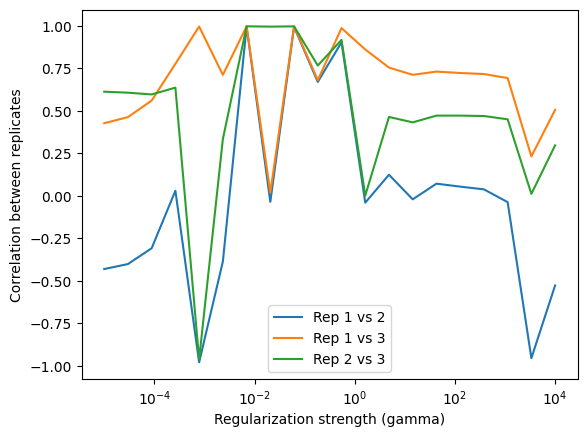

Found best regularization strength gamma = 7.0e-03, R = 1.00
Wrote inference results for layer 9
Analyzing layer 10
corrs_list: [[np.float64(0.35152162532118975), np.float64(0.385779220071063), np.float64(0.6908235476377849)], [np.float64(0.3442862577437007), np.float64(0.39147369927371056), np.float64(0.694406309958242)], [np.float64(0.3258610972596182), np.float64(0.4081167993355225), np.float64(0.7044862024537283)], [np.float64(0.29220977535950887), np.float64(0.4552062768949408), np.float64(0.7329913080071495)], [np.float64(0.34541684430259795), np.float64(0.5942829115950523), np.float64(0.8449996462508532)], [np.float64(0.2730135879393781), np.float64(0.851452188676219), np.float64(0.6270573000047652)], [np.float64(0.3181341474628553), np.float64(0.9170447309308123), np.float64(0.42899471157545366)], [np.float64(-0.4093482830019827), np.float64(0.7533923599410767), np.float64(0.16061355745635852)], [np.float64(0.6855048065254685), np.float64(0.9585386447884011), np.float64(0.71284

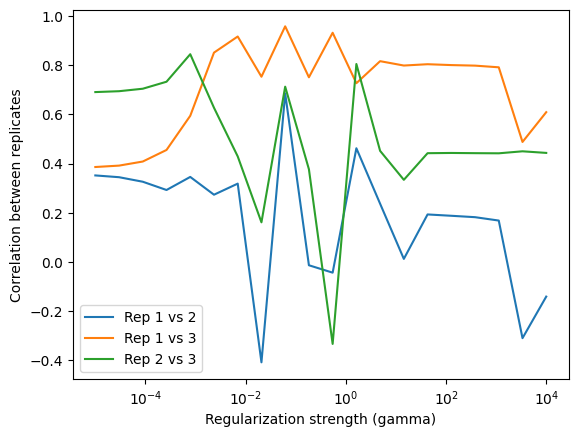

Found best regularization strength gamma = 6.2e-02, R = 0.79
Wrote inference results for layer 10
Analyzing layer 11
corrs_list: [[np.float64(0.760826076189848), np.float64(0.6540820808205732), np.float64(0.9352935688220211)], [np.float64(0.7602128030897345), np.float64(0.6542393684608278), np.float64(0.9326943476309559)], [np.float64(0.7579587540958157), np.float64(0.6547730599356169), np.float64(0.9248017424537243)], [np.float64(0.7482081883524803), np.float64(0.6568736977185873), np.float64(0.9000014735482883)], [np.float64(0.7033834130833747), np.float64(0.6667414789007506), np.float64(0.8173226682593736)], [np.float64(0.5370166856670556), np.float64(0.734203019840658), np.float64(0.5521530690668002)], [np.float64(-0.6872230214252779), np.float64(0.9129805096933478), np.float64(-0.8382228405118267)], [np.float64(-0.39415379957692503), np.float64(0.8348960580848588), np.float64(-0.3326995743270038)], [np.float64(0.4409713458237307), np.float64(0.45123462729607283), np.float64(0.6035

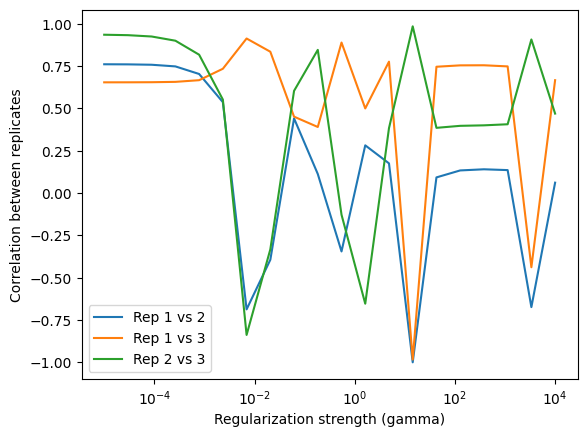

Found best regularization strength gamma = 1.0e-05, R = 0.78
Wrote inference results for layer 11
Analyzing layer 12
corrs_list: [[np.float64(0.9464888094701123), np.float64(0.9793891231391961), np.float64(0.98551582683755)], [np.float64(0.9448472982592303), np.float64(0.9810992760152337), np.float64(0.9821371635218561)], [np.float64(0.9398684406869859), np.float64(0.9843344032852538), np.float64(0.9707476230409474)], [np.float64(0.9243462035965511), np.float64(0.9832051391638087), np.float64(0.9317168666029427)], [np.float64(0.8743089229988797), np.float64(0.9603815153351603), np.float64(0.8389054397067406)], [np.float64(0.887331335258539), np.float64(0.9789668436623506), np.float64(0.905101207120973)], [np.float64(0.4301488166281998), np.float64(0.5708894175184063), np.float64(0.11645485846942892)], [np.float64(0.8071538523741324), np.float64(0.8863891904237351), np.float64(0.9459380853064026)], [np.float64(0.8977599917535917), np.float64(0.9874171779803038), np.float64(0.95337687742

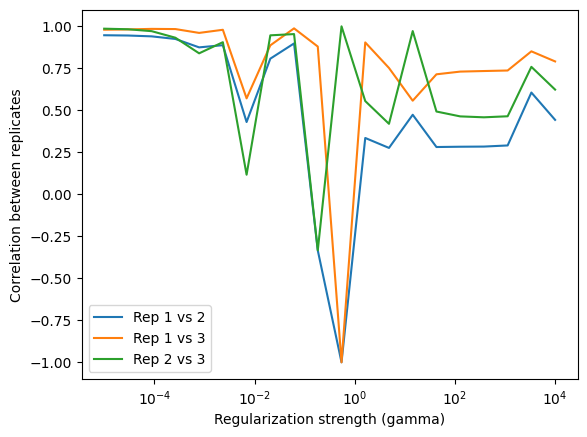

Found best regularization strength gamma = 1.0e-05, R = 0.97
Wrote inference results for layer 12
Analyzing layer 13
corrs_list: [[np.float64(0.8743049858055827), np.float64(0.9497339058505317), np.float64(0.9463327719652881)], [np.float64(0.8737429270431695), np.float64(0.9494506868009103), np.float64(0.9461820745168212)], [np.float64(0.8723093131142465), np.float64(0.9486946542495888), np.float64(0.9458537455465633)], [np.float64(0.8703413000073998), np.float64(0.947295317057861), np.float64(0.9460045249285258)], [np.float64(0.8880350275999449), np.float64(0.9523821964692685), np.float64(0.9569679294137312)], [np.float64(0.9943980193505626), np.float64(0.9980028375933735), np.float64(0.9965057483597427)], [np.float64(0.07539235097309932), np.float64(0.7218099911658982), np.float64(0.21896637702190308)], [np.float64(0.9180566292733047), np.float64(0.9935430600764238), np.float64(0.9252602160850102)], [np.float64(0.08238052320228323), np.float64(0.47047465925816473), np.float64(0.70785

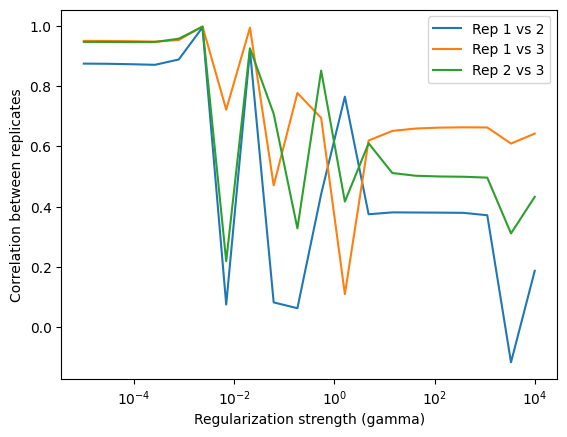

Found best regularization strength gamma = 2.3e-03, R = 1.00
Wrote inference results for layer 13
Analyzing layer 14
corrs_list: [[np.float64(-0.6572096427976548), np.float64(-0.9757073292339891), np.float64(0.7793852183163819)], [np.float64(-0.6760722604857883), np.float64(-0.9833041269239485), np.float64(0.7778093906137449)], [np.float64(-0.7434095494149175), np.float64(-0.9986495938105545), np.float64(0.7704671416251323)], [np.float64(0.995150043156394), np.float64(-0.6702679832921188), np.float64(-0.7339546929142282)], [np.float64(0.121264869354275), np.float64(-0.05655062328016458), np.float64(0.8864725204499053)], [np.float64(-0.09911520138956009), np.float64(0.06288147402583646), np.float64(0.48521308707378585)], [np.float64(0.35532234123717543), np.float64(0.6444169556410515), np.float64(0.7269740575907119)], [np.float64(0.935865893708842), np.float64(0.8646750023584286), np.float64(0.801309574727402)], [np.float64(0.8191227389183373), np.float64(0.8832618082829606), np.float64

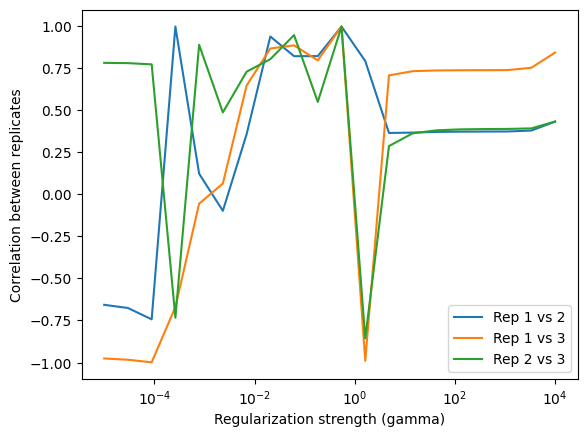

Found best regularization strength gamma = 5.5e-01, R = 1.00
Wrote inference results for layer 14
Analyzing layer 15
corrs_list: [[np.float64(0.9951847247875042), np.float64(0.9978064865299595), np.float64(0.9963600640677267)], [np.float64(0.9961079498546785), np.float64(0.9987472523449293), np.float64(0.9958449511470387)], [np.float64(-0.992829611511598), np.float64(-0.992437754465345), np.float64(0.9937512939930582)], [np.float64(-0.9313893169514472), np.float64(-0.8969019032117008), np.float64(0.9828159394210212)], [np.float64(-0.5435862276993636), np.float64(-0.3204416367534204), np.float64(0.9199784580230265)], [np.float64(0.15217732970502992), np.float64(0.5365130578292447), np.float64(0.7334126872241891)], [np.float64(0.8750885047564778), np.float64(0.9296894563672481), np.float64(0.8566529485282106)], [np.float64(-0.4195180555392205), np.float64(0.7846457541196169), np.float64(-0.3043345785224303)], [np.float64(0.8876295511548742), np.float64(0.9622670355858316), np.float64(0.8

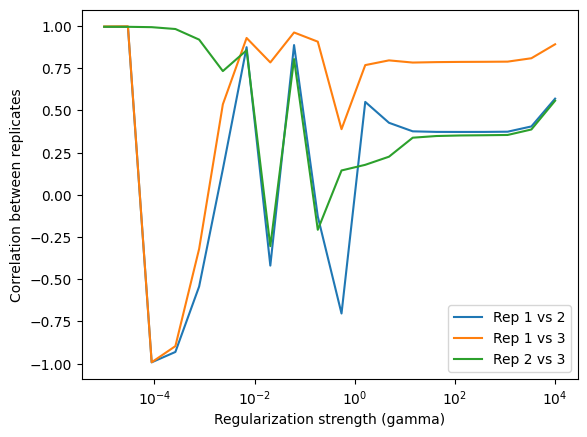

Found best regularization strength gamma = 1.0e-05, R = 1.00
Wrote inference results for layer 15
Analyzing layer 16
corrs_list: [[np.float64(0.3044797674835498), np.float64(0.633869372458692), np.float64(0.5029008531005754)], [np.float64(0.3047165559483407), np.float64(0.6335674672291576), np.float64(0.5049734275053019)], [np.float64(0.30534406036361544), np.float64(0.6326515597875316), np.float64(0.5113539530775224)], [np.float64(0.30661525394314587), np.float64(0.6297357050786505), np.float64(0.5325275066093841)], [np.float64(0.30880196151319517), np.float64(0.6177031397138707), np.float64(0.6259395362611071)], [np.float64(0.910396727393414), np.float64(0.8668800669430031), np.float64(0.83933501175088)], [np.float64(0.7366373877390414), np.float64(0.6303920495521286), np.float64(0.8402714205831618)], [np.float64(-0.26422310934943516), np.float64(0.6866451394074793), np.float64(0.2113890901000779)], [np.float64(-0.7295478635976239), np.float64(0.9982607611672752), np.float64(-0.76801

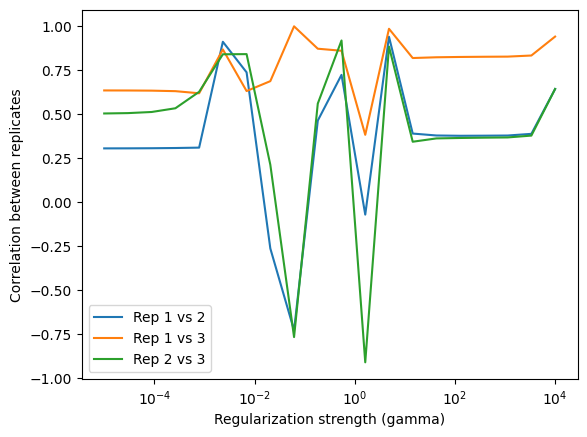

Found best regularization strength gamma = 4.8e+00, R = 0.94
Wrote inference results for layer 16
Analyzing layer 17
corrs_list: [[np.float64(0.047990414119749726), np.float64(0.907066365771316), np.float64(-0.1915926382951548)], [np.float64(0.054744961862970745), np.float64(0.9063486751130614), np.float64(-0.18597441176735524)], [np.float64(0.07455647512683265), np.float64(0.9042303016086952), np.float64(-0.16946559229250374)], [np.float64(0.1310455735461883), np.float64(0.8980916573822127), np.float64(-0.1221220981316861)], [np.float64(0.2800049674929308), np.float64(0.8815263389447597), np.float64(0.00528281957599247)], [np.float64(0.6061606132832211), np.float64(0.8533650250771004), np.float64(0.3146364076613036)], [np.float64(0.9986468411346772), np.float64(0.9942045421802728), np.float64(0.9945075624295581)], [np.float64(0.16856520426578817), np.float64(0.9319841387924489), np.float64(0.44886902398679557)], [np.float64(0.9644155751922863), np.float64(0.9528617935618403), np.float

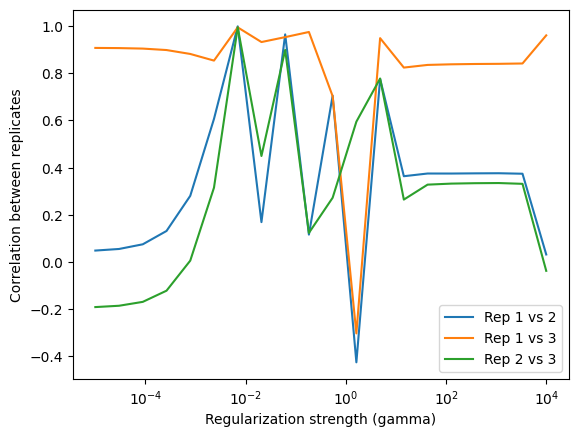

Found best regularization strength gamma = 7.0e-03, R = 1.00
Wrote inference results for layer 17
Analyzing layer 18
corrs_list: [[np.float64(0.4218631343048187), np.float64(0.6366793809028726), np.float64(0.6804988371940228)], [np.float64(0.42195847029097566), np.float64(0.6353741801450827), np.float64(0.6817486273788923)], [np.float64(0.42222600480701955), np.float64(0.631478486979915), np.float64(0.6854800011815537)], [np.float64(0.42287413176672284), np.float64(0.619786961131741), np.float64(0.6966886359932964)], [np.float64(0.4233693799090806), np.float64(0.5841572235058969), np.float64(0.7309633104348869)], [np.float64(0.4092504712663444), np.float64(0.4732067227215462), np.float64(0.8402202004460999)], [np.float64(0.47272233170324973), np.float64(0.38951443470782376), np.float64(0.9021881424133389)], [np.float64(-0.010253252941861968), np.float64(0.9174436068601747), np.float64(-0.2204233655019664)], [np.float64(0.9793605570615039), np.float64(0.9992077511217994), np.float64(0.9

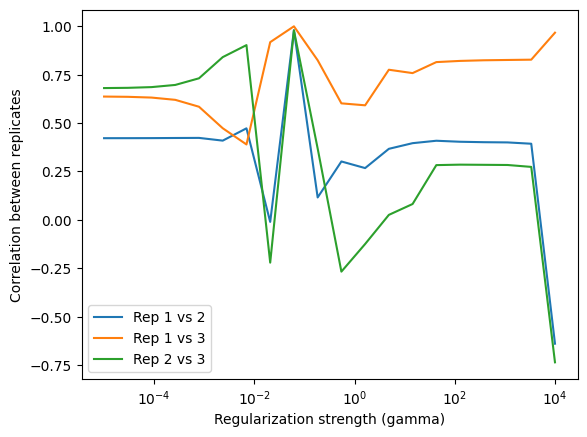

Found best regularization strength gamma = 6.2e-02, R = 0.99
Wrote inference results for layer 18
Analyzing layer 19
corrs_list: [[np.float64(0.7176727804696321), np.float64(0.15608701732355668), np.float64(-0.46326938588756944)], [np.float64(0.7007204212086937), np.float64(0.23033968885545014), np.float64(-0.41018973959681315)], [np.float64(0.6575797641917008), np.float64(0.4102801404462504), np.float64(-0.26911436660825594)], [np.float64(0.6130593055004279), np.float64(0.7172693823325649), np.float64(0.07554607773862018)], [np.float64(-0.9266253499993672), np.float64(0.9777086134703739), np.float64(-0.9516188883310196)], [np.float64(0.3056424259882468), np.float64(0.8379193989148594), np.float64(0.24381910645910032)], [np.float64(-0.06397535807481672), np.float64(0.7349008395604049), np.float64(-0.2189696646432598)], [np.float64(0.19406614046619525), np.float64(0.9304400182750076), np.float64(-0.08043570711361941)], [np.float64(-0.9751476555419143), np.float64(0.997610303407633), np.

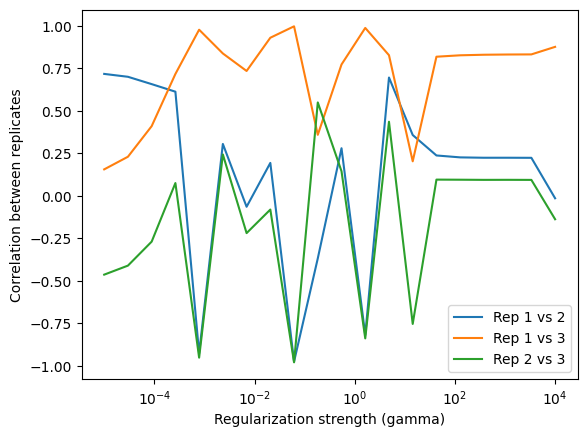

Found best regularization strength gamma = 4.8e+00, R = 0.65
Wrote inference results for layer 19
Analyzing layer 20
corrs_list: [[np.float64(0.22472133172307868), np.float64(0.27663603624703814), np.float64(0.657280067112606)], [np.float64(0.22813106614711104), np.float64(0.2809206097750908), np.float64(0.6527166148504899)], [np.float64(0.23793931403100047), np.float64(0.29327745678405737), np.float64(0.6393053483456976)], [np.float64(0.2643706244457926), np.float64(0.3268387642041029), np.float64(0.6009762989291604)], [np.float64(0.32387419886761826), np.float64(0.4042640698350409), np.float64(0.5015979852473038)], [np.float64(0.4113369531564547), np.float64(0.5262279397414741), np.float64(0.31380795852451265)], [np.float64(0.531911581054515), np.float64(0.6174612243426193), np.float64(0.1430193343452765)], [np.float64(-0.8462339896352219), np.float64(0.8823000000504083), np.float64(-0.9175401063294284)], [np.float64(-0.933986774897958), np.float64(0.9792564893642677), np.float64(-0.

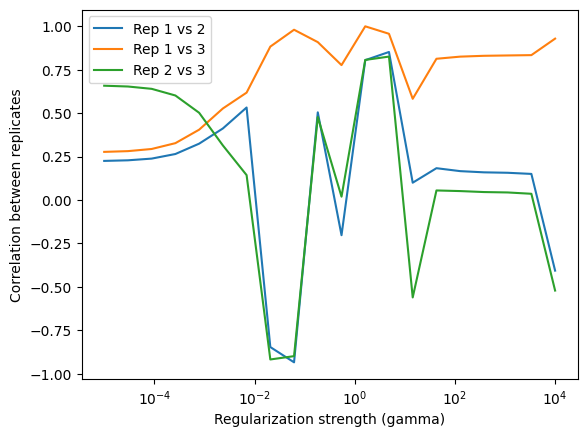

Found best regularization strength gamma = 1.6e+00, R = 0.87
Wrote inference results for layer 20
Analyzing layer 21
corrs_list: [[np.float64(0.07173436447311854), np.float64(0.577109705540235), np.float64(0.7671645383381576)], [np.float64(0.07623008351926958), np.float64(0.5815697429989513), np.float64(0.7656345560283694)], [np.float64(0.08923645411208876), np.float64(0.5941669350851111), np.float64(0.7613270451598665)], [np.float64(0.12491866755388988), np.float64(0.6263679082167236), np.float64(0.7505523454259607)], [np.float64(0.20978019382274904), np.float64(0.6889758592870066), np.float64(0.7332028136149806)], [np.float64(0.34806555147333496), np.float64(0.7468074246439782), np.float64(0.7511526357364782)], [np.float64(0.5753870274935882), np.float64(0.7421882352010515), np.float64(0.9526006927981593)], [np.float64(0.893023585047102), np.float64(0.9999456580380168), np.float64(0.8957882580593771)], [np.float64(0.48115754634770463), np.float64(0.8502330239646314), np.float64(0.381

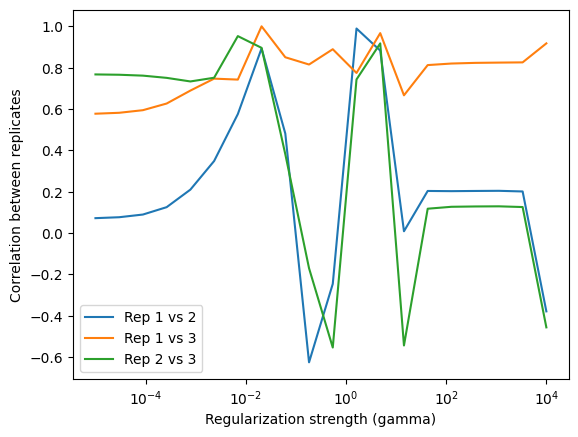

Found best regularization strength gamma = 2.1e-02, R = 0.93
Wrote inference results for layer 21
Analyzing layer 22
corrs_list: [[np.float64(0.1638104200136558), np.float64(0.3446724566299624), np.float64(-0.30144827396025714)], [np.float64(0.18224811503088184), np.float64(0.3668737788718804), np.float64(-0.2800234706162724)], [np.float64(0.23760426225613868), np.float64(0.42916420562283303), np.float64(-0.2136208022945613)], [np.float64(0.40024253886998673), np.float64(0.5847039779764993), np.float64(-0.0020524986192253236)], [np.float64(0.7755277110518721), np.float64(0.8544137609737315), np.float64(0.5630642761291208)], [np.float64(0.9145935683324137), np.float64(0.9704399702518317), np.float64(0.9695986748829108)], [np.float64(-0.34933072040455193), np.float64(0.8928235538052267), np.float64(-0.22269634835175722)], [np.float64(0.33594835971885123), np.float64(0.9244308156683075), np.float64(0.42799070317205856)], [np.float64(0.6767725178780659), np.float64(0.9505084770068444), np.

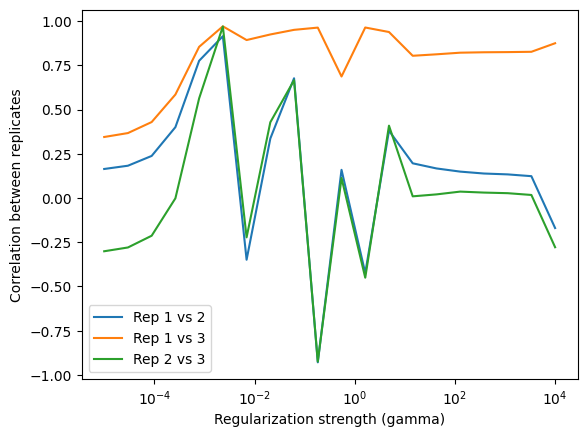

Found best regularization strength gamma = 2.3e-03, R = 0.95
Wrote inference results for layer 22
Analyzing layer 23
corrs_list: [[np.float64(-0.28782075043497407), np.float64(0.7960558092116294), np.float64(-0.2936909324638932)], [np.float64(-0.286605674974138), np.float64(0.7960716336940965), np.float64(-0.2926754064810135)], [np.float64(-0.28299771946055413), np.float64(0.796122409843324), np.float64(-0.2896665850875786)], [np.float64(-0.2723348777527323), np.float64(0.7963054178925311), np.float64(-0.28083176696991297)], [np.float64(-0.24127109788076515), np.float64(0.7971155824624245), np.float64(-0.2555717989038453)], [np.float64(-0.15481330543076904), np.float64(0.8015207940275167), np.float64(-0.18878704172589278)], [np.float64(0.047762812945378486), np.float64(0.8275992849458869), np.float64(-0.0497685614027836)], [np.float64(0.9422532137798187), np.float64(0.9996263841318249), np.float64(0.9357273271557043)], [np.float64(0.7295298698751203), np.float64(0.5979167808175159), np

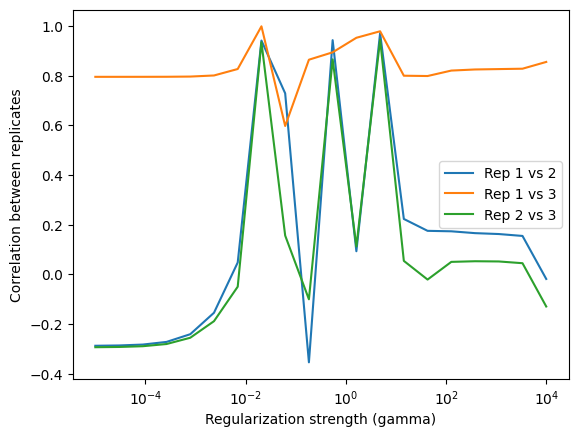

Found best regularization strength gamma = 4.8e+00, R = 0.97
Wrote inference results for layer 23
Analyzing layer 24
corrs_list: [[np.float64(0.4767029158439987), np.float64(0.8618206794593674), np.float64(0.34024945443941895)], [np.float64(0.47672077751452135), np.float64(0.8618443818475798), np.float64(0.3403511635591706)], [np.float64(0.4767730168378512), np.float64(0.8619163438281644), np.float64(0.3406529377688293)], [np.float64(0.47692025448894465), np.float64(0.8621430772778325), np.float64(0.3415425295881005)], [np.float64(0.47728364659687095), np.float64(0.8629294800737994), np.float64(0.34410900696782365)], [np.float64(0.4776490578316291), np.float64(0.8662761892879707), np.float64(0.3508978867184594)], [np.float64(0.4703723335583103), np.float64(0.8861226183036596), np.float64(0.36043857196057366)], [np.float64(0.9082001750924978), np.float64(0.9603217705019766), np.float64(0.8335579269486368)], [np.float64(0.8393740790925546), np.float64(0.9211575921235196), np.float64(0.82

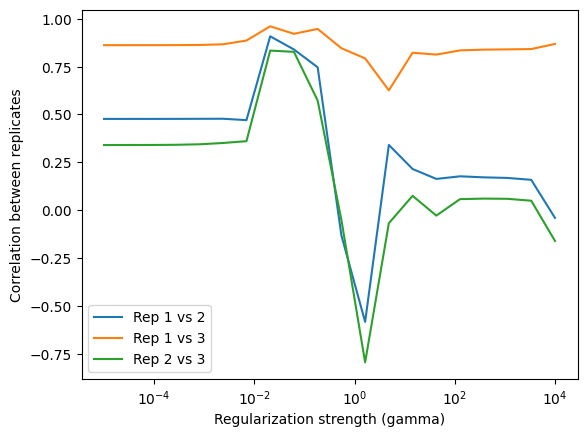

Found best regularization strength gamma = 2.1e-02, R = 0.90
Wrote inference results for layer 24
Analyzing layer 25
corrs_list: [[np.float64(-0.653948539016924), np.float64(0.9184276182403537), np.float64(-0.5816884355659435)], [np.float64(-0.6587898997030998), np.float64(0.9192413751162863), np.float64(-0.5866880224273663)], [np.float64(-0.6732803825293552), np.float64(0.9216751031523058), np.float64(-0.6017312539942967)], [np.float64(-0.7169616215028872), np.float64(0.9290120361812011), np.float64(-0.6478069618406352)], [np.float64(-0.8455067498607878), np.float64(0.9512988498399344), np.float64(-0.790446665008535)], [np.float64(0.9708201858687004), np.float64(0.998902883154091), np.float64(0.9729334949107151)], [np.float64(-0.29786478690482776), np.float64(0.44112958936663715), np.float64(0.29498031593213814)], [np.float64(-0.3436958955325783), np.float64(0.9757033557042174), np.float64(-0.20125081868368935)], [np.float64(-0.5644570793355483), np.float64(0.9723564023258167), np.flo

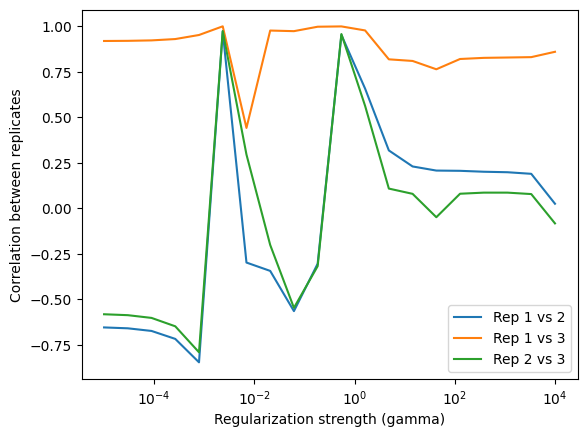

Found best regularization strength gamma = 2.3e-03, R = 0.98
Wrote inference results for layer 25
Analyzing layer 26
corrs_list: [[np.float64(0.24104382490492032), np.float64(0.5533128365815947), np.float64(-0.11432712009696476)], [np.float64(0.24065584904436535), np.float64(0.5538889985703177), np.float64(-0.1141969471211724)], [np.float64(0.2395072348579471), np.float64(0.5555888585581531), np.float64(-0.11381762169561598)], [np.float64(0.2361413740813137), np.float64(0.5605204944266388), np.float64(-0.11275548670416809)], [np.float64(0.2265534178011028), np.float64(0.574189760692085), np.float64(-0.11007177575525369)], [np.float64(0.20103547248547757), np.float64(0.6084019695785055), np.float64(-0.10424868354981458)], [np.float64(0.14121370484383544), np.float64(0.6874073850468865), np.float64(-0.08302776409363388)], [np.float64(0.21479326961715395), np.float64(0.977356538087248), np.float64(0.23025926666160992)], [np.float64(0.715896046358412), np.float64(0.7649865459507441), np.fl

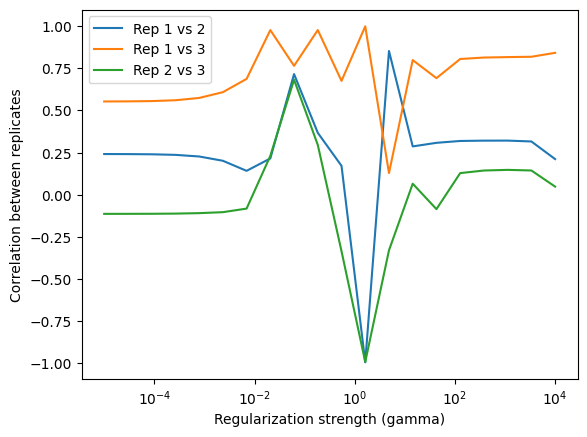

Found best regularization strength gamma = 6.2e-02, R = 0.72
Wrote inference results for layer 26
Analyzing layer 27
corrs_list: [[np.float64(0.3032165897083806), np.float64(0.9181580827737479), np.float64(0.13031705204895117)], [np.float64(0.2965660005223506), np.float64(0.9182748310250721), np.float64(0.12276898767468247)], [np.float64(0.27640417502259923), np.float64(0.9186681800641261), np.float64(0.10001784690822921)], [np.float64(0.2129861098696895), np.float64(0.9202497990606742), np.float64(0.02971811077491223)], [np.float64(-0.009577118573998237), np.float64(0.9286621855483344), np.float64(-0.20300177654018248)], [np.float64(-0.8540820601870314), np.float64(0.9777867613736821), np.float64(-0.9242530333951392)], [np.float64(-0.0471466347648333), np.float64(0.9173256148049073), np.float64(-0.2065699675521941)], [np.float64(-0.1484603564017855), np.float64(0.9384959705174474), np.float64(-0.369505425445803)], [np.float64(0.37430022731035095), np.float64(0.9882981044622996), np.fl

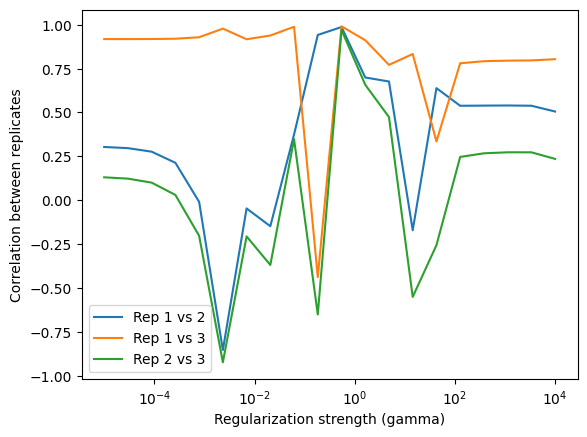

Found best regularization strength gamma = 5.5e-01, R = 0.98
Wrote inference results for layer 27
Analyzing layer 28
corrs_list: [[np.float64(0.8344158009763953), np.float64(0.9870065455320928), np.float64(0.8051177049291578)], [np.float64(0.8337350104819091), np.float64(0.9868678375197583), np.float64(0.8041879852117543)], [np.float64(0.8317343716654334), np.float64(0.9864524979371905), np.float64(0.8014432808862711)], [np.float64(0.8260006442879818), np.float64(0.9851951840376239), np.float64(0.7934697047701601)], [np.float64(0.810733461693929), np.float64(0.9812902672945089), np.float64(0.7713799295991363)], [np.float64(0.7776581985686993), np.float64(0.9687634250951059), np.float64(0.7179866331865918)], [np.float64(0.736193214899608), np.float64(0.9330534380013884), np.float64(0.6324374333297937)], [np.float64(0.8230356331446524), np.float64(0.9427523955239414), np.float64(0.7599400817778464)], [np.float64(0.47283138983629164), np.float64(0.8196035118267968), np.float64(0.645915173

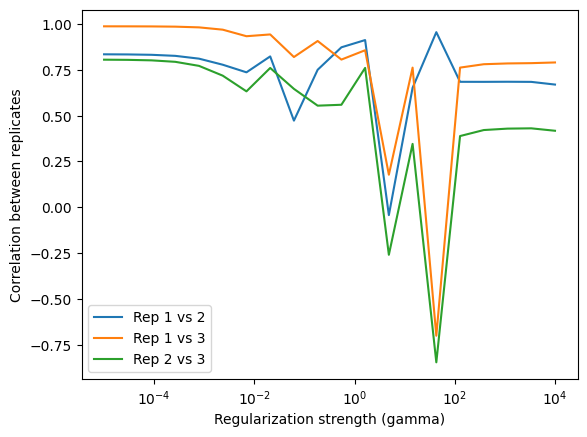

Found best regularization strength gamma = 1.0e-05, R = 0.88
Wrote inference results for layer 28
Analyzing layer 29
corrs_list: [[np.float64(0.9860450330664118), np.float64(0.8489068291649835), np.float64(0.8285395433782554)], [np.float64(0.9860529655605428), np.float64(0.8514418014743108), np.float64(0.8314282007521401)], [np.float64(0.986084938032432), np.float64(0.8588199861644057), np.float64(0.8396761638613158)], [np.float64(0.9862476552865027), np.float64(0.8786782952461739), np.float64(0.8610084218118703)], [np.float64(0.9871504201839674), np.float64(0.9194794634846227), np.float64(0.9025859520456967)], [np.float64(0.9915872448622448), np.float64(0.9729831694225802), np.float64(0.9586239661732856)], [np.float64(0.9972604759250697), np.float64(0.9940239671282879), np.float64(0.9902900104316572)], [np.float64(0.9465740134041989), np.float64(0.9208771263006732), np.float64(0.8945326856517188)], [np.float64(0.5359426242583973), np.float64(0.48472028602217593), np.float64(-0.4210616

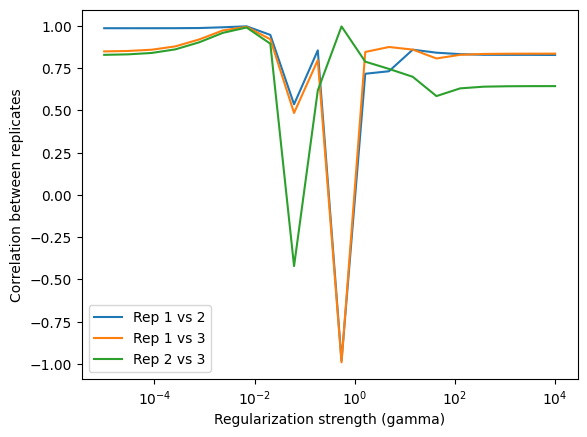

Found best regularization strength gamma = 2.3e-03, R = 0.97
Wrote inference results for layer 29
Analyzing layer 30
corrs_list: [[np.float64(0.6908142571805864), np.float64(0.9320740605397424), np.float64(0.5745838631528616)], [np.float64(0.70973604124413), np.float64(0.9317753056811182), np.float64(0.5948978865253691)], [np.float64(0.7537500824557177), np.float64(0.9300562484942454), np.float64(0.6388682429910961)], [np.float64(0.839863387532162), np.float64(0.9210096363355835), np.float64(0.6991727497928005)], [np.float64(0.9051444645356274), np.float64(0.983402431219076), np.float64(0.8436897925469631)], [np.float64(0.7870445011861262), np.float64(0.7109541242383824), np.float64(0.9672831864736194)], [np.float64(0.8709799622579261), np.float64(0.8757770054333659), np.float64(0.8178674292688904)], [np.float64(0.8920110689594639), np.float64(0.9514766572176172), np.float64(0.8675104742859574)], [np.float64(0.9906869217189108), np.float64(0.9926590148122432), np.float64(0.976057000026

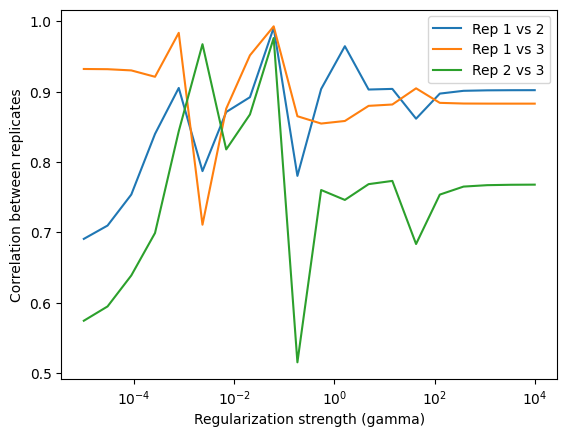

Found best regularization strength gamma = 6.2e-02, R = 0.99
Wrote inference results for layer 30


"import matplotlib.pyplot as plt\n\nfor layer in range(30):\n    s = old_layer_results[layer][2]\n    \n    s[0] = s[0] / np.max(np.abs(s[0]))\n    s[1] = s[1] / np.max(np.abs(s[1]))\n    \n    plt.figure()\n    plt.scatter(s[0], s[1], label=f'Layer {layer}')\n    # make the plot square\n    plt.axis('square')\n    "

In [39]:
whole_df = pd.read_pickle(pwd + '/data/sequence_data/all_reps_BF520_protein_embeddings.pkl')

print(whole_df.head())

whole_df = whole_df[whole_df["Embeddings"].notnull()].reset_index(drop=True)

reload(popDMS)

old_layer_results = analyze_layers(whole_df, output_path=pwd + '/test/out',
                    embed_path=pwd + '/test/embeds', dataname='TEST')

"""import matplotlib.pyplot as plt

for layer in range(30):
    s = old_layer_results[layer][2]
    
    s[0] = s[0] / np.max(np.abs(s[0]))
    s[1] = s[1] / np.max(np.abs(s[1]))
    
    plt.figure()
    plt.scatter(s[0], s[1], label=f'Layer {layer}')
    # make the plot square
    plt.axis('square')
    """



### SCRAMBLING ONE

In [28]:
whole_df = pd.read_pickle(pwd + '/data/sequence_data/all_reps_BF520_protein_embeddings.pkl')

print(whole_df.head())

# loop through every index in the dataframe
whole_df = whole_df[whole_df["Embeddings"].notnull()].reset_index(drop=True)

for i in range(whole_df.shape[0]):
    if whole_df.at[i, "Embeddings"] is not None:
        random_pre_num = np.random.randint(0, 100)
        random_post_num = np.random.randint(0, 100)
        
        pre_nums = whole_df.at[i, "PreNums"]
        post_nums = whole_df.at[i, "PostNums"]
        
        whole_df.at[i, "PreNums"] = [random_pre_num, pre_nums[1], pre_nums[2]]
        whole_df.at[i, "PostNums"] = [random_post_num, post_nums[1], post_nums[2]]
        

    

print(whole_df.head())

          PreNums         PostNums  \
0       [0, 0, 0]        [0, 0, 0]   
1       [0, 0, 0]        [0, 0, 0]   
2       [0, 0, 0]        [0, 0, 0]   
3       [0, 0, 0]        [0, 0, 0]   
4  [110, 164, 94]  [114, 173, 207]   

                                     ProteinSequence  \
0  KGNLWVTVYYGVPVWKDAETTLFCASDAKAYDAEVHNIWATHACVP...   
1  NGNLWVTVYYGVPVWKDAETTLFCASDAKAYDAEVHNIWATHACVP...   
2  KGNLWVTVYYGVPVWKDAETTLFCASDAKAYDAEVHNIWATHACVP...   
3  NGNLWVTVYYGVPVWKDAETTLFCASDAKAYDAEVHNIWATHACVP...   
4  TGNLWVTVYYGVPVWKDAETTLFCASDAKAYDAEVHNIWATHACVP...   

                                          Embeddings  
0                                               None  
1                                               None  
2                                               None  
3                                               None  
4  [[-0.031634934, -0.027693663, -0.043913726, -0...  
         PreNums        PostNums  \
0  [32, 164, 94]  [20, 173, 207]   
1     [80, 0, 0]      [40, 1, 1]

Analyzing layer 0
corrs_list: [[np.float64(0.9353878872311167), np.float64(0.8746957480228947), np.float64(0.9833833596385786)], [np.float64(0.7857303628548874), np.float64(0.6090343814978686), np.float64(0.9586749213445549)], [np.float64(-0.9973125396664196), np.float64(-0.9919156821028197), np.float64(0.997822490395841)], [np.float64(0.6301110461586956), np.float64(0.6139903045576742), np.float64(0.9871502594083464)], [np.float64(0.5850317753179154), np.float64(0.44934450780328816), np.float64(0.9079528811783025)], [np.float64(0.8622596283741182), np.float64(0.8958346201595211), np.float64(0.9932742693029624)], [np.float64(0.9647762364895386), np.float64(0.9574111810435648), np.float64(0.9985384985354713)], [np.float64(0.9729960634578052), np.float64(0.9456899138901838), np.float64(0.9848213002604604)], [np.float64(0.26836767850722976), np.float64(0.28200381727946366), np.float64(0.9546457179479446)], [np.float64(0.25902602489889726), np.float64(0.2719712627728502), np.float64(0.9580

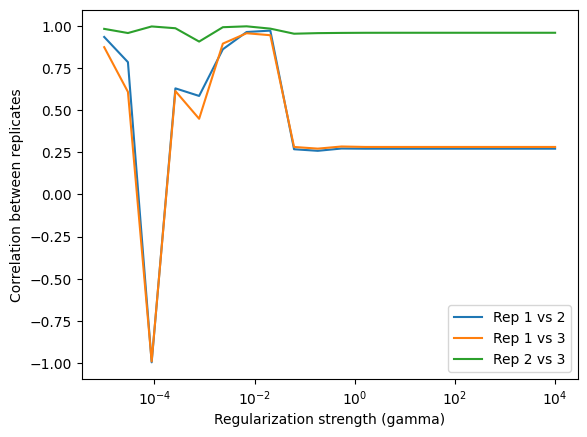

Found best regularization strength gamma = 7.0e-03, R = 0.97
Wrote inference results for layer 0
Analyzing layer 1
corrs_list: [[np.float64(0.8931972893202708), np.float64(0.8760543266431647), np.float64(0.9844117016670011)], [np.float64(0.890386788973714), np.float64(0.8728402271108884), np.float64(0.9839377000235348)], [np.float64(0.8818673311912923), np.float64(0.863164666156987), np.float64(0.982502703259176)], [np.float64(0.8552553524409717), np.float64(0.8335859271258768), np.float64(0.9780434324854668)], [np.float64(0.7680610754905962), np.float64(0.7429964705184853), np.float64(0.963686454372392)], [np.float64(0.5273821388067735), np.float64(0.5313492060413769), np.float64(0.9242849965774584)], [np.float64(0.9430167126616327), np.float64(0.905438339543091), np.float64(0.9730890705035515)], [np.float64(0.15322899322090427), np.float64(0.14578063583830675), np.float64(0.9843090315961601)], [np.float64(0.9788209932537093), np.float64(0.963315874981806), np.float64(0.99586818132804

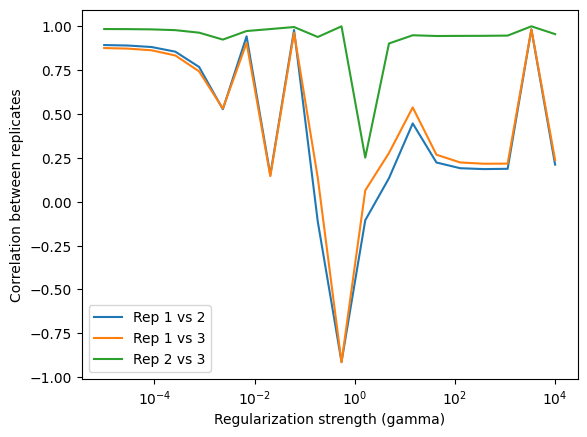

Found best regularization strength gamma = 3.4e+03, R = 0.99
Wrote inference results for layer 1
Analyzing layer 2
corrs_list: [[np.float64(0.021183222673715814), np.float64(0.35311687424155364), np.float64(0.8720637837006664)], [np.float64(0.019091009831285408), np.float64(0.34138640565382117), np.float64(0.8751740472547201)], [np.float64(0.012642038258619485), np.float64(0.3074487472179903), np.float64(0.8835529624456337)], [np.float64(-0.009364964912029174), np.float64(0.21270849601170871), np.float64(0.9026447259158952)], [np.float64(-0.12407929227750106), np.float64(-0.06451162031280208), np.float64(0.9356341882223178)], [np.float64(-0.7101069229655149), np.float64(-0.7125777264266269), np.float64(0.9999467106925582)], [np.float64(0.22598064534765958), np.float64(0.07473855351621322), np.float64(0.9801208263415815)], [np.float64(0.10116164166013747), np.float64(0.17254657748282973), np.float64(0.9723994841397969)], [np.float64(-0.8070229858407776), np.float64(-0.8547244487196356),

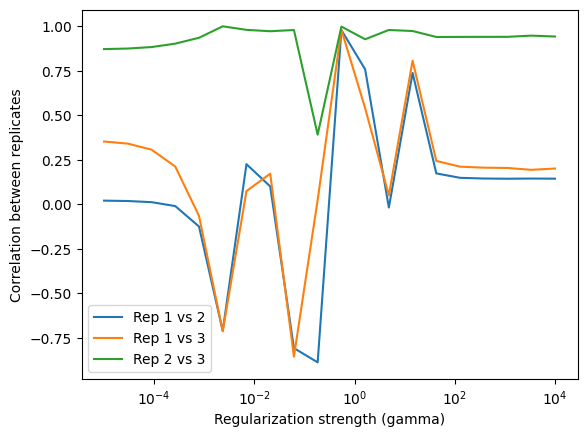

Found best regularization strength gamma = 5.5e-01, R = 0.99
Wrote inference results for layer 2
Analyzing layer 3
corrs_list: [[np.float64(0.12103898448694214), np.float64(-0.07662449071695729), np.float64(0.9546030715847218)], [np.float64(0.1348135425786553), np.float64(-0.06481509314209821), np.float64(0.9535069199404878)], [np.float64(0.17439151066729025), np.float64(-0.030288355200701833), np.float64(0.9503990806288192)], [np.float64(0.2801759887862661), np.float64(0.06729608756711905), np.float64(0.9427912923612392)], [np.float64(0.5068880318823292), np.float64(0.3171044611079551), np.float64(0.9376493103765156)], [np.float64(0.7937343033904991), np.float64(0.7111554878792313), np.float64(0.9885576421065728)], [np.float64(0.8319953985073267), np.float64(0.8112595184951077), np.float64(0.8968938536639204)], [np.float64(0.5018713030010702), np.float64(0.6024421886974537), np.float64(0.9404536168416573)], [np.float64(-0.16252242570680267), np.float64(0.005841375908879676), np.float6

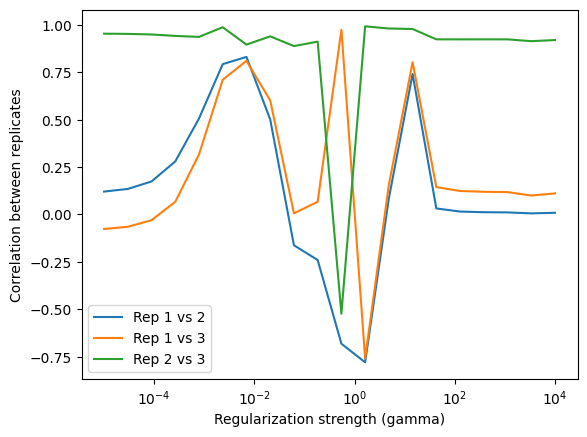

Found best regularization strength gamma = 2.3e-03, R = 0.83
Wrote inference results for layer 3
Analyzing layer 4
corrs_list: [[np.float64(0.2452439769728732), np.float64(-0.08241874730159111), np.float64(0.868403983692269)], [np.float64(0.2338508513804307), np.float64(-0.08541983667574594), np.float64(0.8713788772580632)], [np.float64(0.19967452121006785), np.float64(-0.09594761959573489), np.float64(0.8796673337279354)], [np.float64(0.09478503618659193), np.float64(-0.14032636106747604), np.float64(0.9005588327507303)], [np.float64(-0.2748952164782897), np.float64(-0.3828976555119524), np.float64(0.9482091321369982)], [np.float64(-0.31650878550083905), np.float64(-0.2209372134704839), np.float64(0.9462734743068688)], [np.float64(-0.2680414939224367), np.float64(0.6818103973314272), np.float64(-0.1017672849338814)], [np.float64(-0.5726394093033124), np.float64(-0.26151468462986815), np.float64(0.7581796516769389)], [np.float64(0.45120082971132186), np.float64(0.566549987401427), np.f

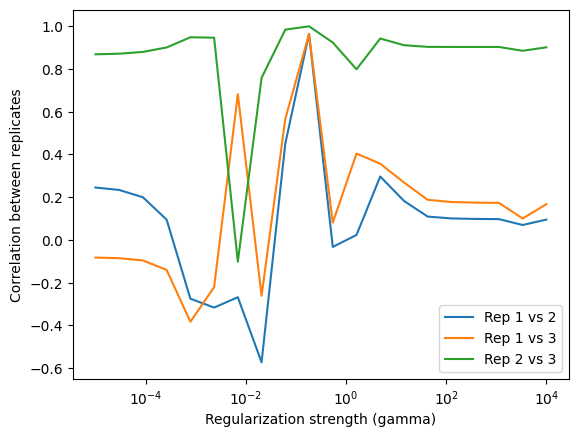

Found best regularization strength gamma = 1.8e-01, R = 0.98
Wrote inference results for layer 4
Analyzing layer 5
corrs_list: [[np.float64(0.002866265586261501), np.float64(0.3371268675310968), np.float64(0.42686705882228804)], [np.float64(0.0032677036046915367), np.float64(0.3528768817282835), np.float64(0.42070193268301026)], [np.float64(0.0026404936553130094), np.float64(0.4051367449839223), np.float64(0.40148976214534216)], [np.float64(-0.027754050739180726), np.float64(0.6246286754171836), np.float64(0.3357760622007223)], [np.float64(0.3123402307647286), np.float64(-0.494027504845535), np.float64(0.021243862727857388)], [np.float64(0.5758409697902791), np.float64(0.3488108009911727), np.float64(0.621289554118517)], [np.float64(0.5445230459113088), np.float64(0.9120823050755736), np.float64(0.6922697045268278)], [np.float64(-0.9894968609378878), np.float64(-0.9554301457627008), np.float64(0.9872144899263614)], [np.float64(0.8502990024909164), np.float64(0.5728882541852965), np.flo

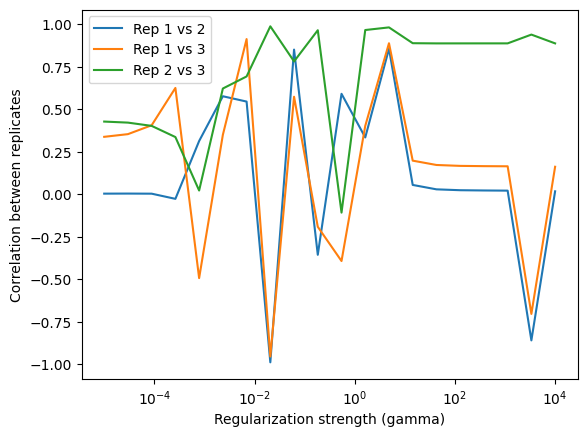

Found best regularization strength gamma = 4.8e+00, R = 0.91
Wrote inference results for layer 5
Analyzing layer 6
corrs_list: [[np.float64(0.32624483737816473), np.float64(-0.07339545126214628), np.float64(0.6883469603852588)], [np.float64(0.30662451526784856), np.float64(-0.0784552362262769), np.float64(0.703037162795934)], [np.float64(0.2641382055404687), np.float64(-0.06634167374930819), np.float64(0.7408682578449878)], [np.float64(0.19952846526586943), np.float64(0.009148993420336003), np.float64(0.8292202587413159)], [np.float64(0.6931753542086474), np.float64(0.2114401179916698), np.float64(0.6060921351653745)], [np.float64(-0.5043089962302394), np.float64(-0.3903277115098035), np.float64(0.981624364253909)], [np.float64(-0.16674991080659038), np.float64(-0.004882592600177274), np.float64(0.7344055919078465)], [np.float64(0.31226574067434126), np.float64(0.2840187545534518), np.float64(0.8192247175979034)], [np.float64(-0.6062776256602334), np.float64(0.6050678431141051), np.flo

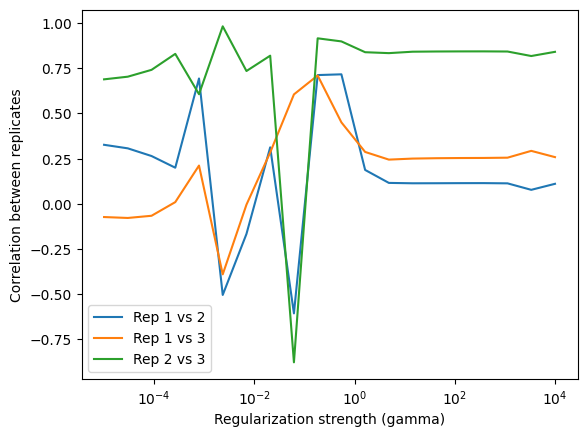

Found best regularization strength gamma = 1.8e-01, R = 0.78
Wrote inference results for layer 6
Analyzing layer 7
corrs_list: [[np.float64(-0.36474537341349644), np.float64(-0.14270639611173452), np.float64(0.637051575939918)], [np.float64(-0.37445768939826385), np.float64(-0.1499892692627746), np.float64(0.6305909070468112)], [np.float64(-0.40305367534677283), np.float64(-0.17146356500943183), np.float64(0.611193262492442)], [np.float64(-0.4853575009727229), np.float64(-0.23323534550796496), np.float64(0.5519199877041988)], [np.float64(-0.7025067935670016), np.float64(-0.3797739880839327), np.float64(0.35713879342116694)], [np.float64(-0.6820094921334503), np.float64(-0.8816574963780106), np.float64(0.5933913684249413)], [np.float64(-0.5796059127036799), np.float64(-0.08808650137462096), np.float64(0.7523260102530731)], [np.float64(0.3342716378091368), np.float64(0.07762196858158898), np.float64(0.9387594260851528)], [np.float64(0.8603111256667544), np.float64(0.8541232600200429), np

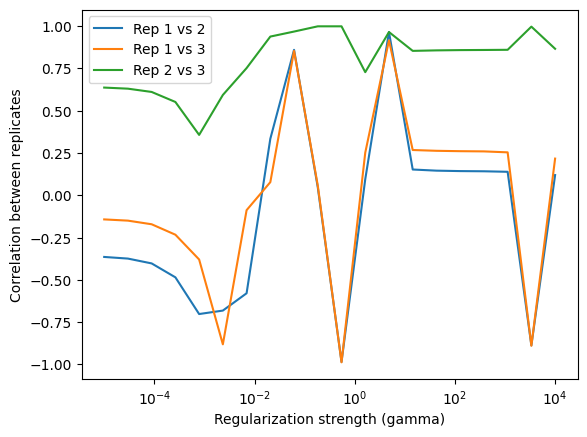

Found best regularization strength gamma = 4.8e+00, R = 0.95
Wrote inference results for layer 7
Analyzing layer 8
corrs_list: [[np.float64(0.5398366030626066), np.float64(0.7190047763006417), np.float64(0.8552062355896732)], [np.float64(0.5370687030927962), np.float64(0.7198050671628843), np.float64(0.8529260266391936)], [np.float64(0.530057202767879), np.float64(0.723107813488663), np.float64(0.846265694105589)], [np.float64(0.5191205701850388), np.float64(0.7398522484825566), np.float64(0.8277680813737998)], [np.float64(0.5553737789722529), np.float64(0.8244109438312585), np.float64(0.7900511554824856)], [np.float64(-0.9939375282589451), np.float64(-0.9971740513537687), np.float64(0.9991264142028159)], [np.float64(0.39575858851500517), np.float64(0.5943735609942407), np.float64(0.7371750696587063)], [np.float64(-0.9539152208951529), np.float64(-0.28719367658588885), np.float64(0.548170652850984)], [np.float64(0.7705618690469374), np.float64(-0.05285448383669969), np.float64(0.271253

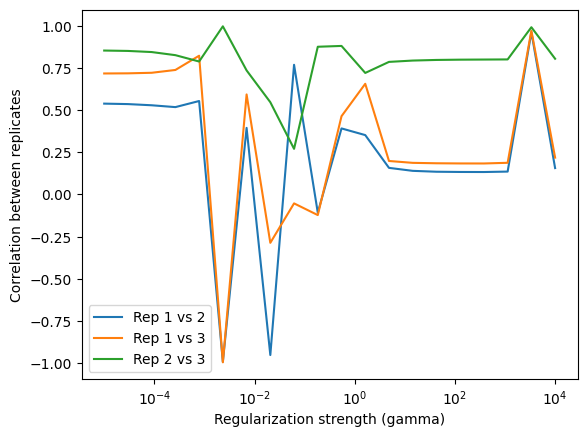

Found best regularization strength gamma = 3.4e+03, R = 0.98
Wrote inference results for layer 8
Analyzing layer 9
corrs_list: [[np.float64(0.19316773191608158), np.float64(0.803305989197431), np.float64(0.6130488658513147)], [np.float64(0.2549154319591768), np.float64(0.8350210969201366), np.float64(0.607234128798637)], [np.float64(0.4136889824658382), np.float64(0.8847503827741491), np.float64(0.5968764484399783)], [np.float64(0.6851772893081964), np.float64(0.8050115312169028), np.float64(0.6369908385203256)], [np.float64(-0.2254018244551811), np.float64(0.3622389132157493), np.float64(-0.9641144645975767)], [np.float64(0.8081571664082207), np.float64(-0.16882162854997423), np.float64(0.3334962266018047)], [np.float64(-0.9917906690227866), np.float64(-0.9907437745898932), np.float64(0.9981461706554567)], [np.float64(-0.982701077467471), np.float64(-0.9934570344269934), np.float64(0.9964163147729874)], [np.float64(-0.9824972572647954), np.float64(-0.9788792697372293), np.float64(0.99

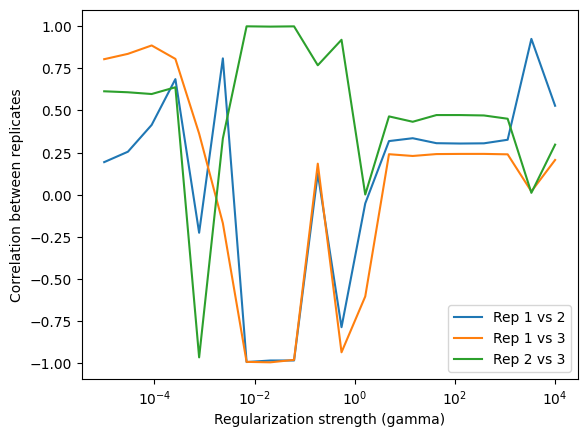

Found best regularization strength gamma = 2.6e-04, R = 0.71
Wrote inference results for layer 9
Analyzing layer 10
corrs_list: [[np.float64(-0.1841948681664699), np.float64(0.1254582052028107), np.float64(0.6908235476377849)], [np.float64(-0.17286596829040077), np.float64(0.13016703446475553), np.float64(0.694406309958242)], [np.float64(-0.14354688202069385), np.float64(0.14307580417916718), np.float64(0.7044862024537283)], [np.float64(-0.0876456347572313), np.float64(0.17040007296653126), np.float64(0.7329913080071495)], [np.float64(-0.09386153396391958), np.float64(0.12942007332313832), np.float64(0.8449996462508532)], [np.float64(0.02722797748703798), np.float64(0.4041659302574865), np.float64(0.6270573000047652)], [np.float64(0.3457685858277612), np.float64(0.5483465150093177), np.float64(0.42899471157545366)], [np.float64(-0.04804984848506841), np.float64(-0.3931626747967537), np.float64(0.16061355745635852)], [np.float64(-0.4946579231186212), np.float64(-0.2777820602234058), np.

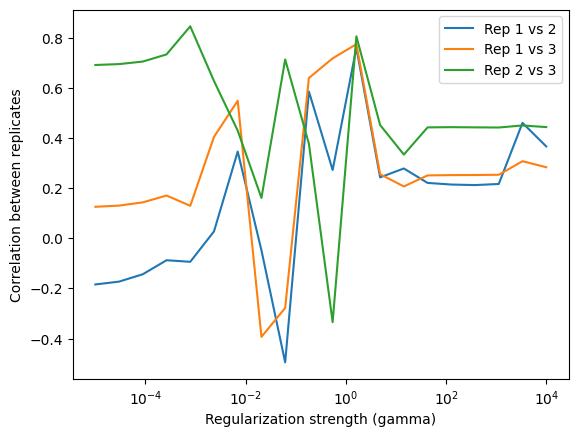

Found best regularization strength gamma = 1.6e+00, R = 0.78
Wrote inference results for layer 10
Analyzing layer 11
corrs_list: [[np.float64(-0.4346188557202638), np.float64(-0.2804970464546272), np.float64(0.9352935688220211)], [np.float64(-0.43462237809711135), np.float64(-0.2815368879467327), np.float64(0.9326943476309559)], [np.float64(-0.43308043901360416), np.float64(-0.2838585734888254), np.float64(0.9248017424537243)], [np.float64(-0.4168801724065572), np.float64(-0.2849723237756161), np.float64(0.9000014735482883)], [np.float64(-0.30138640981216813), np.float64(-0.25582338708683927), np.float64(0.8173226682593736)], [np.float64(0.23834535589662725), np.float64(-0.040373364430866795), np.float64(0.5521530690668002)], [np.float64(0.924753872348159), np.float64(-0.6757103830734075), np.float64(-0.8382228405118267)], [np.float64(-0.674908689743917), np.float64(0.7523299932050619), np.float64(-0.3326995743270038)], [np.float64(0.2378959989221976), np.float64(-0.03951057082718255),

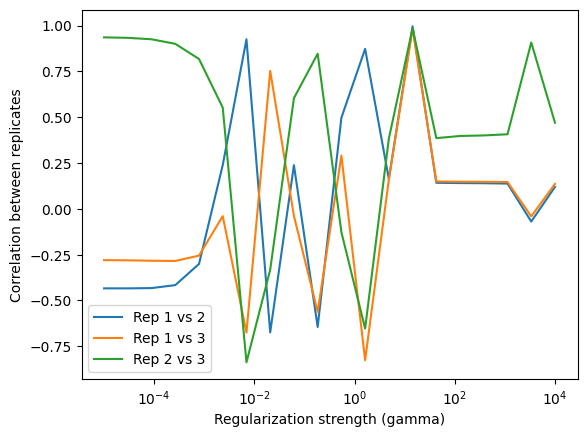

Found best regularization strength gamma = 1.4e+01, R = 0.99
Wrote inference results for layer 11
Analyzing layer 12
corrs_list: [[np.float64(0.9871608403104287), np.float64(0.9665545726622532), np.float64(0.98551582683755)], [np.float64(0.9847977586288038), np.float64(0.9590641268818505), np.float64(0.9821371635218561)], [np.float64(0.9762962527096096), np.float64(0.9337026071737246), np.float64(0.9707476230409474)], [np.float64(0.9415820690143685), np.float64(0.8446861059037629), np.float64(0.9317168666029427)], [np.float64(0.8184767480658919), np.float64(0.616966182984192), np.float64(0.8389054397067406)], [np.float64(0.9043023395318706), np.float64(0.8374110418803102), np.float64(0.905101207120973)], [np.float64(-0.3068092536139845), np.float64(0.31571034068188386), np.float64(0.11645485846942892)], [np.float64(-0.3032531732954875), np.float64(-0.45758478343842013), np.float64(0.9459380853064026)], [np.float64(-0.8119514371870922), np.float64(-0.8582788193872676), np.float64(0.9533

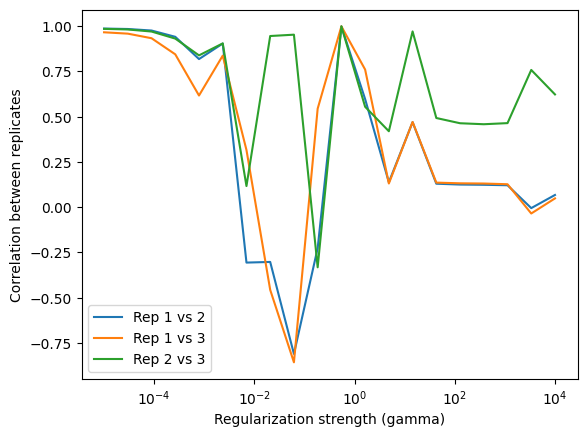

Found best regularization strength gamma = 5.5e-01, R = 1.00
Wrote inference results for layer 12
Analyzing layer 13
corrs_list: [[np.float64(0.5379217216520272), np.float64(0.5224743161487595), np.float64(0.9463327719652881)], [np.float64(0.5448540103517886), np.float64(0.5298824135737015), np.float64(0.9461820745168212)], [np.float64(0.5654341185453021), np.float64(0.551925115305049), np.float64(0.9458537455465633)], [np.float64(0.6260391511918875), np.float64(0.6171875757693979), np.float64(0.9460045249285258)], [np.float64(0.794282084495023), np.float64(0.7983500815557247), np.float64(0.9569679294137312)], [np.float64(0.9896327361181104), np.float64(0.990801251389366), np.float64(0.9965057483597427)], [np.float64(0.0760035519607582), np.float64(0.2859534575392217), np.float64(0.21896637702190308)], [np.float64(-0.8765064967834603), np.float64(-0.8538774605516424), np.float64(0.9252602160850102)], [np.float64(0.4050203222266584), np.float64(0.5195910920426955), np.float64(0.70785689

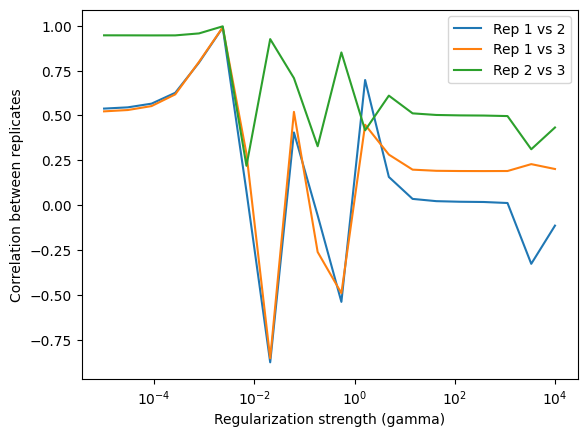

Found best regularization strength gamma = 2.3e-03, R = 0.99
Wrote inference results for layer 13
Analyzing layer 14
corrs_list: [[np.float64(0.7561530569630825), np.float64(0.20954443722421007), np.float64(0.7793852183163819)], [np.float64(0.7547572828144709), np.float64(0.20458163959976022), np.float64(0.7778093906137449)], [np.float64(0.748561917087259), np.float64(0.18506261455921952), np.float64(0.7704671416251323)], [np.float64(0.6826367064555104), np.float64(-0.057416910394567006), np.float64(-0.7339546929142282)], [np.float64(-0.7268301475481601), np.float64(-0.7474141394310546), np.float64(0.8864725204499053)], [np.float64(-0.24924899724628174), np.float64(0.20872852816381493), np.float64(0.48521308707378585)], [np.float64(0.6230758226265127), np.float64(0.6023980926859716), np.float64(0.7269740575907119)], [np.float64(0.543205449677939), np.float64(0.19792249133692533), np.float64(0.801309574727402)], [np.float64(-0.5366443563340767), np.float64(-0.5026393029630835), np.float

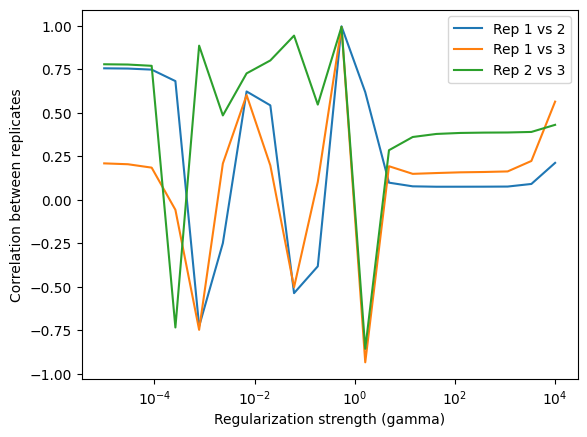

Found best regularization strength gamma = 5.5e-01, R = 1.00
Wrote inference results for layer 14
Analyzing layer 15
corrs_list: [[np.float64(-0.9667003776983134), np.float64(-0.9732900534270329), np.float64(0.9963600640677267)], [np.float64(-0.96336106426106), np.float64(-0.9690804136051624), np.float64(0.9958449511470387)], [np.float64(-0.952515203272551), np.float64(-0.9546697033169725), np.float64(0.9937512939930582)], [np.float64(-0.9125680819436519), np.float64(-0.8963213771840107), np.float64(0.9828159394210212)], [np.float64(-0.7391816519461829), np.float64(-0.6301573478034668), np.float64(0.9199784580230265)], [np.float64(-0.0902140319644717), np.float64(0.1070025194782962), np.float64(0.7334126872241891)], [np.float64(0.9051242542383844), np.float64(0.8317634782378942), np.float64(0.8566529485282106)], [np.float64(-0.34292672262673396), np.float64(0.9503774210846511), np.float64(-0.3043345785224303)], [np.float64(-0.8588424754567971), np.float64(-0.5770347613394353), np.float

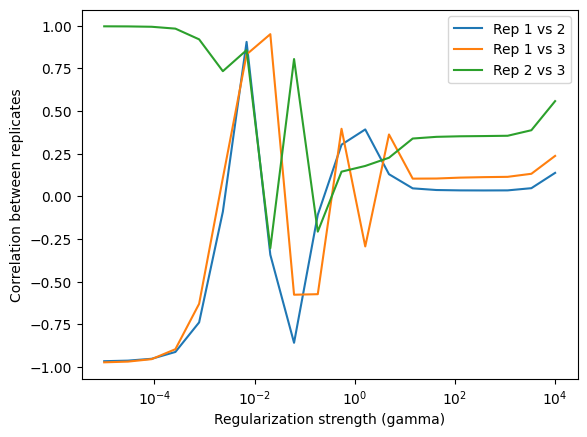

Found best regularization strength gamma = 7.0e-03, R = 0.86
Wrote inference results for layer 15
Analyzing layer 16
corrs_list: [[np.float64(-0.4476688312587632), np.float64(-0.24021609066074567), np.float64(0.5029008531005754)], [np.float64(-0.45042197999765077), np.float64(-0.24268931462705612), np.float64(0.5049734275053019)], [np.float64(-0.4589213772583869), np.float64(-0.250326637231409), np.float64(0.5113539530775224)], [np.float64(-0.48692033625836084), np.float64(-0.2758525418994563), np.float64(0.5325275066093841)], [np.float64(-0.5936380128110307), np.float64(-0.38895671507372376), np.float64(0.6259395362611071)], [np.float64(0.961822566780069), np.float64(0.7524645895552086), np.float64(0.83933501175088)], [np.float64(0.4412853433799831), np.float64(0.09006284609549167), np.float64(0.8402714205831618)], [np.float64(-0.615898072867139), np.float64(0.17696723901975026), np.float64(0.2113890901000779)], [np.float64(-0.37008372793506156), np.float64(0.33048556003220797), np.fl

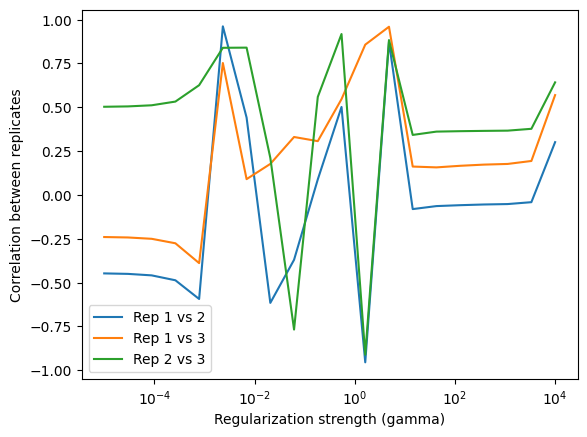

Found best regularization strength gamma = 4.8e+00, R = 0.91
Wrote inference results for layer 16
Analyzing layer 17
corrs_list: [[np.float64(-0.5686521235666673), np.float64(0.5625120230582608), np.float64(-0.1915926382951548)], [np.float64(-0.5668204552315749), np.float64(0.5585047844435527), np.float64(-0.18597441176735524)], [np.float64(-0.5615864161330847), np.float64(0.5465681975438974), np.float64(-0.16946559229250374)], [np.float64(-0.5478609160883854), np.float64(0.5109623685233231), np.float64(-0.1221220981316861)], [np.float64(-0.5216151198768522), np.float64(0.4043031905720608), np.float64(0.00528281957599247)], [np.float64(-0.5397325116425464), np.float64(0.07176526012382445), np.float64(0.3146364076613036)], [np.float64(-0.9791425133599695), np.float64(-0.9700977046084365), np.float64(0.9945075624295581)], [np.float64(-0.4868030853589786), np.float64(0.4394194751135824), np.float64(0.44886902398679557)], [np.float64(-0.947448652863958), np.float64(-0.8535547119954976), np

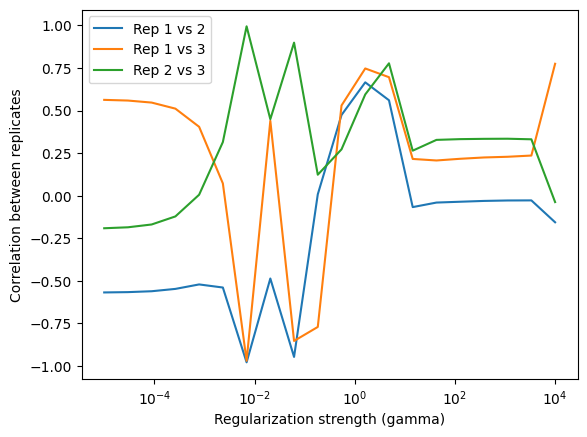

Found best regularization strength gamma = 1.6e+00, R = 0.67
Wrote inference results for layer 17
Analyzing layer 18
corrs_list: [[np.float64(0.4390729726142393), np.float64(0.7748132273062518), np.float64(0.6804988371940228)], [np.float64(0.4411709014835826), np.float64(0.7754921011585196), np.float64(0.6817486273788923)], [np.float64(0.44743938149518564), np.float64(0.7775392806125194), np.float64(0.6854800011815537)], [np.float64(0.46630979894296415), np.float64(0.7838628197318328), np.float64(0.6966886359932964)], [np.float64(0.5243030248947125), np.float64(0.8045777160606087), np.float64(0.7309633104348869)], [np.float64(0.7103564173819609), np.float64(0.8783803990899388), np.float64(0.8402202004460999)], [np.float64(0.8602278388718508), np.float64(0.9464880346830311), np.float64(0.9021881424133389)], [np.float64(-0.47900927988708375), np.float64(0.9132784171653086), np.float64(-0.2204233655019664)], [np.float64(0.9319143472020791), np.float64(0.9702364511008967), np.float64(0.977

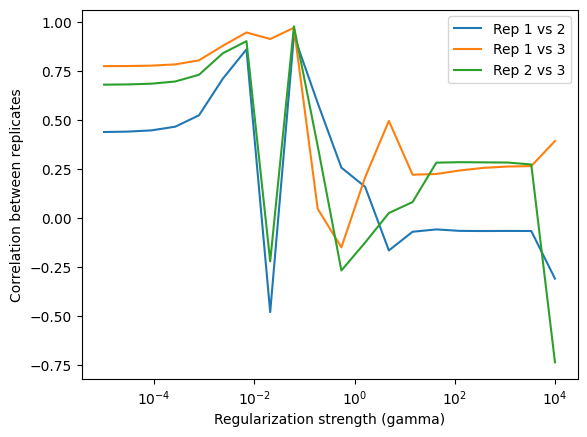

Found best regularization strength gamma = 6.2e-02, R = 0.96
Wrote inference results for layer 18
Analyzing layer 19
corrs_list: [[np.float64(0.14880920577963197), np.float64(-0.6857559587266358), np.float64(-0.46326938588756944)], [np.float64(0.1250832960570557), np.float64(-0.6998873212180698), np.float64(-0.41018973959681315)], [np.float64(0.051055132826856), np.float64(-0.7380525403212023), np.float64(-0.26911436660825594)], [np.float64(-0.21047977745287155), np.float64(-0.8354712498157321), np.float64(0.07554607773862018)], [np.float64(-0.9103321987136196), np.float64(0.9759947323177222), np.float64(-0.9516188883310196)], [np.float64(0.06074047785368214), np.float64(-0.38459470192194517), np.float64(0.24381910645910032)], [np.float64(0.014379871294241897), np.float64(0.27970429259816915), np.float64(-0.2189696646432598)], [np.float64(0.14862409799059906), np.float64(-0.07536675107647595), np.float64(-0.08043570711361941)], [np.float64(-0.9706132148917114), np.float64(0.98626948691

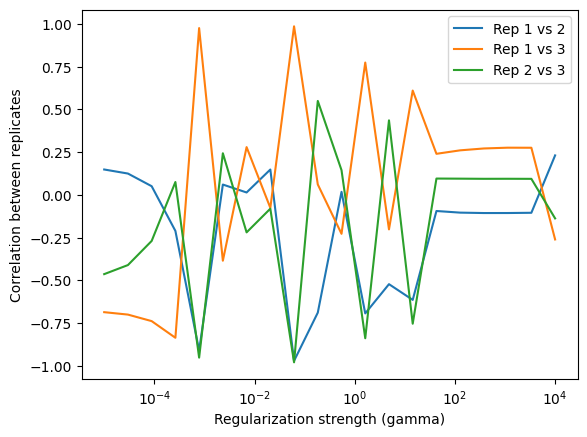

Found best regularization strength gamma = 3.4e+03, R = 0.09
Wrote inference results for layer 19
Analyzing layer 20
corrs_list: [[np.float64(-0.7287334023806761), np.float64(-0.7260788018520588), np.float64(0.657280067112606)], [np.float64(-0.7239210747441425), np.float64(-0.7199363661006358), np.float64(0.6527166148504899)], [np.float64(-0.7095866980026105), np.float64(-0.7016231998607408), np.float64(0.6393053483456976)], [np.float64(-0.6670251165995359), np.float64(-0.6471501525490105), np.float64(0.6009762989291604)], [np.float64(-0.5451073507476311), np.float64(-0.49119620420770066), np.float64(0.5015979852473038)], [np.float64(-0.2579104534993537), np.float64(-0.13489527791451525), np.float64(0.31380795852451265)], [np.float64(0.19110181745821514), np.float64(0.2730208431268331), np.float64(0.1430193343452765)], [np.float64(-0.28159148144224466), np.float64(0.4291387282715277), np.float64(-0.9175401063294284)], [np.float64(-0.948830152322939), np.float64(0.9621703071907369), np.

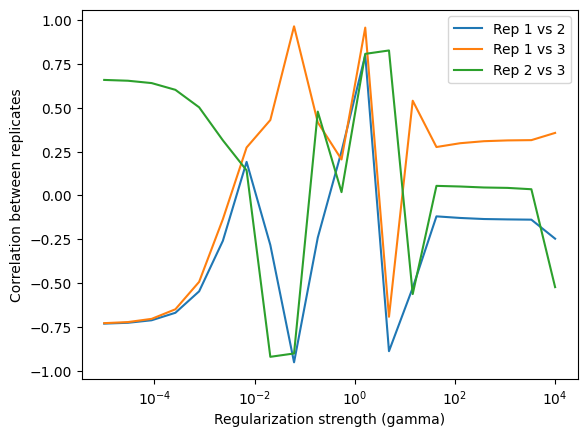

Found best regularization strength gamma = 1.6e+00, R = 0.85
Wrote inference results for layer 20
Analyzing layer 21
corrs_list: [[np.float64(0.8902519327549133), np.float64(0.6058489540314378), np.float64(0.7671645383381576)], [np.float64(0.8884387116743602), np.float64(0.6025105745426772), np.float64(0.7656345560283694)], [np.float64(0.8830308590439614), np.float64(0.5929311017323516), np.float64(0.7613270451598665)], [np.float64(0.8669186099222634), np.float64(0.5674585791323028), np.float64(0.7505523454259607)], [np.float64(0.8207608022648736), np.float64(0.5151974934629224), np.float64(0.7332028136149806)], [np.float64(0.7326840011466638), np.float64(0.49683101413522995), np.float64(0.7511526357364782)], [np.float64(0.9238935566736388), np.float64(0.8852484391456825), np.float64(0.9526006927981593)], [np.float64(-0.7592106909224453), np.float64(-0.9037692553187723), np.float64(0.8957882580593771)], [np.float64(0.07432136719981436), np.float64(0.07380556935201193), np.float64(0.381

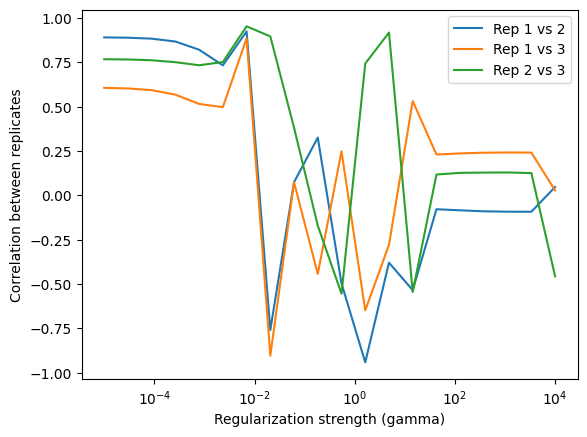

Found best regularization strength gamma = 7.0e-03, R = 0.92
Wrote inference results for layer 21
Analyzing layer 22
corrs_list: [[np.float64(-0.2820665739469255), np.float64(0.7192886057239027), np.float64(-0.30144827396025714)], [np.float64(-0.27978641604217663), np.float64(0.7096236666780208), np.float64(-0.2800234706162724)], [np.float64(-0.27272496351628195), np.float64(0.6804908950542267), np.float64(-0.2136208022945613)], [np.float64(-0.2502257609033052), np.float64(0.5915641995297616), np.float64(-0.0020524986192253236)], [np.float64(-0.19148689002647312), np.float64(0.331750748981859), np.float64(0.5630642761291208)], [np.float64(0.32207846855993033), np.float64(0.40431160128059396), np.float64(0.9695986748829108)], [np.float64(-0.5213935110990113), np.float64(0.8965289854203679), np.float64(-0.22269634835175722)], [np.float64(-0.6404776054594745), np.float64(0.37903022195599967), np.float64(0.42799070317205856)], [np.float64(-0.04277798980401594), np.float64(0.149872536901210

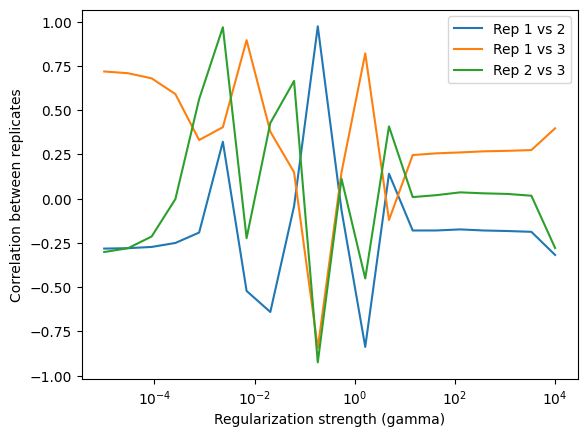

Found best regularization strength gamma = 2.3e-03, R = 0.57
Wrote inference results for layer 22
Analyzing layer 23
corrs_list: [[np.float64(0.2903736828561725), np.float64(0.040631737978987406), np.float64(-0.2936909324638932)], [np.float64(0.2895639658694295), np.float64(0.040987784094339334), np.float64(-0.2926754064810135)], [np.float64(0.2871515523572969), np.float64(0.04203709812409378), np.float64(-0.2896665850875786)], [np.float64(0.2799505661001531), np.float64(0.04506960436057282), np.float64(-0.28083176696991297)], [np.float64(0.25834818144571287), np.float64(0.053331455414010735), np.float64(-0.2555717989038453)], [np.float64(0.19290271723179114), np.float64(0.07204029727041093), np.float64(-0.18878704172589278)], [np.float64(-0.004688410525720915), np.float64(0.09143799979434032), np.float64(-0.0497685614027836)], [np.float64(0.25501582273978585), np.float64(0.43602796537280264), np.float64(0.9357273271557043)], [np.float64(-0.569521676675613), np.float64(0.25376278182826

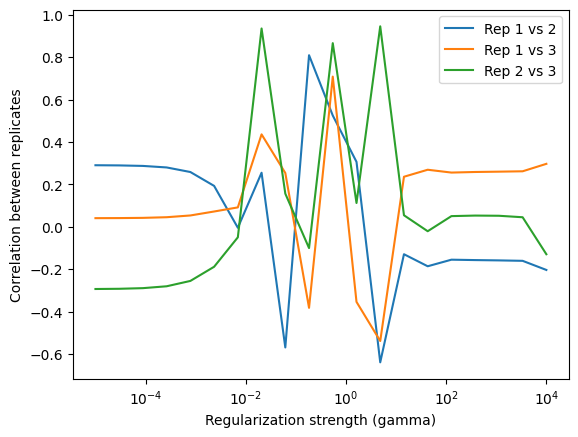

Found best regularization strength gamma = 5.5e-01, R = 0.70
Wrote inference results for layer 23
Analyzing layer 24
corrs_list: [[np.float64(-0.13914176773488104), np.float64(-0.02394198757751881), np.float64(0.34024945443941895)], [np.float64(-0.13876637882408177), np.float64(-0.023663245602998123), np.float64(0.3403511635591706)], [np.float64(-0.13764892223736483), np.float64(-0.022833460028578473), np.float64(0.3406529377688293)], [np.float64(-0.1343214951495707), np.float64(-0.020362677317644795), np.float64(0.3415425295881005)], [np.float64(-0.12440468018901571), np.float64(-0.013007237155301138), np.float64(0.34410900696782365)], [np.float64(-0.09476736722534401), np.float64(0.008687499252665015), np.float64(0.3508978867184594)], [np.float64(-0.005247794460108805), np.float64(0.0648154948454383), np.float64(0.36043857196057366)], [np.float64(0.7201222814158197), np.float64(0.964699101534341), np.float64(0.8335579269486368)], [np.float64(0.11196622141047102), np.float64(0.1028707

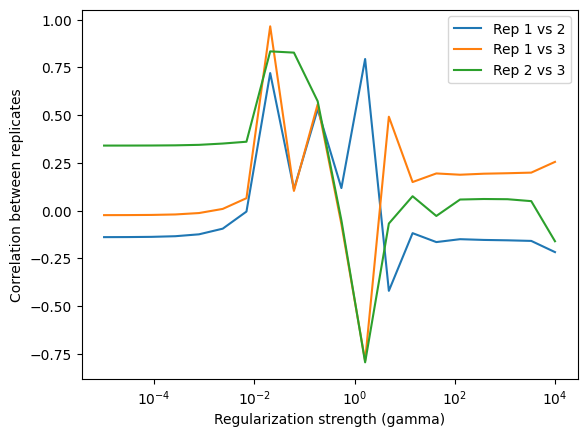

Found best regularization strength gamma = 2.1e-02, R = 0.84
Wrote inference results for layer 24
Analyzing layer 25
corrs_list: [[np.float64(-0.47485057527160446), np.float64(0.8212948357095007), np.float64(-0.5816884355659435)], [np.float64(-0.4805688100450449), np.float64(0.8229988321910221), np.float64(-0.5866880224273663)], [np.float64(-0.49772807306152356), np.float64(0.8280626356019686), np.float64(-0.6017312539942967)], [np.float64(-0.5499083775074303), np.float64(0.8430429615356478), np.float64(-0.6478069618406352)], [np.float64(-0.7093893168573724), np.float64(0.8861320567479265), np.float64(-0.790446665008535)], [np.float64(0.9523226627472883), np.float64(0.9713727104471144), np.float64(0.9729334949107151)], [np.float64(-0.41360866833047816), np.float64(-0.8458645932225367), np.float64(0.29498031593213814)], [np.float64(0.3317699481357106), np.float64(0.255501005576776), np.float64(-0.20125081868368935)], [np.float64(0.5998518088544588), np.float64(-0.9360735153788842), np.f

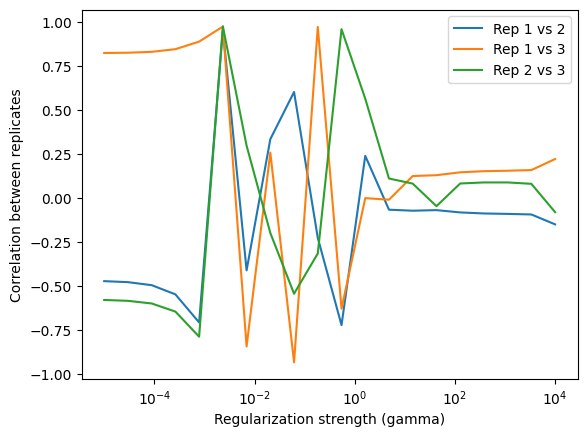

Found best regularization strength gamma = 2.3e-03, R = 0.97
Wrote inference results for layer 25
Analyzing layer 26
corrs_list: [[np.float64(-0.13809163501834576), np.float64(0.2167758307827149), np.float64(-0.11432712009696476)], [np.float64(-0.13749633027039052), np.float64(0.21640679859418777), np.float64(-0.1141969471211724)], [np.float64(-0.13573946680742757), np.float64(0.2153408927757611), np.float64(-0.11381762169561598)], [np.float64(-0.13063781356948342), np.float64(0.21244679548708456), np.float64(-0.11275548670416809)], [np.float64(-0.11645618304902416), np.float64(0.20607816697407347), np.float64(-0.11007177575525369)], [np.float64(-0.08052945365318155), np.float64(0.20248427545992717), np.float64(-0.10424868354981458)], [np.float64(0.013622283467623786), np.float64(0.26661893225284705), np.float64(-0.08302776409363388)], [np.float64(0.6827186561190016), np.float64(0.6436459117965599), np.float64(0.23025926666160992)], [np.float64(-0.2037957985081125), np.float64(0.389679

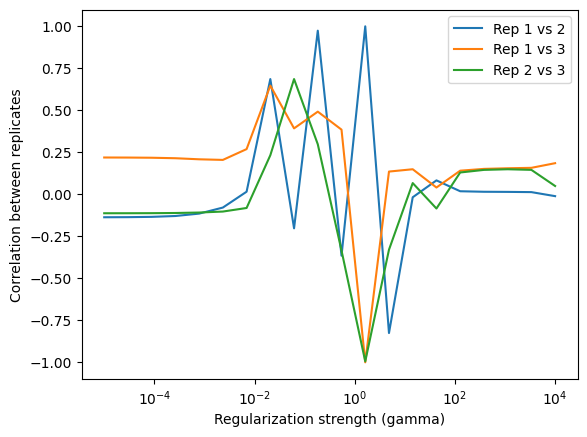

Found best regularization strength gamma = 1.8e-01, R = 0.58
Wrote inference results for layer 26
Analyzing layer 27
corrs_list: [[np.float64(-0.6825550611067822), np.float64(0.15319264926976298), np.float64(0.13031705204895117)], [np.float64(-0.6821779755940227), np.float64(0.15969719856550807), np.float64(0.12276898767468247)], [np.float64(-0.6812649614514199), np.float64(0.1790001852897934), np.float64(0.10001784690822921)], [np.float64(-0.6804546322225131), np.float64(0.23593214012851757), np.float64(0.02971811077491223)], [np.float64(-0.6960758778118088), np.float64(0.4000852028722534), np.float64(-0.20300177654018248)], [np.float64(-0.8571669910234404), np.float64(0.8012328562067007), np.float64(-0.9242530333951392)], [np.float64(-0.47610836061818623), np.float64(0.6539590008493326), np.float64(-0.2065699675521941)], [np.float64(0.20226513210485414), np.float64(0.48551831181297356), np.float64(-0.369505425445803)], [np.float64(0.6901310479001548), np.float64(0.5621454658456368), 

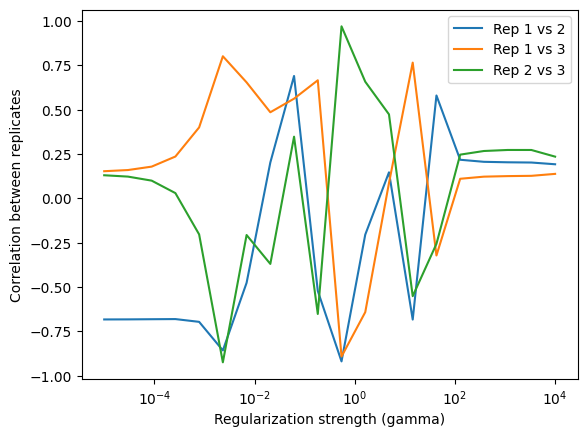

Found best regularization strength gamma = 6.2e-02, R = 0.53
Wrote inference results for layer 27
Analyzing layer 28
corrs_list: [[np.float64(0.16854976596889848), np.float64(0.40593230426023114), np.float64(0.8051177049291578)], [np.float64(0.16586669897395828), np.float64(0.4033650216277697), np.float64(0.8041879852117543)], [np.float64(0.15818121096871246), np.float64(0.3959742632849732), np.float64(0.8014432808862711)], [np.float64(0.13773984689956342), np.float64(0.37601259725488473), np.float64(0.7934697047701601)], [np.float64(0.09374705865139277), np.float64(0.3308115151496901), np.float64(0.7713799295991363)], [np.float64(0.044062238664152334), np.float64(0.266277615875544), np.float64(0.7179866331865918)], [np.float64(0.10512445521540326), np.float64(0.27126321190253977), np.float64(0.6324374333297937)], [np.float64(0.6059401030869672), np.float64(0.704948460001853), np.float64(0.7599400817778464)], [np.float64(0.46742869975035184), np.float64(0.3490803667329285), np.float64(

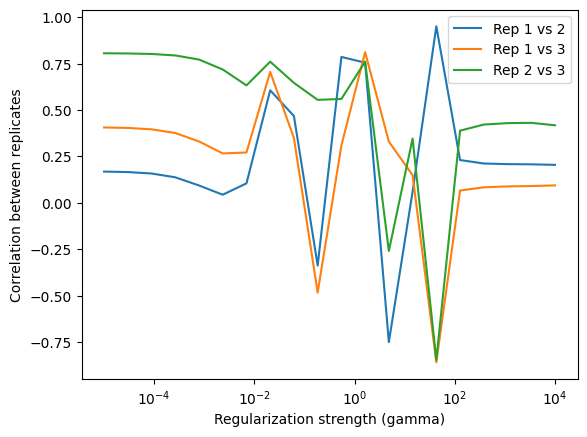

Found best regularization strength gamma = 1.6e+00, R = 0.78
Wrote inference results for layer 28
Analyzing layer 29
corrs_list: [[np.float64(-0.26804612179521237), np.float64(-0.679344891349088), np.float64(0.8285395433782554)], [np.float64(-0.2665489929848368), np.float64(-0.6753870879562569), np.float64(0.8314282007521401)], [np.float64(-0.2641137405471196), np.float64(-0.6651890467781278), np.float64(0.8396761638613158)], [np.float64(-0.27220437769270994), np.float64(-0.6482452003892377), np.float64(0.8610084218118703)], [np.float64(-0.3826471066983152), np.float64(-0.6844334182639918), np.float64(0.9025859520456967)], [np.float64(-0.8095176475906162), np.float64(-0.9266481337395189), np.float64(0.9586239661732856)], [np.float64(-0.8169920322847045), np.float64(-0.8294933300745075), np.float64(0.9902900104316572)], [np.float64(-0.5048407265907083), np.float64(-0.5678945816494483), np.float64(0.8945326856517188)], [np.float64(-0.8849256981288388), np.float64(0.6818617628971068), np.

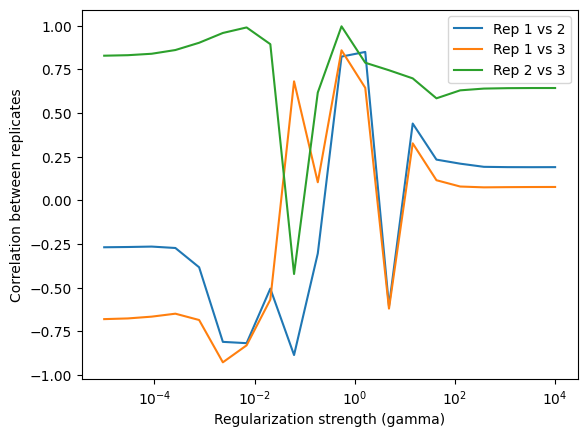

Found best regularization strength gamma = 5.5e-01, R = 0.89
Wrote inference results for layer 29
Analyzing layer 30
corrs_list: [[np.float64(0.37509832380512564), np.float64(-0.07803254392995233), np.float64(0.5745838631528616)], [np.float64(0.36215919950321), np.float64(-0.08201372146327039), np.float64(0.5948978865253691)], [np.float64(0.3287247268975198), np.float64(-0.09958492580700082), np.float64(0.6388682429910961)], [np.float64(0.27879264470223114), np.float64(-0.16894572885671633), np.float64(0.6991727497928005)], [np.float64(-0.6917572734765886), np.float64(-0.9526165301908225), np.float64(0.8436897925469631)], [np.float64(0.5605878139736615), np.float64(0.740238393391087), np.float64(0.9672831864736194)], [np.float64(0.3180686509831881), np.float64(0.6074773057572884), np.float64(0.8178674292688904)], [np.float64(0.30249461066521666), np.float64(0.16774717232423406), np.float64(0.8675104742859574)], [np.float64(0.8980972042998869), np.float64(0.8320755150237634), np.float64

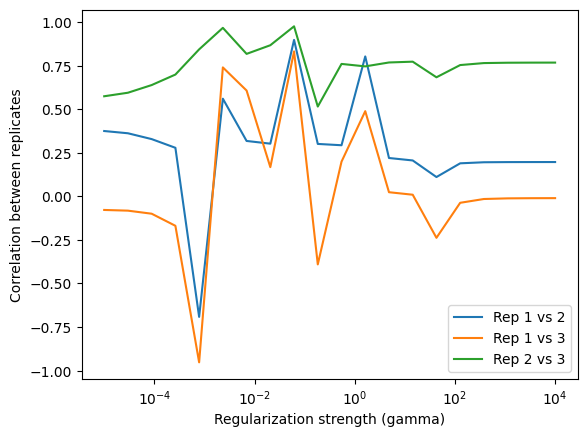

Found best regularization strength gamma = 6.2e-02, R = 0.90
Wrote inference results for layer 30


In [35]:
reload(popDMS)

layer_results = analyze_layers(whole_df, output_path=pwd + '/data/inference_results/scrambled',
                    embed_path=pwd + '/data/scrambled_embeds', dataname='BF520')

# Testing Differences in Average embeddings by replicate with and without scrambling

In [40]:
whole_df = pd.read_pickle(pwd + '/data/sequence_data/all_reps_BF520_protein_embeddings.pkl')
whole_df = whole_df[whole_df["Embeddings"].notnull()].reset_index(drop=True)
scrambled_df = whole_df.copy()


for i in range(scrambled_df.shape[0]):
    if scrambled_df.at[i, "Embeddings"] is not None:
        random_pre_num = np.random.randint(0, 100, size=(3,))
        random_post_num = np.random.randint(0, 100, size=(3,))
        
        scrambled_df.at[i, "PreNums"] = random_pre_num.tolist()
        scrambled_df.at[i, "PostNums"] = random_post_num.tolist()
        
print(whole_df.head())
print(scrambled_df.head())

          PreNums         PostNums  \
0  [110, 164, 94]  [114, 173, 207]   
1       [1, 0, 0]        [1, 1, 1]   
2       [0, 0, 1]       [3, 2, 12]   
3       [0, 2, 0]        [0, 0, 1]   
4    [70, 94, 64]    [45, 90, 107]   

                                     ProteinSequence  \
0  TGNLWVTVYYGVPVWKDAETTLFCASDAKAYDAEVHNIWATHACVP...   
1  PGNLWVTVYYGVPVWKDAETTLFCASDAKAYDAEVHNIWATHACVP...   
2  EGNLWVTVYYGVPVWKDAETTLFCASDAKAYDAEVHNIWATHACVP...   
3  GGNLWVTVYYGVPVWKDAETTLFCASDAKAYDAEVHNIWATHACVP...   
4  VGNLWVTVYYGVPVWKDAETTLFCASDAKAYDAEVHNIWATHACVP...   

                                          Embeddings  
0  [[-0.031634934, -0.027693663, -0.043913726, -0...  
1  [[-0.03163283, -0.027663246, -0.043426607, -0....  
2  [[-0.031192306, -0.027531173, -0.043862768, -0...  
3  [[-0.031604197, -0.027621143, -0.043950938, -0...  
4  [[-0.03162442, -0.027583366, -0.043893382, -0....  
        PreNums      PostNums  \
0  [44, 40, 24]  [27, 40, 37]   
1  [16, 50, 26]  [78, 56, 41]   
2  [1

So, we want to calculate the weighted average embeddings for each replicate, both with and without scrambling, and then compare the differences between these averages.

In [41]:
def calculate_weighted_average(frequencies, embeddings):
    """
    Calculate the weighted average of embeddings given frequencies.
    frequencies: 1D array of shape (num_sequences,)
    embeddings: 2D array of shape (num_sequences, embedding_dim)
    """
    frequencies = np.array(frequencies)
    embeddings = np.array(embeddings)
    
    total_frequency = np.sum(frequencies)
    if total_frequency == 0:
        return np.zeros(embeddings.shape[1])
    
    weighted_sum = np.sum(embeddings.T * frequencies, axis=1)
    weighted_average = weighted_sum / total_frequency
    return weighted_average

In [42]:
# Whole DF 

n_reps = 3

frequencies_pre = np.array([np.array(x) for x in whole_df["PreNums"].to_list()])
frequencies_post = np.array([np.array(x) for x in whole_df["PostNums"].to_list()])
embeddings = np.array([x for x in whole_df["Embeddings"].to_list()])

print(frequencies_pre.shape, frequencies_post.shape, embeddings.shape)


(39445, 3) (39445, 3) (39445, 31, 640)


In [43]:
average_embeddings_pre = []
average_embeddings_post = []

for layer in range(31):
    layer_embeddings = embeddings[:, layer, :]
    for rep in range(n_reps):
        avg_pre = calculate_weighted_average(frequencies_pre[:, rep], layer_embeddings)
        avg_post = calculate_weighted_average(frequencies_post[:, rep], layer_embeddings)
        average_embeddings_pre.append(avg_pre)
        average_embeddings_post.append(avg_post)
    
average_embeddings_pre = np.array(average_embeddings_pre).reshape((31, n_reps, -1))
average_embeddings_post = np.array(average_embeddings_post).reshape((31, n_reps, -1))

In [44]:
print(average_embeddings_post.shape, average_embeddings_pre.shape)

(31, 3, 640) (31, 3, 640)


In [47]:
# Scrambled DF
frequencies_pre = np.array([np.array(x) for x in scrambled_df["PreNums"].to_list()])
frequencies_post = np.array([np.array(x) for x in scrambled_df["PostNums"].to_list()])
embeddings = np.array([x for x in scrambled_df["Embeddings"].to_list()])
print(frequencies_pre.shape, frequencies_post.shape, embeddings.shape)
average_embeddings_pre_scrambled = []
average_embeddings_post_scrambled = []
for layer in range(31):
    layer_embeddings = embeddings[:, layer, :]
    for rep in range(n_reps):
        avg_pre = calculate_weighted_average(frequencies_pre[:, rep], layer_embeddings)
        avg_post = calculate_weighted_average(frequencies_post[:, rep], layer_embeddings)
        average_embeddings_pre_scrambled.append(avg_pre)
        average_embeddings_post_scrambled.append(avg_post)

average_embeddings_pre_scrambled = np.array(average_embeddings_pre_scrambled).reshape((31, n_reps, -1))
average_embeddings_post_scrambled = np.array(average_embeddings_post_scrambled).reshape((31, n_reps, -1))
print(average_embeddings_post_scrambled.shape, average_embeddings_pre_scrambled.shape)

(39445, 3) (39445, 3) (39445, 31, 640)
(31, 3, 640) (31, 3, 640)


In [48]:
layer_differences = average_embeddings_post - average_embeddings_pre
layer_differences_scrambled = average_embeddings_post_scrambled - average_embeddings_pre_scrambled

print(layer_differences.shape, layer_differences_scrambled.shape)

(31, 3, 640) (31, 3, 640)


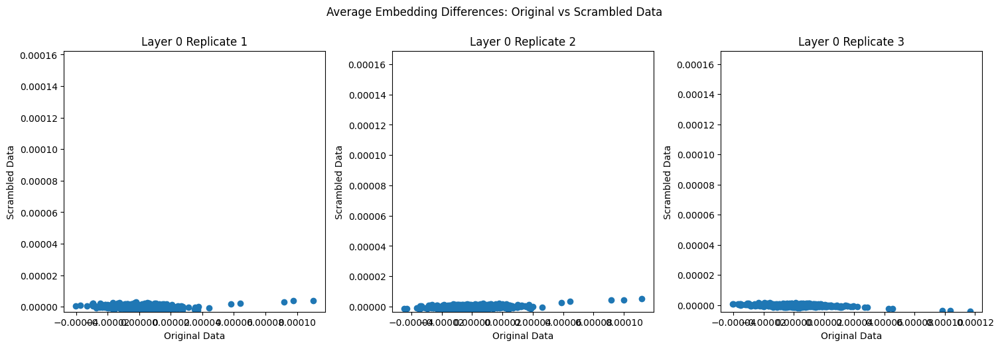

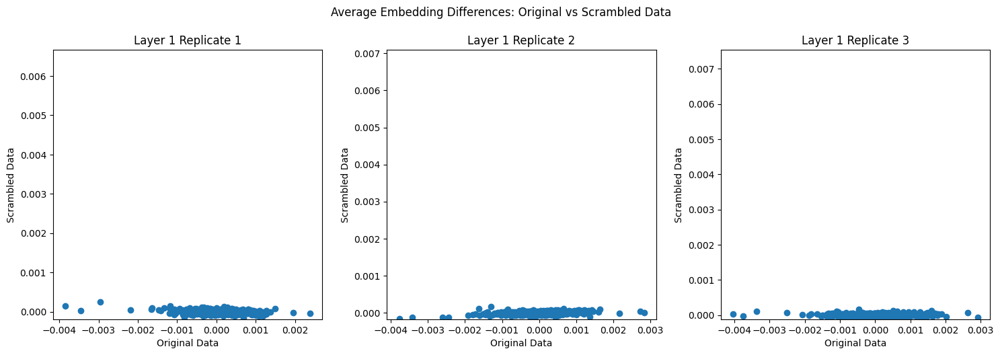

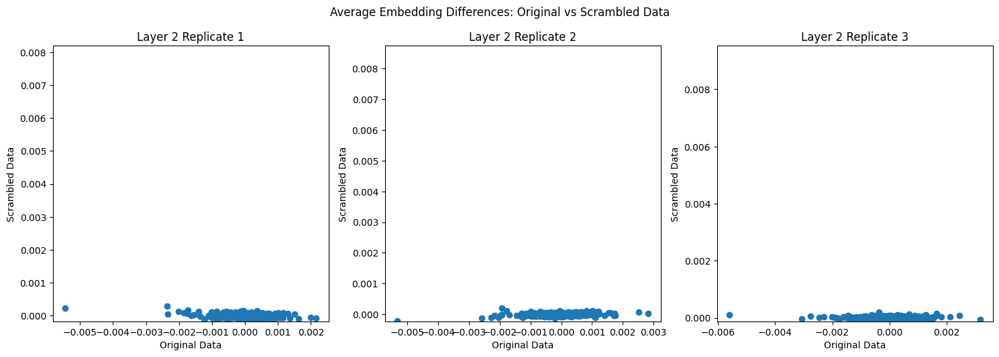

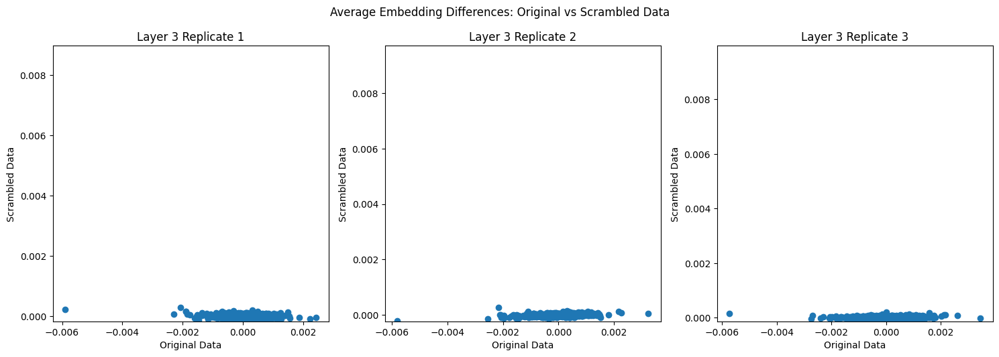

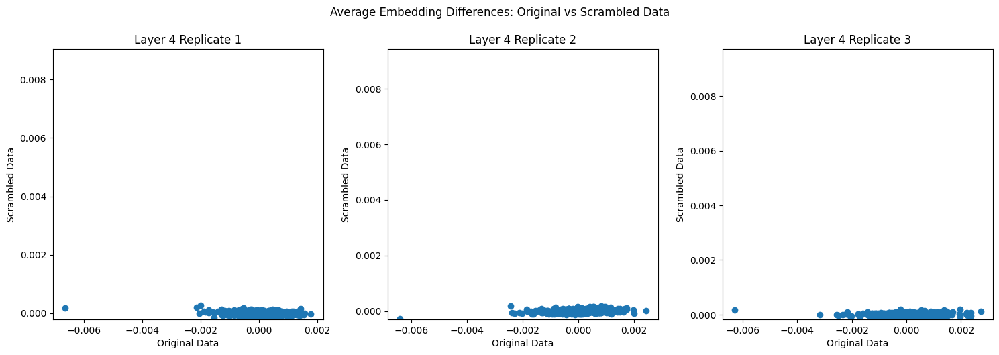

...

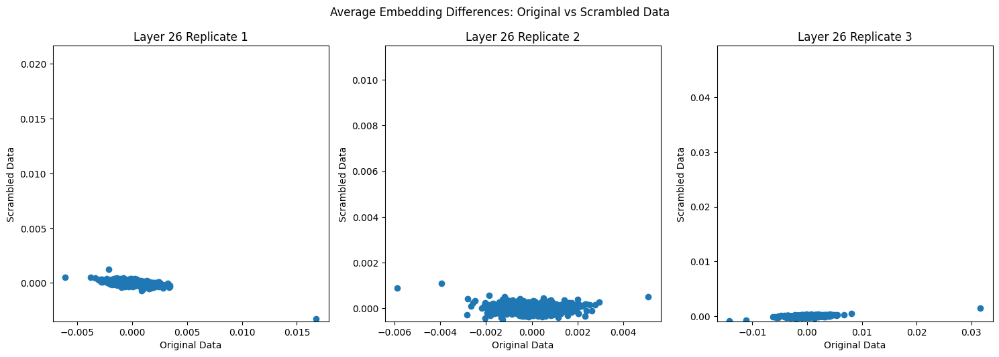

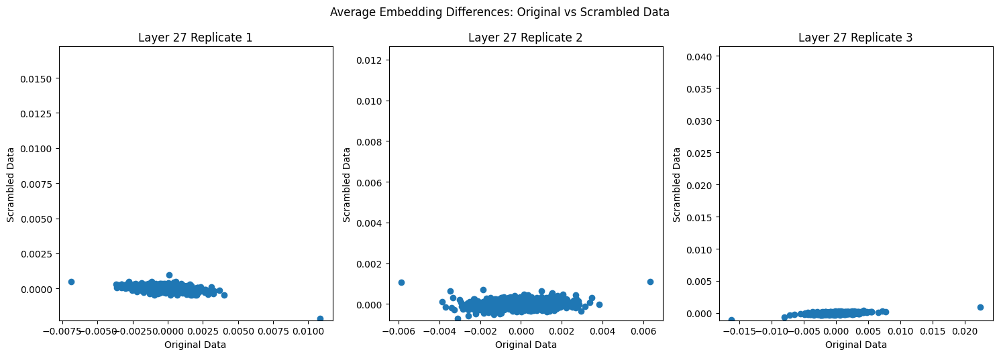

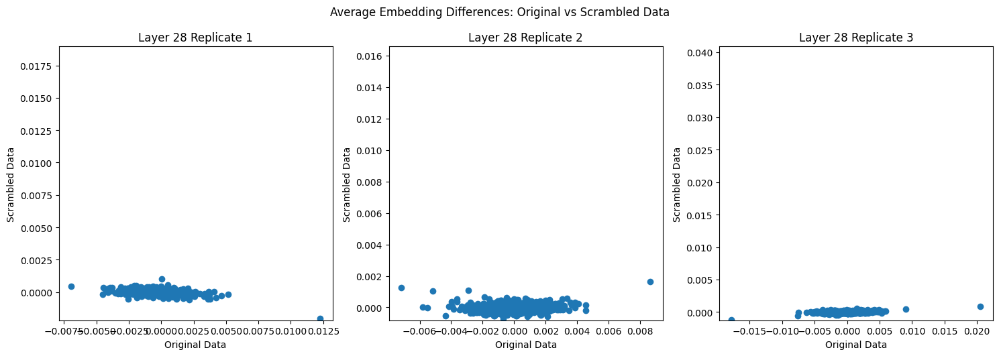

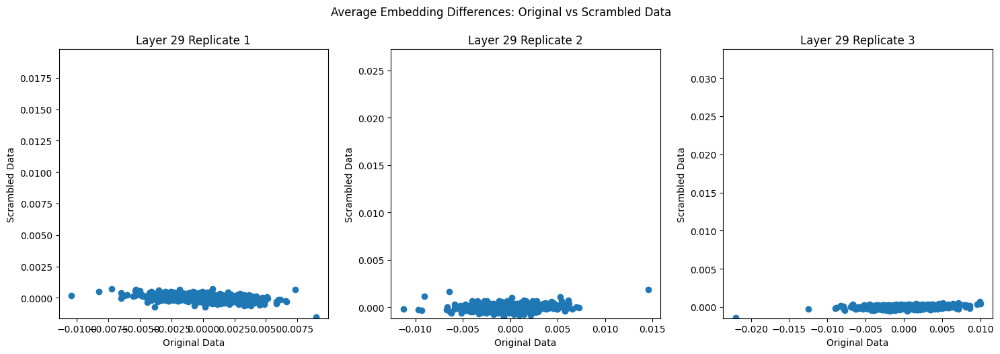

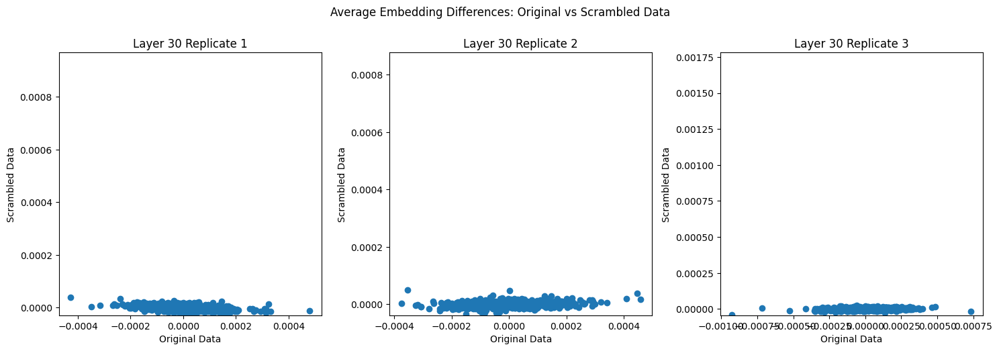

In [49]:
import matplotlib.pyplot as plt

for layer in range(31):
    # subplot for each rep
    fig = plt.figure(figsize=(15, 5))
    for rep in range(n_reps):
        plt.subplot(1, n_reps, rep+1)
        plt.title(f'Layer {layer} Replicate {rep+1}')
        plt.scatter(layer_differences[layer, rep, :], layer_differences_scrambled[layer, rep, :])
        plt.xlabel('Original Data')
        plt.ylabel('Scrambled Data')
        plt.axis('square')
    plt.tight_layout()
    plt.suptitle("Average Embedding Differences: Original vs Scrambled Data", y=1.05)
    plt.show()
